# !!!!!!!!!!!!!!!!!!!!!!!

# FIX IDEAS FOR SLOW DATA LOADING

### Probar a cargar por completo el fichero como un df y en __getindex__ poner simplemente el pillar el df como siempre, en vez de esta cosa rara???
### Puedo poner prints en DataGen de tiempo y ver cuánto tarda en indexar y esas cosas

# !!!!!!!!!!!!!!!!!!!!!!!

## DECOLABEL results

I have run first tests for the UNet with the segmentation label, and here I'll take a look to them

### The data shown is Soprhonia for latest 4 bar DoubleScape production.

### Data

Firstly let's take a look to the data, how it behaves (more or less) using the info of the labelling.

In [1]:
import os
import sys
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
sys.path.append('/home/usc/ie/mpm/NEXT_graphs')

from NEXT_graphNN.utils.read_tensorboard import load_tensorboard_df
from sklearn.metrics import roc_curve, auc

from invisible_cities.io.dst_io import load_dst
sys.path.append(os.getenv('HOME') + '/data_labelling/')

from utils.plotting_utils import plot_3d_hits, plot_3d_vox, plot_cloud_voxels_and_hits, plot_cloud_voxels_and_hits_discrete

sys.path.append(os.getenv('HOME') + '/NEXT_SPARSECONVNET/')

In [2]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd

def get_voxel_info(voxel_info):
    sizes = [voxel_info['size_x'].values[0], voxel_info['size_y'].values[0], voxel_info['size_z'].values[0]]
    mins = [voxel_info['min_x'].values[0], voxel_info['min_y'].values[0], voxel_info['min_z'].values[0]]
    return sizes, mins

def transform_voxels(df, voxel_info, coords = ['xbin', 'ybin', 'zbin']):
    sizes, mins = get_voxel_info(voxel_info)
    df = df.copy()
    for coor, size, min_val in zip(coords, sizes, mins):
        df[coor] = df[coor] * size + min_val + size / 2   # centers
    return df, sizes, mins

def plot_3d_hits(
    hits, value='energy', coords=['xbin', 'ybin', 'zbin'],
    cmap=mpl.cm.jet, opacity=1, title = '', buffer=10, mc_hits=None, 
    mc_hits_label = 'MC hits', voxel_info=None, frame_lims = None, cmlims = None, 
    frameon = True, save_plot = False, init_view = None,
    plot_mode="scatter"   # <-- NEW ARGUMENT
):
    if not isinstance(hits, pd.DataFrame):
        coor = np.array(hits).T
        hits = pd.DataFrame(coor, columns=coords + [value])
    df = hits.copy()
    # Reverse voxelization transformation
    sizes, mins = None, None
    if voxel_info is not None:
        df, sizes, mins = transform_voxels(df, voxel_info, coords = coords)

    xcoord = df[coords[0]].values
    ycoord = df[coords[1]].values
    zcoord = df[coords[2]].values
    content = df[value].values

    fig = plt.figure(figsize=(8, 8), frameon=frameon)
    gs = fig.add_gridspec(12, 12)
    ax = fig.add_subplot(gs[0:12, 0:10], projection='3d')
    axcb = fig.add_subplot(gs[1:11, 11])
    if cmlims: vmin, vmax = cmlims[0], cmlims[1]
    else: vmin, vmax = min(content), max(content)
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    ax.set_title(title)
    m = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    colors = np.asarray(m.to_rgba(content))

    # --- CHANGED HERE ---
    if plot_mode == "scatter":
        ax.scatter(xcoord, ycoord, zcoord, c=colors, marker='o', alpha=opacity, label=None)

    elif plot_mode == "voxels":
        if voxel_info is None:
            raise ValueError("plot_mode='voxels' requires voxel_info.")

        dx, dy, dz = sizes

        # build grid edges in world coordinates
        x_edges = np.arange(mins[0], max(xcoord) + dx, dx)
        y_edges = np.arange(mins[1], max(ycoord) + dy, dy)
        z_edges = np.arange(mins[2], max(zcoord) + dz, dz)

        # grid shape
        nx, ny, nz = len(x_edges) - 1, len(y_edges) - 1, len(z_edges) - 1

        filled = np.zeros((nx, ny, nz), dtype=bool)
        facecolors = np.zeros((nx, ny, nz, 4))  # RGBA

        # map each hit to voxel index
        ix = ((xcoord - mins[0]) // dx).astype(int)
        iy = ((ycoord - mins[1]) // dy).astype(int)
        iz = ((zcoord - mins[2]) // dz).astype(int)

        for i, j, k, c in zip(ix, iy, iz, colors):
            if 0 <= i < nx and 0 <= j < ny and 0 <= k < nz:
                filled[i, j, k] = True
                facecolors[i, j, k, :] = [c[0], c[1], c[2], opacity]

        # build full coordinate grid of voxel corners
        xg, yg, zg = np.meshgrid(x_edges, y_edges, z_edges, indexing="ij")
        # now tell ax.voxels about *real* coordinates
        ax.voxels(
            xg, yg, zg,
            filled, facecolors=facecolors,
            edgecolor="k", linewidth=0.2
        )
    # --------------------

    # Set axis limits with buffer
    x_min, x_max = min(xcoord), max(xcoord)
    y_min, y_max = min(ycoord), max(ycoord)
    z_min, z_max = min(zcoord), max(zcoord)

    # Add MC hits if provided
    if mc_hits is not None:
        if not isinstance(mc_hits, pd.DataFrame):
            mc_hits = pd.DataFrame(np.array(mc_hits).T, columns=['x', 'y', 'z'])
        x_mc, y_mc, z_mc = mc_hits['x'], mc_hits['y'], mc_hits['z']
        ax.scatter(x_mc, y_mc, z_mc, c='red', marker='x', label=mc_hits_label)
        x_min, x_max = min(x_min, min(x_mc)), max(x_max, max(x_mc))
        y_min, y_max = min(y_min, min(y_mc)), max(y_max, max(y_mc))

    if frame_lims:
        (x_min, y_min, z_min), (x_max, y_max, z_max) = frame_lims        
        if voxel_info is not None:
            x_min, y_min, z_min = [(coord * size + min_val + size / 2) for coord, size, min_val in zip([x_min, y_min, z_min], sizes, mins)]
            x_max, y_max, z_max = [(coord * size + min_val + size / 2) for coord, size, min_val in zip([x_max, y_max, z_max], sizes, mins)]
        ax.set_zlim([z_min, z_max])
    ax.set_xlim([x_min - buffer, x_max + buffer])
    ax.set_ylim([y_min - buffer, y_max + buffer])
    ax.set_zlim([z_min, z_max])

    cb = mpl.colorbar.ColorbarBase(axcb, cmap=cmap, norm=norm, orientation='vertical')

    ax.set_xlabel('X ')
    ax.set_ylabel('Y ')
    ax.set_zlabel('Z ')
    cb.set_label(value, size=15)
    cb.ax.tick_params(labelsize=13)
    cb.formatter.set_powerlimits((0, 0))
    # Show legend only if there are labels
    handles, labels = ax.get_legend_handles_labels()
    if labels:
        ax.legend()
    if init_view:
        ax.view_init(elev=init_view[0], azim=init_view[1])
    if not save_plot:
        plt.show()

In [3]:
def create_plot_grid(df, xname, yname, val):
    x_centers = np.sort(df[xname].unique())
    y_centers = np.sort(df[yname].unique())
    # Create a pivot table to reshape energy values into a grid
    pivot = df.pivot(index=yname, columns=xname, values=val)  # Y as rows, X as cols
    values = pivot.values

    # Calculate bin edges from centers
    x_edges = np.concatenate((
    [x_centers[0] - 0.5 * (x_centers[1] - x_centers[0])], 0.5 * (x_centers[1:] + x_centers[:-1]), [x_centers[-1] + 0.5 * (x_centers[-1] - x_centers[-2])]
    ))
    y_edges = np.concatenate((
    [y_centers[0] - 0.5 * (y_centers[1] - y_centers[0])], 0.5 * (y_centers[1:] + y_centers[:-1]), [y_centers[-1] + 0.5 * (y_centers[-1] - y_centers[-2])]
    ))
    values_masked = np.ma.masked_invalid(values)
    return x_edges, y_edges, values_masked

def create_xy_bins(df, coords = ['xbin', 'ybin', 'zbin'], pitch = [15.55, 15.55, 10]):
    x_min, x_max = df[coords[0]].min() - pitch[0]/2, df[coords[0]].max() + pitch[0]/2
    y_min, y_max = df[coords[1]].min() - pitch[1]/2, df[coords[1]].max() + pitch[1]/2
    z_min, z_max = df[coords[2]].min() - pitch[2]/2, df[coords[2]].max() + pitch[2]/2
    x_bins = np.arange(x_min, x_max + pitch[0], pitch[0])
    y_bins = np.arange(y_min, y_max + pitch[1], pitch[1])
    z_bins = np.arange(z_min, z_max + pitch[2], pitch[2])
    return x_bins, y_bins, z_bins

In [4]:
def plot_class_hist(df, value, label = 'decolabel', nbins = 100, rang = None, density = False, alpha = 0.5, title = '', xlabel = '', ylabel = '', yscale = 'linear', cmap = plt.cm.viridis.copy(), labels = ['Core', 'Halo'], histtype = 'stepfilled'):
    if rang == None:
        rang = (df[value].min(), df[value].max())
    plt.hist(df[df[label] == 1][value], nbins, range = rang, density = density, alpha = alpha, label = labels[0], color = cmap(cmap.N-1), histtype = histtype, edgecolor = 'black')
    plt.hist(df[df[label] == 0][value], nbins, range = rang, density = density, alpha = alpha, label = labels[1], color = cmap(0), histtype = histtype, edgecolor = 'black')
    plt.title(title, size = 18)
    plt.xlabel(xlabel, size = 18)
    plt.ylabel(ylabel, size = 18)
    plt.yscale(yscale)
    plt.xticks(size = 18)
    plt.yticks(size = 18)
    plt.legend(fontsize = 18)
    plt.grid()

In [5]:
test_file = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/HE_calib/4bar/trains/soph_deco/dataset_4bar_PORT_1a_label_scn_test.h5'
events_info = pd.read_hdf(test_file, 'DATASET/EventsInfo')
events_voxel = pd.read_hdf(test_file, 'DATASET/Voxels')
bins_info = pd.read_hdf(test_file, 'DATASET/BinsInfo')

In [6]:
# % of events of pair production
events_info.binclass.sum() / len(events_info)

0.45145631067961167

In [7]:
1 - events_info.binclass.sum() / len(events_info)

0.5485436893203883

In [8]:
bins_info

,min_x,total_x,size_x,max_x,nbins_x,min_y,total_y,size_y,max_y,nbins_y,...,total_z,size_z,max_z,nbins_z,detector_db,binning,Rmax,loss_th,ener_th,max_dis
0,-490.4,972.65,15.55,497.8,64,-487.7,972.65,15.55,500.5,64,...,1300,10,1300,130,next100,sipm,500,0.25,None,1.732051


In [8]:
voxel_size = (bins_info.size_x * bins_info.size_y * bins_info.size_z / 1000000).values[0] #dm**3

In [9]:
def voxel_class_stats(df, label, voxel_size):
    data_info = df.groupby(['dataset_id', label]).agg({'energy':[('decoener', 'sum'), ('deconvox', 'count')]})

    data_info.columns = data_info.columns.get_level_values(1)

    data_info.reset_index(inplace = True)

    data_info = data_info.merge(data_info.groupby('dataset_id').deconvox.sum().rename('tot_vox'), on = 'dataset_id')

    data_info['ratio_ene_vox'] = data_info.decoener.values / data_info.deconvox.values


    data_info['norm_nvox'] = data_info.deconvox.values / data_info.tot_vox.values


    data_info['totaldecoener'] = data_info['decoener'] * data_info['dataset_id'].map(events_info.set_index('dataset_id')['total_energy'])
    data_info['totalratio_ene_vox'] = data_info['totaldecoener'] / data_info['deconvox']
    data_info['enedensity'] = data_info['totalratio_ene_vox'] / voxel_size
    total_dens = data_info.groupby('dataset_id').sum().reset_index()[['dataset_id', 'deconvox', 'totaldecoener']]
    return data_info, total_dens

In [10]:
data_info, total_dens = voxel_class_stats(events_voxel, 'decolabel', voxel_size)

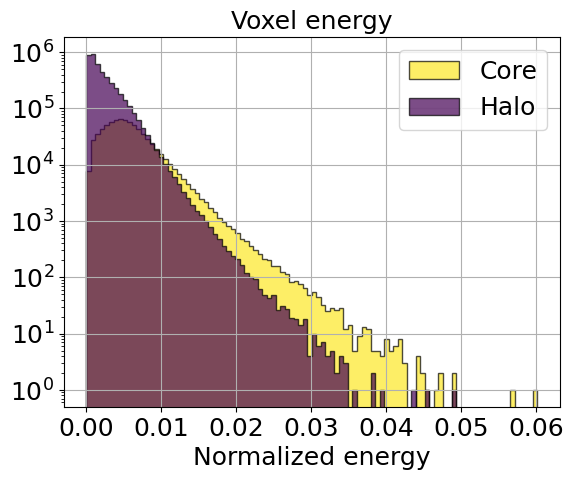

In [131]:
plot_class_hist(events_voxel, 'energy', title = 'Voxel energy', xlabel = 'Normalized energy', yscale = 'log', alpha = 0.7)

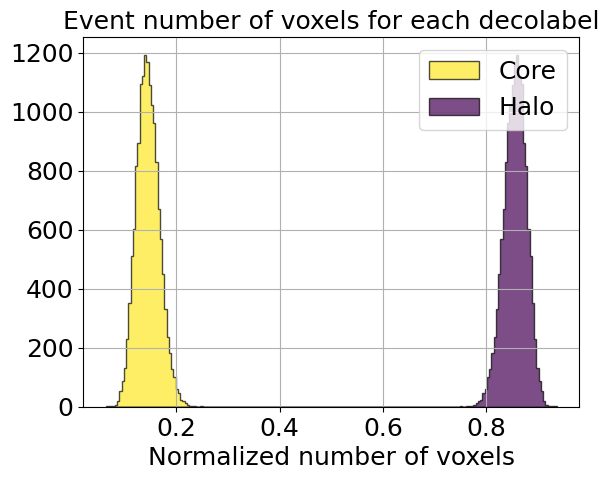

In [132]:
plot_class_hist(data_info, 'norm_nvox', nbins = 200, title = 'Event number of voxels for each decolabel', xlabel = 'Normalized number of voxels', alpha = 0.7)

In [133]:
(data_info[data_info.decolabel == 1].deconvox.values / data_info.groupby('dataset_id').deconvox.sum().values).max()

0.2493150684931507

El máximo % de voxeles que son de traza en estos eventos ronda el 25%. Es decir no debería haber eventos que tengan más de ese número en la predicción, pero evidentemente como vamos a priorizar que sea continua la traza a que limpie hits de cloud, para nosotros va a subir este valor.

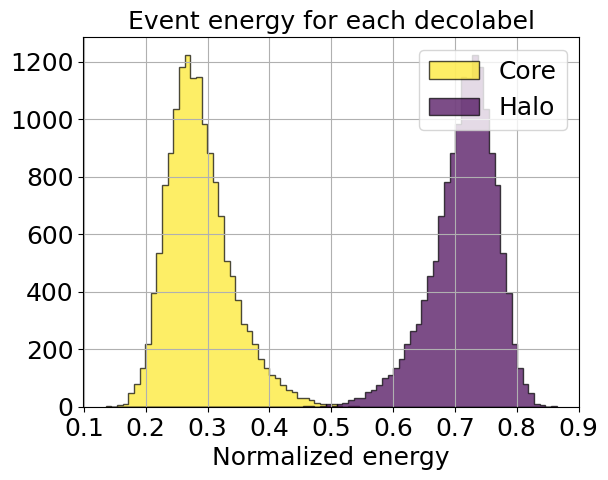

In [134]:
plot_class_hist(data_info, 'decoener', nbins = 80, title = 'Event energy for each decolabel', xlabel = 'Normalized energy', alpha = 0.7)

In [135]:
data_info[data_info.decolabel == 1].decoener.max()

0.5453246410027975

Agrupando todos los voxeles de traza, van a tener como maximísimo el 54% de la energía total, pero vemos en la distribución que en general tienen menos del 50% de la energía total.

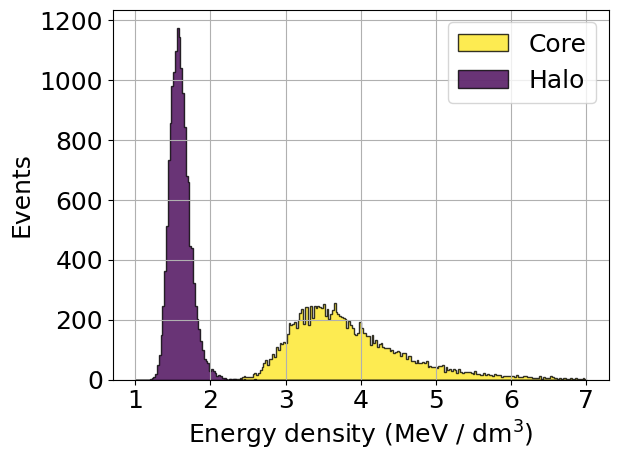

In [ ]:
plot_class_hist(data_info, 'enedensity', nbins = 250, rang = (1, 7), xlabel = 'Energy density (MeV / dm$^3$)', ylabel='Events', alpha = 0.8)
# plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/energy_density_viridis.pdf', dpi=600, bbox_inches='tight', transparent = True) 

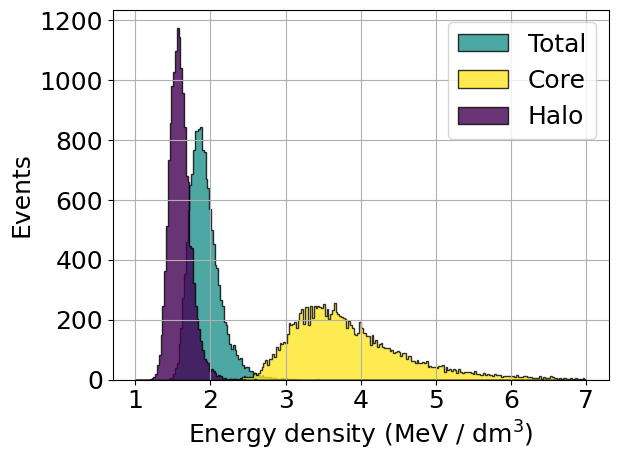

In [11]:
plt.hist(total_dens.totaldecoener / (voxel_size * total_dens.deconvox), 250, (1, 7), alpha = 0.8, histtype = 'stepfilled', color = plt.cm.viridis(128), edgecolor = 'black', label = 'Total')

plot_class_hist(data_info, 'enedensity', nbins = 250, rang = (1, 7), xlabel = 'Energy density (MeV / dm$^3$)', ylabel='Events', alpha = 0.8)
# plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/energy_density_total.pdf', dpi=600, bbox_inches='tight', transparent = True) 

In [140]:
data_info[data_info.decolabel == 1].ratio_ene_vox.min()

0.003249706176096724

Si promediamos la energía por el número de voxeles que tiene cada decolabel, vemos una clara diferenciación. La media de energía de los voxeles de traza es como mínimo 0.003 (en energía normalizada)

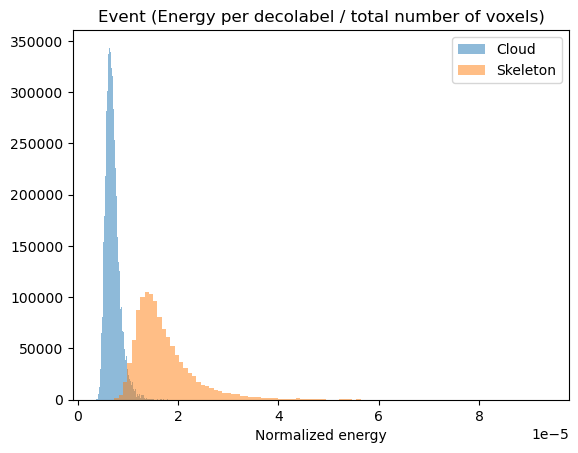

In [108]:
plt.hist(data_info[data_info.decolabel == 0].ratio_ene_vox / data_info.tot_vox, 100, density = True, alpha = 0.5, label = 'Cloud')
plt.hist(data_info[data_info.decolabel == 1].ratio_ene_vox / data_info.tot_vox, 100, density = True, alpha = 0.5, label = 'Skeleton')
plt.title('Event (Energy per decolabel / total number of voxels)')
plt.xlabel('Normalized energy')
# plt.yscale('log')
plt.legend()
plt.show()

Si promediamos la energía de cada decolabel por el número de voxeles totales no obtenemos una diferenciación tan clara, pero sigue habiendo una separación

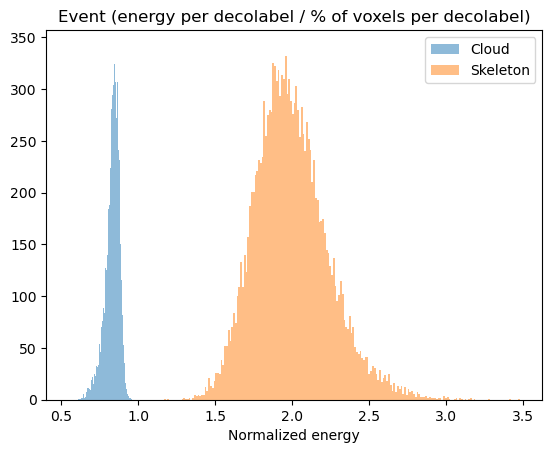

In [23]:
plt.hist(data_info[data_info.decolabel == 0].decoener / data_info[data_info.decolabel == 0].norm_nvox, 200, alpha = 0.5, label = 'Cloud')
plt.hist(data_info[data_info.decolabel == 1].decoener / data_info[data_info.decolabel == 1].norm_nvox, 200, alpha = 0.5, label = 'Skeleton')
plt.title('Event (energy per decolabel / % of voxels per decolabel)')
plt.xlabel('Normalized energy')
# plt.yscale('log')
plt.legend()
plt.show()

Este es un poco similar al que ya vimos antes con bastante separación (el de energy per decolabel / nvoxels per decolabel), pero aquí al haber dividido por el número de voxeles normalizado, la distribución para skeleton se estrecha todavía más en lugar de ser tan ancha y tener una cola larga.

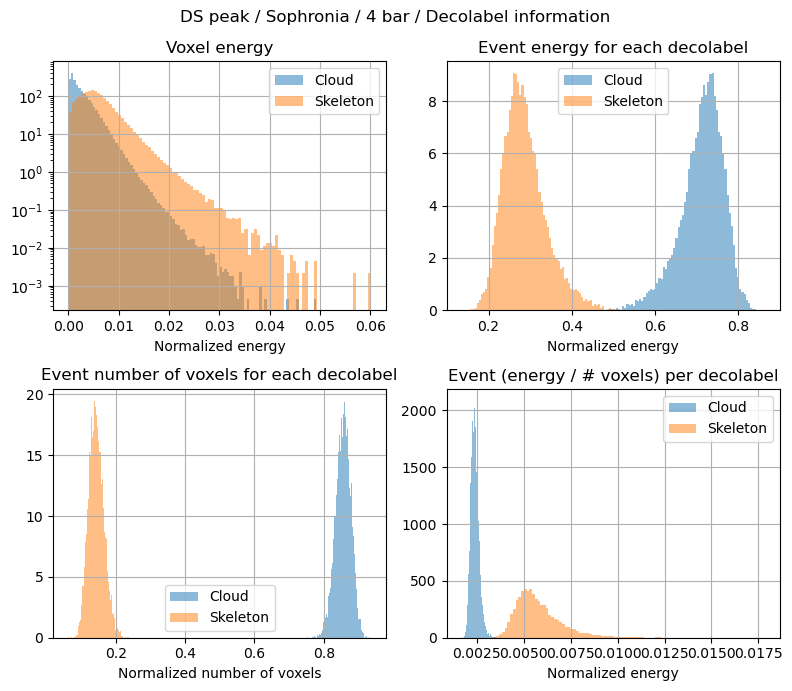

In [34]:
plt.figure(figsize = (8, 7))
plt.suptitle('DS peak / Sophronia / 4 bar / Decolabel information')

plt.subplot(2, 2, 1)
plot_class_hist(events_voxel, 'energy', title = 'Voxel energy', xlabel = 'Normalized energy', yscale = 'log')
plt.subplot(2, 2, 2)
plot_class_hist(data_info, 'decoener', nbins = 80, title = 'Event energy for each decolabel', xlabel = 'Normalized energy')
plt.subplot(2, 2, 3)
plot_class_hist(data_info, 'norm_nvox', nbins = 200, title = 'Event number of voxels for each decolabel', xlabel = 'Normalized number of voxels')
plt.subplot(2, 2, 4)
plot_class_hist(data_info, 'ratio_ene_vox', nbins = 100, title = 'Event (energy / # voxels) per decolabel', xlabel = 'Normalized energy')
plt.tight_layout()

### Train evolution

In [6]:
def plot_tb_results(file, title, figsize = (8, 7)):

    if isinstance(file, str):
        tb = load_tensorboard_df(file)
    if isinstance(file, list):
        tbs = [load_tensorboard_df(f) for f in file]
        for i in range(1, len(tbs)):
            tbs[i]['step'] += tbs[i-1]['step'].max() + 1
            tb = pd.concat(tbs, ignore_index=True)

    plt.figure(figsize = figsize)
    plt.suptitle(title)
    plt.subplot(2, 2, (1, 2))
    plt.plot(tb.step, tb.loss_train, label = 'Train')
    plt.plot(tb.step, tb.loss_valid, label = 'Valid')
    plt.grid()
    plt.yscale('log')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(2, 2, 3)
    plt.plot(tb.step, tb.iou_train_0class, label = 'Train')
    plt.plot(tb.step, tb.iou_valid_0class, label = 'Valid')
    plt.grid()
    # plt.yscale('log')
    plt.xlabel('Epoch')
    plt.ylabel('IoU - Cloud')
    plt.legend()

    plt.subplot(2, 2, 4)
    plt.plot(tb.step, tb.iou_train_1class, label = 'Train')
    plt.plot(tb.step, tb.iou_valid_1class, label = 'Valid')
    plt.grid()
    # plt.yscale('log')
    plt.xlabel('Epoch')
    plt.ylabel('IoU - Skeleton')
    plt.legend()

    plt.tight_layout()
    return tb

In [7]:
import matplotlib.patheffects as pe

def plot_tb_results_(file, title, figsize = (8, 7), cmap = plt.cm.viridis.copy(), lbord = False, tbord = False, lwi = 2):
    def bord(lw, color):
            return [pe.Stroke(linewidth=lw, foreground=color), pe.Normal()]
    lbo, tbo = None, None
    
    if lbord == True:
        lbo = bord(2, 'black')
    if tbord == True:
        tbo = bord(0.5, 'black')

    if isinstance(file, str):
        tb = load_tensorboard_df(file)
    if isinstance(file, list):
        tbs = [load_tensorboard_df(f) for f in file]
        for i in range(1, len(tbs)):
            tbs[i]['step'] += tbs[i-1]['step'].max() + 1
            tb = pd.concat(tbs, ignore_index=True)

    tb['times'] = (tb.wall_time.diff().fillna(0) /3600).cumsum()
    # Create the plot
    fig, ax1 = plt.subplots(figsize = figsize)
    plt.grid()
    # Primary y-axis
    ax1.plot(tb.times, tb.loss_train, 'k', lw= lwi, label = 'Train')
    ax1.plot(tb.times, tb.loss_valid, 'k--', lw= lwi, label = 'Valid')
    ax1.set_xlabel('Epoch', size = 18)
    ax1.set_ylabel('Loss', color='k', size = 18)
    ax1.tick_params(axis='x', labelcolor='k', labelsize = 18)
    ax1.tick_params(axis='y', labelcolor='k', labelsize = 18)

    # Top x-axis for epochs
    ax_top = ax1.twiny()
    ax_top.set_xlim(ax1.get_xlim())
    ax_top.set_xticks(ax1.get_xticks())
    # Map tick positions: use nearest epoch for each time tick
    ax_top.set_xticklabels([f"{int(ep)}" for ep in 
                            np.interp(ax1.get_xticks(), tb.times, tb.step)])
    ax_top.set_xlabel("Epoch", size=18)

    # Secondary y-axis
    ax2 = ax1.twinx()
    ax2.spines["right"].set_position(("outward", 85))  # shift to the right
    ax2.plot(tb.times, tb.iou_train_0class, c=cmap(0), ls = '-', lw= lwi, label = 'Train')
    ax2.plot(tb.times, tb.iou_valid_0class, c=cmap(0), ls = '--', lw= lwi, label = 'Valid')
    ax2.set_ylabel('IoU - Halo', color = 'white', size = 18, backgroundcolor = cmap(0), labelpad = 8)
    ax2.tick_params(axis='y', labelcolor = 'black', labelsize = 18)
    

    ax3 = ax1.twinx()
    ax3.plot(tb.times, tb.iou_train_1class, c=cmap(cmap.N-1), ls = '-', lw= lwi, label='Train', path_effects=lbo)
    ax3.plot(tb.times, tb.iou_valid_1class, c=cmap(cmap.N-1), ls='--', lw= lwi, label='Valid', path_effects=lbo)
    
    ax3.set_ylabel("IoU - Core", color='black', path_effects=tbo, size = 18, backgroundcolor=cmap(cmap.N-1), labelpad = 8)
    ax3.tick_params(axis='y', labelcolor='black', labelsize = 18)
    for label in ax3.get_yticklabels():
        label.set_path_effects(tbo)

    # Adding legends
    ax1.legend(loc='center right', fontsize = 18)
    # ax2.legend()
    # ax3.legend()

    plt.title(title)


    plt.tight_layout()
    return tb

In [ ]:
def plot_tb_results_autom(file, title, figsize=(8, 7), cmap=plt.cm.viridis.copy(),
                     lbord=False, tbord=False, lwi=2):
    import matplotlib.patheffects as pe

    def bord(lw, color):
        return [pe.Stroke(linewidth=lw, foreground=color), pe.Normal()]
    lbo, tbo = None, None
    
    if lbord:
        lbo = bord(2, 'black')
    if tbord:
        tbo = bord(0.5, 'black')

    if isinstance(file, str):
        tb = load_tensorboard_df(file)
    if isinstance(file, list):
        tbs = [load_tensorboard_df(f) for f in file]
        for i in range(1, len(tbs)):
            tbs[i]['step'] += tbs[i-1]['step'].max() + 1
        tb = pd.concat(tbs, ignore_index=True)

    # build times in hours
    tb["times"] = (tb.wall_time.diff().fillna(0) / 3600).cumsum()

    # Create the plot
    fig, ax1 = plt.subplots(figsize=figsize)
    plt.grid()

    # Primary y-axis (losses)
    ax1.plot(tb.times, tb.loss_train, 'k', lw=lwi, label='Train')
    ax1.plot(tb.times, tb.loss_valid, 'k--', lw=lwi, label='Valid')
    ax1.set_xlim((0, 35))
    ax1.set_xlabel('Time (h)', size=18)
    ax1.set_ylabel('Loss', color='k', size=18)
    ax1.set_xticks(ax1.get_xticks())
    print(ax1.get_xticks())
    # ax.set_xticklabels(labels)
    ax1.tick_params(axis='x', labelcolor='k', labelsize=18)
    ax1.tick_params(axis='y', labelcolor='k', labelsize=18)

    # Top x-axis for epochs
    ax_top = ax1.twiny()
    ax_top.set_xlim(ax1.get_xlim())
    ax_top.set_xticks(ax1.get_xticks())
    print(ax1.get_xlim())
    print(ax1.get_xticks())
    # Map tick positions: use nearest epoch for each time tick
    ax_top.set_xticklabels([f"{int(ep)}" for ep in 
                            np.interp(ax1.get_xticks(), tb.times, tb.step)])
    ax_top.set_xlabel("Epoch", size=18, labelpad = 8)
    ax_top.tick_params(labelsize = 18)

    # Secondary y-axis (IoU - Halo)
    ax2 = ax1.twinx()
    ax2.spines["right"].set_position(("outward", 85))
    ax2.plot(tb.times, tb.iou_train_0class, c=cmap(0), ls='-', lw=lwi, label='Train')
    ax2.plot(tb.times, tb.iou_valid_0class, c=cmap(0), ls='--', lw=lwi, label='Valid')
    ax2.set_ylabel('IoU - Halo', color='white', size=18,
                   backgroundcolor=cmap(0), labelpad=8)
    ax2.tick_params(axis='y', labelcolor='black', labelsize=18)

    # Third y-axis (IoU - Core)
    ax3 = ax1.twinx()
    ax3.plot(tb.times, tb.iou_train_1class, c=cmap(cmap.N-1), ls='-', lw=lwi,
             label='Train', path_effects=lbo)
    ax3.plot(tb.times, tb.iou_valid_1class, c=cmap(cmap.N-1), ls='--', lw=lwi,
             label='Valid', path_effects=lbo)
    ax3.set_ylabel("IoU - Core", color='black', path_effects=tbo, size=18,
                   backgroundcolor=cmap(cmap.N-1), labelpad=8)
    ax3.tick_params(axis='y', labelcolor='black', labelsize=18)
    for label in ax3.get_yticklabels():
        label.set_path_effects(tbo)

    # Legend
    ax1.legend(loc='center right', fontsize=18)

    plt.title(title)
    plt.tight_layout()
    return tb

In [96]:
def plot_tb_results_epoch(file, title, figsize=(8, 7), cmap=plt.cm.viridis.copy(),
                     lbord=False, tbord=False, lwi=2, epoch_xticks = [0, 20, 40, 60, 80, 99]):
    import matplotlib.patheffects as pe

    def bord(lw, color):
        return [pe.Stroke(linewidth=lw, foreground=color), pe.Normal()]
    lbo, tbo = None, None
    
    if lbord:
        lbo = bord(2, 'black')
    if tbord:
        tbo = bord(0.5, 'black')

    if isinstance(file, str):
        tb = load_tensorboard_df(file)
    if isinstance(file, list):
        tbs = [load_tensorboard_df(f) for f in file]
        for i in range(1, len(tbs)):
            tbs[i]['step'] += tbs[i-1]['step'].max() + 1
        tb = pd.concat(tbs, ignore_index=True)

    # build times in hours
    tb["times"] = (tb.wall_time.diff().fillna(0) / 3600).cumsum()

    # Create the plot
    fig, ax1 = plt.subplots(figsize=figsize)
    plt.grid()

    # Primary y-axis (losses)
    ax1.plot(tb.step, tb.loss_train, 'k', lw=lwi, label='Train')
    ax1.plot(tb.step, tb.loss_valid, 'k--', lw=lwi, label='Valid')
    ax1.set_xlabel('Time (h)', size=18)
    ax1.set_ylabel('Loss', color='k', size=18)
    ax1.set_xlim([epoch_xticks[0], epoch_xticks[-1]])
    ax1.set_xticks(epoch_xticks)
    xtick_label = ["{:.1f}".format(tb.times[ep]) for ep in epoch_xticks]
    ax1.set_xticklabels(xtick_label)
    ax1.tick_params(axis='x', labelcolor='k', labelsize=18)
    ax1.tick_params(axis='y', labelcolor='k', labelsize=18)

    # Top x-axis for epochs
    ax_top = ax1.twiny()
    ax_top.set_xlim(ax1.get_xlim())
    ax_top.set_xticks(ax1.get_xticks())
    # Map tick positions: use nearest epoch for each time tick
    ax_top.set_xticklabels(epoch_xticks)
    ax_top.set_xlabel("Epoch", size=18, labelpad = 8)
    ax_top.tick_params(labelsize = 18)

    # Secondary y-axis (IoU - Halo)
    ax2 = ax1.twinx()
    ax2.spines["right"].set_position(("outward", 85))
    ax2.plot(tb.step, tb.iou_train_0class, c=cmap(0), ls='-', lw=lwi, label='Train')
    ax2.plot(tb.step, tb.iou_valid_0class, c=cmap(0), ls='--', lw=lwi, label='Valid')
    ax2.set_ylabel('IoU - Halo', color='white', size=18,
                   backgroundcolor=cmap(0), labelpad=8)
    ax2.tick_params(axis='y', labelcolor='black', labelsize=18)

    # Third y-axis (IoU - Core)
    ax3 = ax1.twinx()
    ax3.plot(tb.step, tb.iou_train_1class, c=cmap(cmap.N-1), ls='-', lw=lwi,
             label='Train', path_effects=lbo)
    ax3.plot(tb.step, tb.iou_valid_1class, c=cmap(cmap.N-1), ls='--', lw=lwi,
             label='Valid', path_effects=lbo)
    ax3.set_ylabel("IoU - Core", color='black', path_effects=tbo, size=18,
                   backgroundcolor=cmap(cmap.N-1), labelpad=8)
    ax3.tick_params(axis='y', labelcolor='black', labelsize=18)
    for label in ax3.get_yticklabels():
        label.set_path_effects(tbo)
    ax1.set_xlim([epoch_xticks[0] - 2, epoch_xticks[-1] + 2])
    # Legend
    ax1.legend(loc='center right', fontsize=18)

    plt.title(title)
    plt.tight_layout()
    return tb

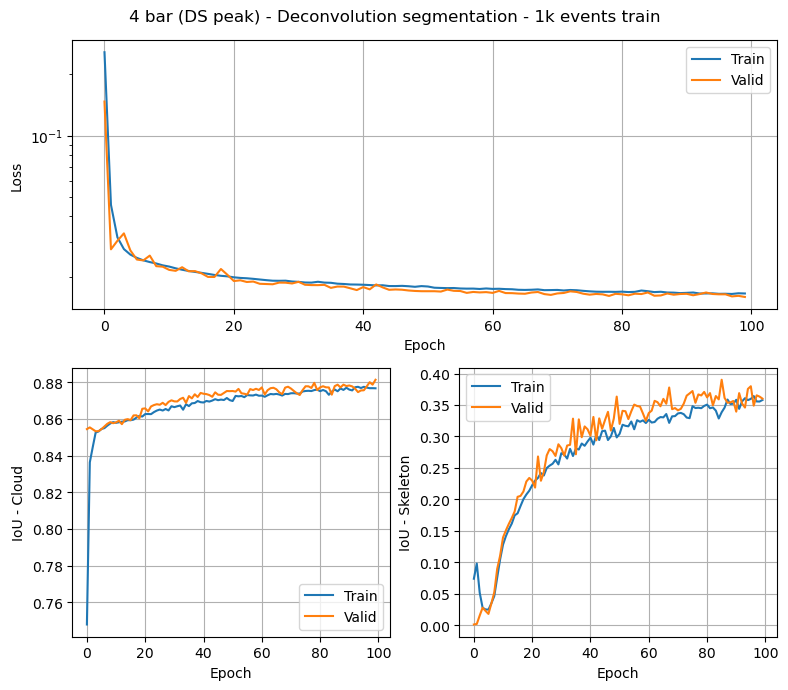

In [36]:
tb_1kevs_file = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/HE_calib/4bar/trains/soph_deco/train_A/logs/events.out.tfevents.1742328702.c208-3.2067819.0'
tb_1kevs = plot_tb_results(tb_1kevs_file, '4 bar (DS peak) - Deconvolution segmentation - 1k events train')

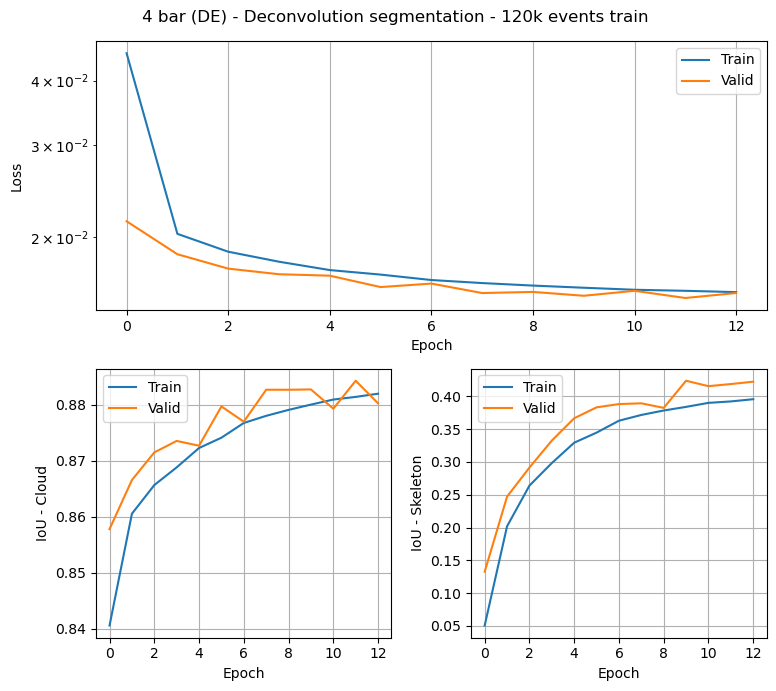

In [133]:
tb_120kevs_file = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/HE_calib/4bar/trains/soph_deco/train_B/logs/events.out.tfevents.1742396192.c207-2.1851406.0'
tb_120kevs = plot_tb_results(tb_120kevs_file, '4 bar (DE) - Deconvolution segmentation - 120k events train')

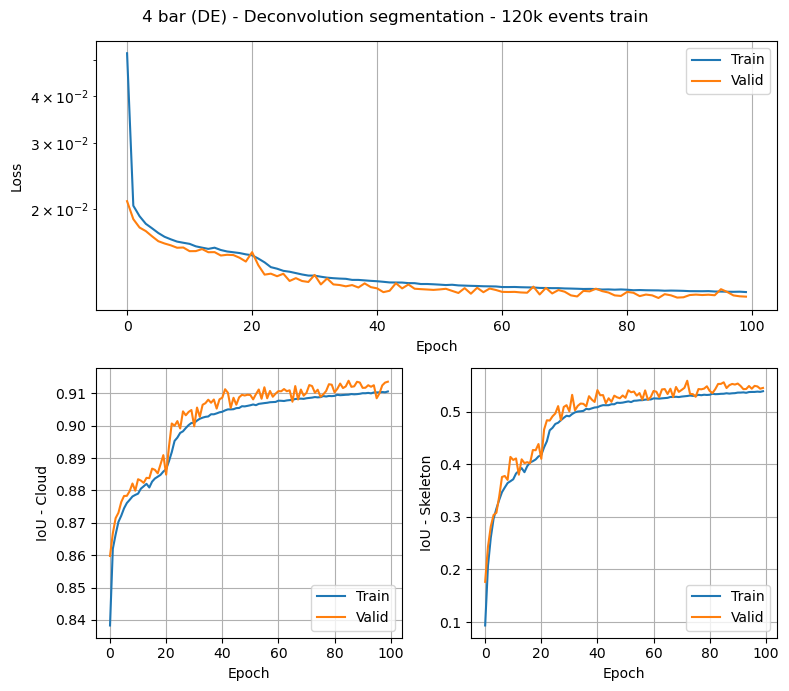

In [41]:
tb_120kevs_file = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/HE_calib/4bar/trains/soph_deco/train_D/logs/events.out.tfevents.1756213522.c207-12.993812.0'
tb_120kevs = plot_tb_results(tb_120kevs_file, '4 bar (DE) - Deconvolution segmentation - 120k events train')

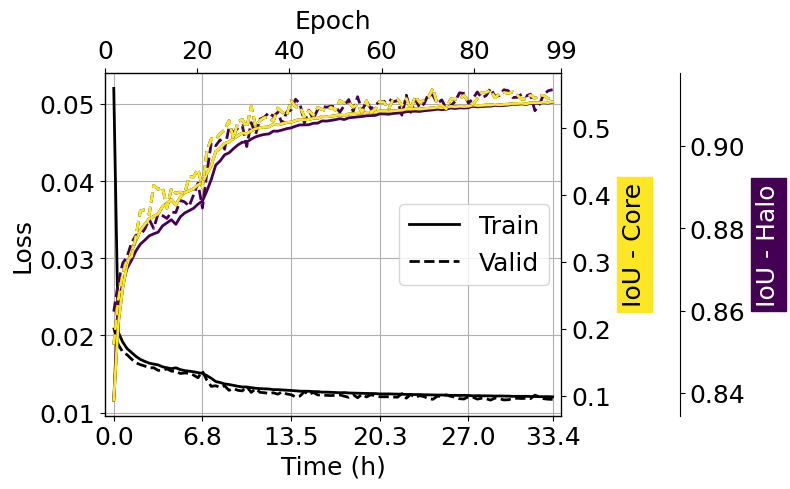

In [ ]:
tb_120kevs_file = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/HE_calib/4bar/trains/soph_deco/train_D/logs/events.out.tfevents.1756213522.c207-12.993812.0'
tb_120kevs = plot_tb_results_epoch(tb_120kevs_file, '', figsize = (8, 5), lbord=True, tbord = False, lwi = 2)
# plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/train_stats_new.pdf', dpi=600, bbox_inches='tight', transparent = True) 

0      0.000000
1      0.341790
2      0.681459
3      1.019640
4      1.358007
        ...    
95    32.103181
96    32.436187
97    32.774665
98    33.112315
99    33.447949
Name: wall_time, Length: 100, dtype: float64

### Plotting some results

In [12]:
pred_file = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/HE_calib/4bar/trains/soph_deco/train_D/pred_file.h5'
prediction = pd.read_hdf(pred_file, 'DATASET/VoxelsPred')

In [13]:
# FILE WITH ALREADY THRESHOLDED EVENTS
pred_thr_file = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/HE_calib/4bar/trains/soph_deco/train_D/pred_file_thr.h5'
thr_values = pd.read_hdf(pred_thr_file, 'DATASET/EventsInfo') 


pred_thr = prediction[prediction['class_1'] > prediction['dataset_id'].map(thr_values.set_index('dataset_id')['threshold'])]
pred_thr['prediction'] = 1
prediction = prediction.merge(pred_thr[['dataset_id', 'xbin', 'ybin', 'zbin', 'label', 'prediction']], on = ['dataset_id', 'xbin', 'ybin', 'zbin', 'label'], how = 'outer').fillna(0)
prediction.prediction = prediction.prediction.astype('int')

/scratch/1212184/ipykernel_1330552/2646050553.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_thr['prediction'] = 1


First stat we look at: the energy density of the predicted voxels

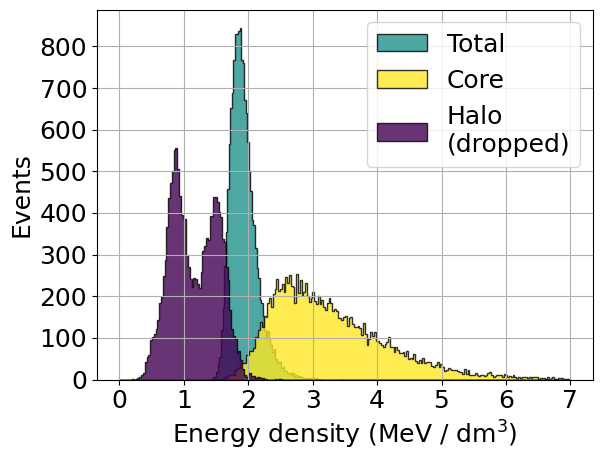

In [ ]:
pred_info, total_dens_pred = voxel_class_stats(prediction, 'prediction', voxel_size)

total_dens_pred = pred_info.groupby('dataset_id').sum().reset_index()[['dataset_id', 'deconvox', 'totaldecoener']]
plt.hist(total_dens_pred.totaldecoener / (voxel_size * total_dens_pred.deconvox), 250, (1, 7), alpha = 0.8, histtype = 'stepfilled', color = plt.cm.viridis(128), edgecolor = 'black', label = 'Total')

plot_class_hist(pred_info, 'enedensity', label = 'prediction', nbins = 250, rang = (0, 7), xlabel = 'Energy density (MeV / dm$^3$)', ylabel='Events', alpha = 0.8)

# plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/energy_density_prediction.pdf', dpi=600, bbox_inches='tight', transparent = True) 

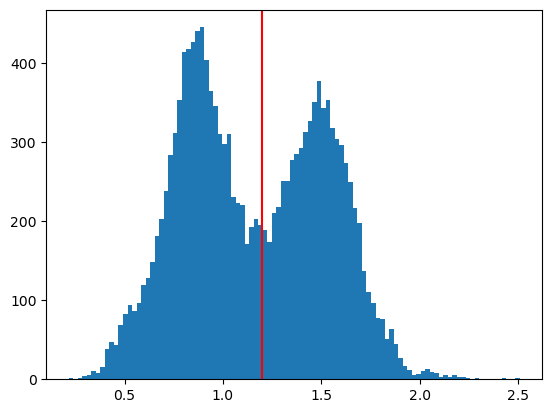

In [19]:
plt.hist(pred_info[pred_info.prediction == 0].enedensity, 100)
plt.axvline(1.2, c='r')

In [27]:
pred_info[(pred_info.prediction == 0) & (pred_info.enedensity < 1.2)].merge(events_info[['dataset_id', 'binclass']]).binclass.sum() / 8150

0.5215950920245399

In [28]:
pred_info[(pred_info.prediction == 0) & (pred_info.enedensity >= 1.2)].merge(events_info[['dataset_id', 'binclass']]).binclass.sum() / 6885

0.36848220769789397

In [32]:
events_info.binclass.sum() / len(events_info)

0.45145631067961167

In [20]:
events_info

,event_id,binclass,dataset_id,pathname,basename,label_pathname,label_basename,total_energy,stridx,endidx
0,81000000,0,0,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1351_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1351_208Tl.h5,1.542916,0,383
1,81000001,0,1,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1351_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1351_208Tl.h5,1.724690,383,761
2,81000002,1,2,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1351_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1351_208Tl.h5,1.516794,761,1028
3,81000003,1,3,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1351_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1351_208Tl.h5,1.655073,1028,1390
4,81000004,0,4,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1351_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1351_208Tl.h5,1.505256,1390,1686
...,...,...,...,...,...,...,...,...,...,...
15033,89940108,0,15033,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1500_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1500_208Tl.h5,1.657503,5278579,5278967
15034,89940109,0,15034,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1500_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1500_208Tl.h5,1.656534,5278967,5279336
15035,89940110,0,15035,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1500_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1500_208Tl.h5,1.578318,5279336,5279711
15036,89940111,1,15036,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1500_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1500_208Tl.h5,1.594299,5279711,5280094


In [21]:
# % of voxels with correct prediciton
thres = 0.5
((prediction.class_1 > thres).astype(int) == prediction.label).sum() / len(prediction)

0.9221783641872494

In [22]:
# % of events with cloud class
1 - sum(prediction.label) / len(prediction)

0.8562002916055368

In [24]:
from invisible_cities.database          import load_db       as db

# db_n100_15mm = db.DataSiPM('next100_15mm', 0)

In [33]:
dat_id = 160 #160 # 4 (2 track event) # 45 (cool 2D event example!!!!) #160 (good 2D pixelized plots example, the others do weird things when plotting in squares)
thres = 0.5
event = prediction[prediction.dataset_id == dat_id].copy()


# event['pred'] = (event.class_1 > thres).astype('int').values

In [ ]:
evt_info = events_info[events_info.dataset_id == dat_id]
reco_path = evt_info.pathname.values[0] + '/' + evt_info.basename.values[0]

hits = pd.read_hdf(reco_path, 'MC/hits')
reco_hits = pd.read_hdf(reco_path, 'RECO/Events')

In [26]:
nexus_event = hits[hits.event_id == evt_info.event_id.values[0]]
reco_event = reco_hits[reco_hits.event == evt_info.event_id.values[0]]

evt_voxel = events_voxel[events_voxel.dataset_id == dat_id] #from test file

In [10]:
# def plot_2d_sensor(event, nexus_event, bins_info):
#     df, _, _ = transform_voxels(event, bins_info)
#     df_xy = df.groupby(['xbin', 'ybin']).sum().reset_index()
#     plt.scatter(nexus_event.x, nexus_event.y, marker='x', c='r', s = 0.4, label = 'MC hits')
#     plt.scatter(df_xy.xbin, df_xy.ybin, c =df_xy.energy)
#     cbar = plt.colorbar()
#     cbar.set_label('Energy (sum)')
#     plt.legend()
#     plt.xlabel('X (mm)')
#     plt.ylabel('Y (mm)')

In [11]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_2d_sensor(event, nexus_event, bins_info, value, colorbar_label = ''):
    """
    Plot XY, XZ, and YZ projections with a single shared colorbar.
    """
    # Process event
    df, _, _ = transform_voxels(event, bins_info)

    # Define projections: ((bin_x, bin_y), (label_x, label_y), (mc_x, mc_y), title)
    projections = [
        (('xbin', 'ybin'), ('X (mm)', 'Y (mm)'), (nexus_event.x, nexus_event.y), 'XY'),
        (('xbin', 'zbin'), ('X (mm)', 'Z (mm)'), (nexus_event.x, nexus_event.z), 'XZ'),
        (('ybin', 'zbin'), ('Y (mm)', 'Z (mm)'), (nexus_event.y, nexus_event.z), 'YZ'),
    ]

    # Set up figure and grid
    fig = plt.figure(figsize=(16, 5), constrained_layout = True)
    gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 0.15], wspace=0.05, figure = fig)

    # Determine shared color limits
    vmin, vmax = df[value].min(), df[value].max()

    # To store scatter object for colorbar
    scatter_ref = None

    # Plot each projection
    for i, (bins, labels, mc_coords, title) in enumerate(projections):
        ax = fig.add_subplot(gs[i])
        df_proj = df.groupby(list(bins)).sum().reset_index()
        
        
        sc = ax.scatter(df_proj[bins[0]], df_proj[bins[1]], c=df_proj[value], vmin=vmin, vmax=vmax)
        ax.scatter(*mc_coords, marker='x', c='r', s=0.4, label='MC hits')
        ax.set_xlabel(labels[0], size = 18)
        ax.set_ylabel(labels[1], size = 18)
        ax.tick_params(axis='both', which='major', labelsize=25)
        # ax.set_title(title)
        ax.legend(loc='upper right', markerscale=6)
        
        if scatter_ref is None:
            scatter_ref = sc  # Store first scatter for shared colorbar

    # Add one shared colorbar on the right
    
    cax = fig.add_subplot(gs[3])
    cbar = fig.colorbar(scatter_ref, cax=cax)
    cbar.set_label(colorbar_label, size = 18)
    cbar.ax.tick_params(labelsize = 18)
    # plt.tight_layout()
    # fig.suptitle('2D Sensor Projections with Shared Energy Colorbar', fontsize=14)
    # plt.show()



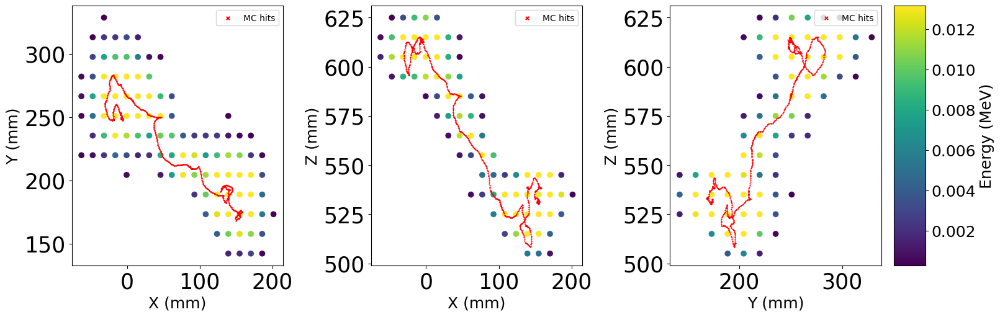

In [105]:
plot_2d_sensor(event, nexus_event, bins_info, 'energy', colorbar_label='Energy (MeV)')

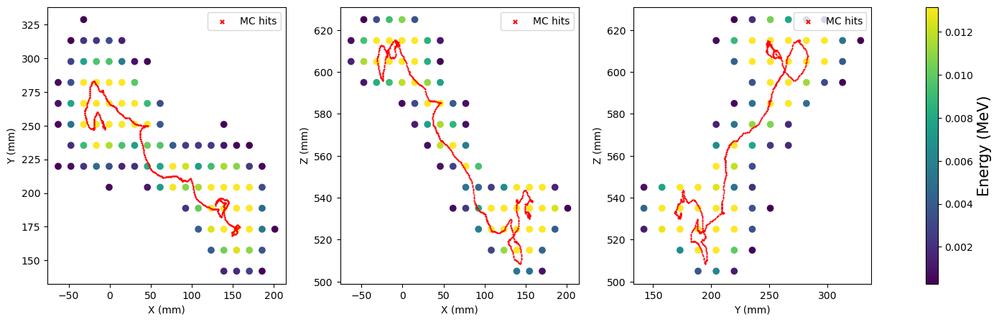

In [40]:
plot_2d_sensor(event, nexus_event, bins_info, 'energy', colorbar_label='Energy (MeV)')

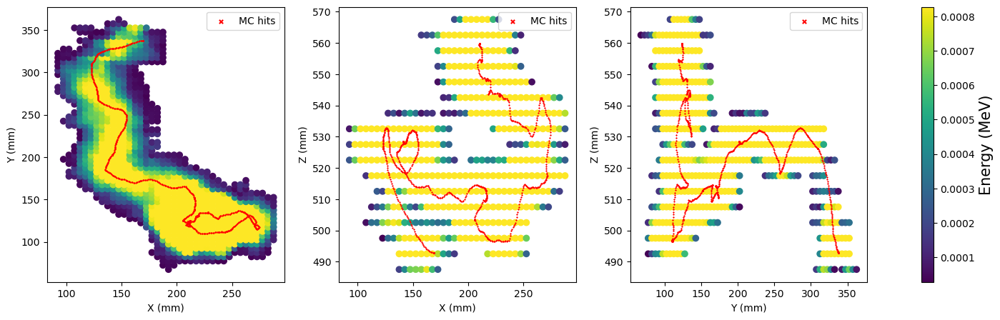

In [93]:
plot_2d_sensor(evt_voxel_i, nexus_event, bins_info_i, 'energy', colorbar_label='Energy (MeV)')

In [8]:
def plot_2d_bins_xy(event, bins_info):
    df, _, _ = transform_voxels(event, bins_info)
    pitch = [bins_info.size_x.values[0], bins_info.size_y.values[0], bins_info.size_z.values[0]]
    x_bins, y_bins, z_bins = create_xy_bins(df, pitch = pitch)
    df_xy = df.groupby(['xbin', 'ybin']).sum().reset_index()

    cmap = plt.cm.viridis.copy()
    cmap.set_under('white')

    plt.hist2d(df_xy.xbin, df_xy.ybin, weights=df_xy.energy, bins=[x_bins, y_bins], cmap=cmap, vmin = 1e-10)
    plt.scatter(nexus_event.x, nexus_event.y, marker='x', c='r', s=0.4, label='MC hits')
    cbar = plt.colorbar()
    cbar.set_label('Energy')
    plt.legend()
    plt.xlabel('X (mm)')
    plt.ylabel('Y (mm)')
    plt.gca().set_aspect('equal')  # Ensure square pixels
    # plt.tight_layout()

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.gridspec import GridSpec
from scipy.stats import binned_statistic_2d   # does the heavy lifting


def plot_2d_bins_old(event,
                 nexus_event,
                 bins_info,
                 value_col: str = 'energy',
                 statistic: str = 'sum',
                 colorbar_label: str = 'Energy (MeV)', 
                 dropped_voxels = None):
    """
    Plot XY, XZ & YZ 2-D maps of *any* voxel attribute, using a chosen
    aggregation per bin (sum, max, mean, …), with one shared colour bar
    and equal-sized square sub-plots.

    Parameters
    ----------
    event         : object
        Passed to `transform_voxels`; needs attributes `.x`, `.y`, `.z`
        for MC hit draws.
    bins_info     : any
        Passed through to `transform_voxels`.
    value_col     : str, default 'energy'
        Column in the voxel DataFrame to visualise.
    statistic     : str | callable, default 'sum'
        Aggregation method per bin.  Anything accepted by
        `binned_statistic_2d` ('sum', 'max', 'mean', 'count', …) or a
        custom function.
        *Example:*  statistic='max' together with value_col='label'
        turns every bin that contains at least one “1” into 1.
    colorbar_label: str | None
        Label for the colour bar.  If None, a sensible default is built
        from `value_col` and `statistic`.
    """
    if value_col == 'label' or value_col == 'decolabel': eps = 1e-10
    else: eps = 0
    # ------------------------------------------------------------------
    # 1 )  Voxelise the event  -----------------------------------------
    # ------------------------------------------------------------------
    df, _, _ = transform_voxels(event, bins_info)

    if value_col not in df.columns:
        raise KeyError(f"Column '{value_col}' not found in voxel DataFrame.")

    # ------------------------------------------------------------------
    # 2 )  Bin edges  ---------------------------------------------------
    #      (adapt to your own helper if you don't use create_xy_bins)
    # ------------------------------------------------------------------
    pitch = [bins_info.size_x.values[0], bins_info.size_y.values[0], bins_info.size_z.values[0]]
    x_bins, y_bins, z_bins = create_xy_bins(df, pitch = pitch)

    # ------------------------------------------------------------------
    # 3 )  Projection definitions  -------------------------------------
    # ------------------------------------------------------------------
    #   (x-array, y-array, xedges, yedges, mc_x, mc_y, title, labels)
    projections = [
        (df.xbin.values, df.ybin.values, x_bins, y_bins,
         nexus_event.x,  nexus_event.y,  'XY', ('X (mm)', 'Y (mm)')),

        (df.xbin.values, df.zbin.values, x_bins, z_bins,
         nexus_event.x,  nexus_event.z,  'XZ', ('X (mm)', 'Z (mm)')),

        (df.ybin.values, df.zbin.values, y_bins, z_bins,
         nexus_event.y,  nexus_event.z,  'YZ', ('Y (mm)', 'Z (mm)')),
    ]

    # ------------------------------------------------------------------
    # 4 )  Compute each binned statistic --------------------------------
    # ------------------------------------------------------------------
    Hs = []
    for x, y, xe, ye, *_ in projections:
        H, *_ = binned_statistic_2d(
            x, y, df[value_col].values + eps,
            statistic=statistic, bins=[xe, ye])
        Hs.append(np.nan_to_num(H, nan=0.0))

    # Shared colour limits
    vmin = 1e-10 #min(H.min() for H in Hs)
    vmax = max(H.max() for H in Hs)
    # Keep empty bins white (works even if vmin==0)
    cmap = plt.cm.viridis.copy()
    cmap.set_under('white')

    # ------------------------------------------------------------------
    # 5 )  Figure & axes layout  ---------------------------------------
    # ------------------------------------------------------------------
    fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=False, sharey=False, constrained_layout = True)
    # fig  = plt.figure(figsize=(15, 5)) #, constrained_layout = True)
    # gs   = GridSpec(1, 4, width_ratios=[1, 1, 1, 0.15],
    #                 wspace=0, figure=fig)

    # axes = [fig.add_subplot(gs[0, i]) for i in range(3)]
    # cax  = fig.add_subplot(gs[0, 3])

    # fig.subplots_adjust(left=0, right=1.05, wspace=0)

    for ax in axes:                    # make every panel square
        try:
            ax.set_box_aspect(1)           # Matplotlib ≥3.3
        except AttributeError:
            ax.set_aspect('equal', adjustable='box')  # fallback

    # ------------------------------------------------------------------
    # 6 )  Draw projections  -------------------------------------------
    # ------------------------------------------------------------------
    im_for_cbar = None
    first_plot = True
    for ax, H, (x, y, xe, ye, mc_x, mc_y, title, (xlbl, ylbl)) in zip(
            axes, Hs, projections):
        x_all, y_all = [xe[0], xe[-1]], [ye[0], ye[-1]]
        # plot first the dropped voxels if any
        if dropped_voxels is not None:
            df_drop, _, _ = transform_voxels(dropped_voxels, bins_info)
            # pick correct projection coordinates
            if title == "XY":
                coord = ['xbin', 'ybin']
            elif title == "XZ":
                coord = ['xbin', 'zbin']
            elif title == "YZ":
                coord = ['ybin', 'zbin']
                
            a = df[coord].drop_duplicates()
            b = df_drop[coord].drop_duplicates()
            df_res = b.merge(a, on=coord, how='left', indicator=True)
            xv, yv = df_res[df_res['_merge']=='left_only'][coord].values.T
            dx = np.diff(xe)[0]
            dy = np.diff(ye)[0]
            x_all = [min(x_all[0], xv.min()-dx/2), max(x_all[1], xv.max()+dx/2)]
            y_all = [min(y_all[0], yv.min()-dy/2), max(y_all[1], yv.max()+dy/2)]
            first_rect = True
            for xx, yy in zip(xv, yv):
                x0 = xx - dx/2
                y0 = yy - dy/2
                rect = Rectangle((x0, y0), dx, dy,
                                facecolor='none',
                                edgecolor='grey',
                                linewidth=0.8,
                                # zorder=5,
                                label="Dropped" if first_rect else None)
                ax.add_patch(rect)
                first_rect = False

        # show the 2-D statistic.  `origin='lower'` keeps bins intuitive
        # im = ax.imshow(H.T, origin='lower',
        #                extent=[xe[0], xe[-1], ye[0], ye[-1]],
        #                cmap=cmap, vmin=vmin, vmax=vmax,
        #                aspect='auto')
        X, Y = np.meshgrid(xe, ye)
        im = ax.pcolormesh(X, Y, H.T,
                           cmap=cmap, vmin=vmin, vmax=vmax,
                           shading='auto')   # ensures no gaps
        im_for_cbar = im
        for xedge in xe:
            ax.axvline(xedge, color='white', linewidth=0.3)

        # 2) draw horizontal grid lines at every y-bin edge
        for yedge in ye:
            ax.axhline(yedge, color='white', linewidth=0.3)

        # MC truth hits
        ax.scatter(mc_x, mc_y, marker='x', c='r', s=5, label='MC hits')



        # Labels & cosmetics
        ax.set_xlim(*x_all)
        ax.set_ylim(*y_all)
        ax.set_xlabel(xlbl, size = 20)
        ax.set_ylabel(ylbl, size = 20)
        ax.tick_params('both', size = 8, labelsize = 22)
        # ax.set_title(title)
        if first_plot:
            ax.legend(loc='upper right', markerscale=5, fontsize = 20)
            first_plot = False

    # ---------- 5) Independent colorbar ----------
    # Figure coordinates [x0, y0, width, height], all between 0 and 1
    cbar_width = 0.03
    cbar_height = 0.765
    cbar_x = 1.01
    cbar_y = 0.17

    cax = fig.add_axes([cbar_x, cbar_y, cbar_width, cbar_height])
    cbar = fig.colorbar(im_for_cbar, cax=cax)
    if colorbar_label is None:
        colorbar_label = f"{value_col.capitalize()} ({statistic})"
    cbar.set_label(colorbar_label, size=25)
    cbar.ax.tick_params(labelsize=22)

    # ------------------------------------------------------------------
    # 8 )  Global title  ------------------------------------------------
    # # ------------------------------------------------------------------
    # fig.suptitle('2-D Maps '
    #              f"[{value_col}, {statistic}]  –  equal-sized projections",
    #              y=1.03, fontsize=14)
    # plt.show()


In [10]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.gridspec import GridSpec
from scipy.stats import binned_statistic_2d   # does the heavy lifting


def plot_2d_bins(event,
                 nexus_event,
                 bins_info,
                 value_col: str = 'energy',
                 statistic: str = 'sum',
                 colorbar_label: str = 'Energy (MeV)', 
                 dropped_voxels = None, 
                 center_plots = True, 
                 cbar_loc = 'right'):
    """
    Plot XY, XZ & YZ 2-D maps of *any* voxel attribute, using a chosen
    aggregation per bin (sum, max, mean, …), with one shared colour bar
    and equal-sized square sub-plots.

    Parameters
    ----------
    event         : object
        Passed to `transform_voxels`; needs attributes `.x`, `.y`, `.z`
        for MC hit draws.
    bins_info     : any
        Passed through to `transform_voxels`.
    value_col     : str, default 'energy'
        Column in the voxel DataFrame to visualise.
    statistic     : str | callable, default 'sum'
        Aggregation method per bin.  Anything accepted by
        `binned_statistic_2d` ('sum', 'max', 'mean', 'count', …) or a
        custom function.
        *Example:*  statistic='max' together with value_col='label'
        turns every bin that contains at least one “1” into 1.
    colorbar_label: str | None
        Label for the colour bar.  If None, a sensible default is built
        from `value_col` and `statistic`.
    """
    if value_col == 'label' or value_col == 'decolabel': eps = 1e-10
    else: eps = 0
    mc = nexus_event.copy()
    # ------------------------------------------------------------------
    # 1 )  Voxelise the event  -----------------------------------------
    # ------------------------------------------------------------------
    df, _, _ = transform_voxels(event, bins_info)

    if value_col not in df.columns:
        raise KeyError(f"Column '{value_col}' not found in voxel DataFrame.")
    # ------------------------------------------------------------------
    # 2)  Centering: compute event midpoint and shift coordinates
    # ------------------------------------------------------------------
    x_center = 0.5 * (df.xbin.min() + df.xbin.max())
    y_center = 0.5 * (df.ybin.min() + df.ybin.max())
    z_center = 0.5 * (df.zbin.min() + df.zbin.max())

    # ------------------------------------------------------------------
    # 3)  Bin edges (shifted to match centered event)
    # ------------------------------------------------------------------
    pitch = [bins_info.size_x.values[0],
             bins_info.size_y.values[0],
             bins_info.size_z.values[0]]
    x_bins, y_bins, z_bins = create_xy_bins(df, pitch=pitch)

    # ------------------------------------------------------------------
    # 4 )  Projection definitions  -------------------------------------
    # ------------------------------------------------------------------
    #   (x-array, y-array, xedges, yedges, mc_x, mc_y, title, labels)
    projections = [
        (df.xbin.values, df.ybin.values, x_bins, y_bins,
         mc.x,  mc.y,  'XY', ('X (mm)', 'Y (mm)')),

        (df.xbin.values, df.zbin.values, x_bins, z_bins,
         mc.x,  mc.z,  'XZ', ('X (mm)', 'Z (mm)')),

        (df.ybin.values, df.zbin.values, y_bins, z_bins,
         mc.y,  mc.z,  'YZ', ('Y (mm)', 'Z (mm)')),
    ]

    # ------------------------------------------------------------------
    # 5 )  Compute each binned statistic --------------------------------
    # ------------------------------------------------------------------
    Hs = []
    for x, y, xe, ye, *_ in projections:
        H, *_ = binned_statistic_2d(
            x, y, df[value_col].values + eps,
            statistic=statistic, bins=[xe, ye])
        Hs.append(np.nan_to_num(H, nan=0.0))

    # Shared colour limits
    vmin = 1e-10 #min(H.min() for H in Hs)
    vmax = max(H.max() for H in Hs)
    # Keep empty bins white (works even if vmin==0)
    cmap = plt.cm.viridis.copy()
    cmap.set_under('white')

    # ------------------------------------------------------------------
    # 6 )  Figure & axes layout  ---------------------------------------
    # ------------------------------------------------------------------
    fig, axes = plt.subplots(1, 3, figsize=(17, 5), sharex=False, sharey=False, constrained_layout = True, gridspec_kw={'wspace': 0.05})
    for ax in axes:
        ax.set_aspect('equal', adjustable='datalim')
    # fig  = plt.figure(figsize=(15, 5)) #, constrained_layout = True)
    # gs   = GridSpec(1, 4, width_ratios=[1, 1, 1, 0.15],
    #                 wspace=0, figure=fig)

    # axes = [fig.add_subplot(gs[0, i]) for i in range(3)]
    # cax  = fig.add_subplot(gs[0, 3])

    # fig.subplots_adjust(left=0, right=1.05, wspace=0)

    # for ax in axes:                    # make every panel square
    #     try:
    #         ax.set_box_aspect(1)           # Matplotlib ≥3.3
    #     except AttributeError:
    #         ax.set_aspect('equal', adjustable='box')  # fallback
    # axes[0].set_aspect('equal', adjustable='datalim')
    # axes[1].set_box_aspect(1) 
    # axes[2].set_box_aspect(1) 
    # ------------------------------------------------------------------
    # 7 )  Draw projections  -------------------------------------------
    # ------------------------------------------------------------------
    im_for_cbar = None
    first_plot = True
    for ax, H, (x, y, xe, ye, mc_x, mc_y, title, (xlbl, ylbl)) in zip(
            axes, Hs, projections):
        if center_plots:
            # Shift bin edges for plotting only
            xe = xe - (x_center if title in ("XY", "XZ") else y_center)
            ye = ye - (y_center if title == "XY" else z_center)

            # Shift MC hits
            mc_x = mc_x - (x_center if title in ("XY", "XZ") else y_center)
            mc_y = mc_y - (y_center if title == "XY" else z_center)

        dx = np.diff(xe)[0]
        dy = np.diff(ye)[0]
        x_all, y_all = [xe[0] - dx/2, xe[-1] + dx/2], [ye[0] - dy/2, ye[-1] + dy/2]
        # plot first the dropped voxels if any
        if dropped_voxels is not None:
            df_drop, _, _ = transform_voxels(dropped_voxels, bins_info)
            if center_plots:
                df_drop.xbin = df_drop.xbin - x_center
                df_drop.ybin = df_drop.ybin - y_center
                df_drop.zbin = df_drop.zbin - z_center
            # pick correct projection coordinates
            if title == "XY":
                coord = ['xbin', 'ybin']
            elif title == "XZ":
                coord = ['xbin', 'zbin']
            elif title == "YZ":
                coord = ['ybin', 'zbin']
                
            a = df[coord].drop_duplicates()
            b = df_drop[coord].drop_duplicates()
            df_res = b.merge(a, on=coord, how='left', indicator=True)
            xv, yv = df_res[df_res['_merge']=='left_only'][coord].values.T

            x_all = [min(x_all[0], xv.min()-dx), max(x_all[1], xv.max()+dx)]
            y_all = [min(y_all[0], yv.min()-dy), max(y_all[1], yv.max()+dy)]
            first_rect = True
            for xx, yy in zip(xv, yv):
                x0 = xx - dx/2
                y0 = yy - dy/2
                rect = Rectangle((x0, y0), dx, dy,
                                facecolor='none',
                                edgecolor='grey',
                                linewidth=0.8,
                                # zorder=5,
                                label="Dropped" if first_rect else None)
                ax.add_patch(rect)
                first_rect = False

        # show the 2-D statistic.  `origin='lower'` keeps bins intuitive
        # im = ax.imshow(H.T, origin='lower',
        #                extent=[xe[0], xe[-1], ye[0], ye[-1]],
        #                cmap=cmap, vmin=vmin, vmax=vmax,
        #                aspect='auto')
        X, Y = np.meshgrid(xe, ye)
        im = ax.pcolormesh(X, Y, H.T,
                           cmap=cmap, vmin=vmin, vmax=vmax,
                           shading='auto')   # ensures no gaps
        im_for_cbar = im
        for xedge in xe:
            ax.axvline(xedge, color='white', linewidth=0.3)

        # 2) draw horizontal grid lines at every y-bin edge
        for yedge in ye:
            ax.axhline(yedge, color='white', linewidth=0.3)

        # MC truth hits
        ax.scatter(mc_x, mc_y, marker='x', c='r', s=5, label='MC hits')



        # Labels & cosmetics
        ax.set_xlim(*x_all)
        ax.set_ylim(*y_all)
        ax.set_xlabel(xlbl, size = 25) #20
        ax.set_ylabel(ylbl, size = 25, labelpad = -10) #20
        ax.tick_params('both', size = 13, labelsize = 27) #8, 22
        # ax.set_title(title)
        if first_plot:
            ax.legend(loc='best', markerscale=5, fontsize = 23) #20
            first_plot = False

    # Figure coordinates [x0, y0, width, height], all between 0 and 1
    if cbar_loc == 'right':
        cbar_x = 1.01
        lblpad = 20
    if cbar_loc == 'left':
        cbar_x = -0.1
        lblpad = -130
    
    cbar_width = 0.03
    cbar_height = 0.79 # 0.82
    cbar_y = 0.205 #0.165

    cax = fig.add_axes([cbar_x, cbar_y, cbar_width, cbar_height])
    cbar = fig.colorbar(im_for_cbar, cax=cax)
    if colorbar_label is None:
        colorbar_label = f"{value_col.capitalize()} ({statistic})"
    cbar.set_label(colorbar_label, size=27, labelpad = lblpad)
    cbar.ax.tick_params(labelsize=25) # 22

    # ------------------------------------------------------------------
    # 8 )  Global title  ------------------------------------------------
    # # ------------------------------------------------------------------
    # fig.suptitle('2-D Maps '
    #              f"[{value_col}, {statistic}]  –  equal-sized projections",
    #              y=1.03, fontsize=14)
    # plt.show()

In [334]:
dat_id = 1600 #160 # 4 (2 track event) # 45 (cool 2D event example!!!!) #160 (good 2D pixelized plots example, the others do weird things when plotting in squares)
thres = 0.5
event = prediction[prediction.dataset_id == dat_id].copy()
evt_info = events_info[events_info.dataset_id == dat_id]
reco_path = evt_info.pathname.values[0] + '/' + evt_info.basename.values[0]

hits = pd.read_hdf(reco_path, 'MC/hits')
reco_hits = pd.read_hdf(reco_path, 'RECO/Events')
nexus_event = hits[hits.event_id == evt_info.event_id.values[0]]
reco_event = reco_hits[reco_hits.event == evt_info.event_id.values[0]]

evt_voxel = events_voxel[events_voxel.dataset_id == dat_id] #from test file

In [37]:
from random import randint

In [38]:
plotting_events = [11916, 587, 7176, 13550, 9359, 5933, 1083, 9188]

# 587 not very cool result
# 13550, 9359, 9188, meh result
# 7176, 11916, looks cool, not that cool
# 5933, 1083, quite cool result

In [39]:
event.min()

label           0.000000
energy          0.000286
dataset_id    160.000000
xbin           27.000000
ybin           40.000000
zbin           50.000000
class_0         0.189109
class_1         0.014547
prediction      0.000000
dtype: float64

1083


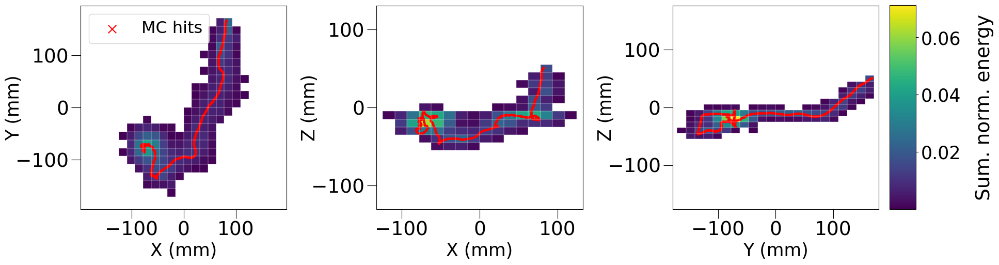

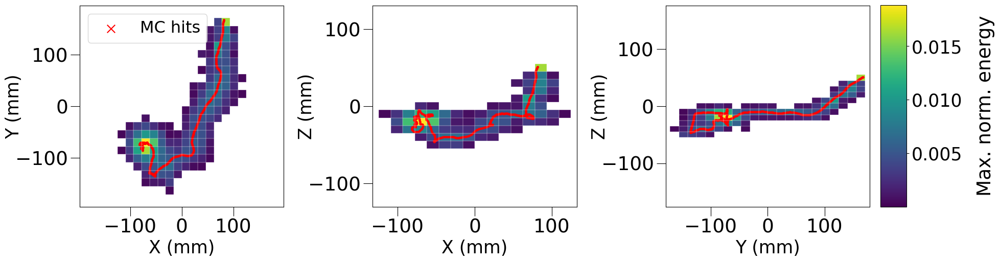

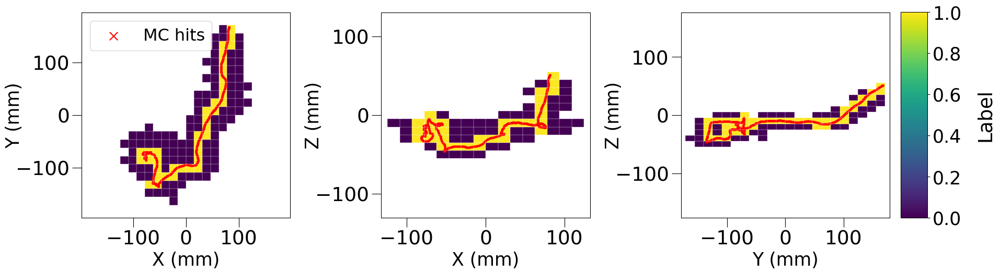

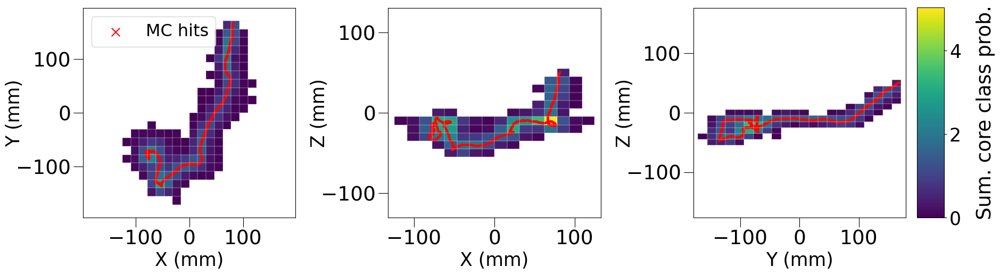

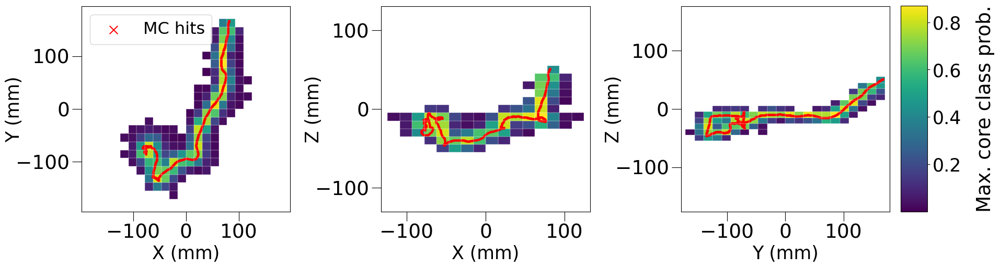

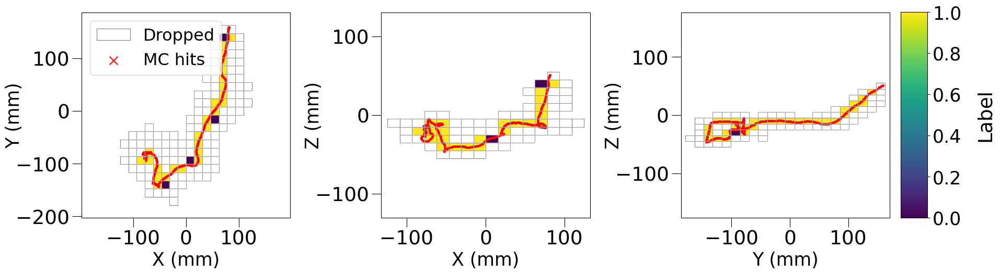

In [21]:
savefig = True
dat_id = 1083 #randint(0, 15000) 
print(dat_id)
event = prediction[prediction.dataset_id == dat_id].copy()
evt_info = events_info[events_info.dataset_id == dat_id]
reco_path = evt_info.pathname.values[0] + '/' + evt_info.basename.values[0]

hits = pd.read_hdf(reco_path, 'MC/hits')
reco_hits = pd.read_hdf(reco_path, 'RECO/Events')
nexus_event = hits[hits.event_id == evt_info.event_id.values[0]]

thr = thr_values[thr_values.dataset_id == dat_id].threshold.values[0]

# event = event[(event.ybin > 6)] # event 11916
# event = event[(event.xbin < 40) & (event.ybin < 40)] # event 7176
# event = event[(event.ybin > 45)] # event 13550
# event = event[(event.ybin > 28)] # event 9359
# event = event[(event.xbin > 10) & (event.xbin < 46)] # event 5933 # in this one there is other track far away but im cutting it just to see better the tracks
plot_2d_bins(event, nexus_event, bins_info, value_col = 'energy', statistic='sum', colorbar_label='Sum. norm. energy', center_plots = True)
if savefig:
    plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/events/evt_{}_2D_energy_ticks.pdf'.format(dat_id), dpi=600, bbox_inches='tight', transparent = True) 

plot_2d_bins(event, nexus_event, bins_info, value_col = 'energy', statistic='max', colorbar_label='Max. norm. energy', center_plots = True)
if savefig:
    plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/events/evt_{}_2D_energy_max_ticks.pdf'.format(dat_id), dpi=600, bbox_inches='tight', transparent = True) 

plot_2d_bins(event, nexus_event, bins_info, value_col = 'label', statistic='max', colorbar_label='Label')
if savefig:
    plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/events/evt_{}_2D_label_ticks.pdf'.format(dat_id), dpi=600, bbox_inches='tight', transparent = True) 

plot_2d_bins(event, nexus_event, bins_info, value_col = 'class_1', statistic='sum', colorbar_label='Sum. core class prob.')
if savefig:
    plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/events/evt_{}_2D_classprob_ticks.pdf'.format(dat_id), dpi=600, bbox_inches='tight', transparent = True) 

plot_2d_bins(event, nexus_event, bins_info, value_col = 'class_1', statistic='max', colorbar_label='Max. core class prob.')
if savefig:
    plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/events/evt_{}_2D_classprob_max_ticks.pdf'.format(dat_id), dpi=600, bbox_inches='tight', transparent = True) 

plot_2d_bins(event[event.class_1 > thr], nexus_event, bins_info, value_col = 'label', statistic='max', colorbar_label='Label', dropped_voxels = event[event.class_1 <= thr])
if savefig:
    plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/events/evt_{}_2D_thr_ticks.pdf'.format(dat_id), dpi=600, bbox_inches='tight', transparent = True) 

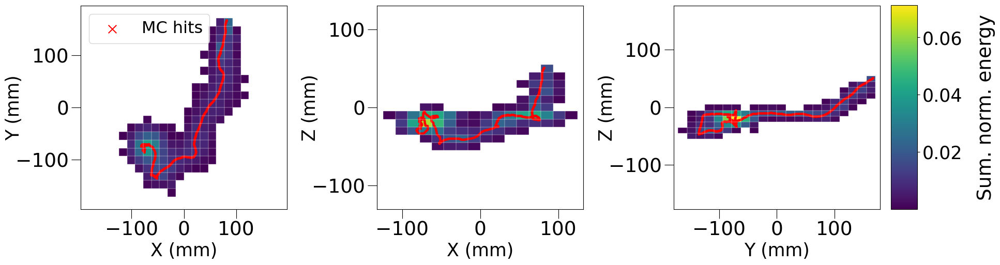

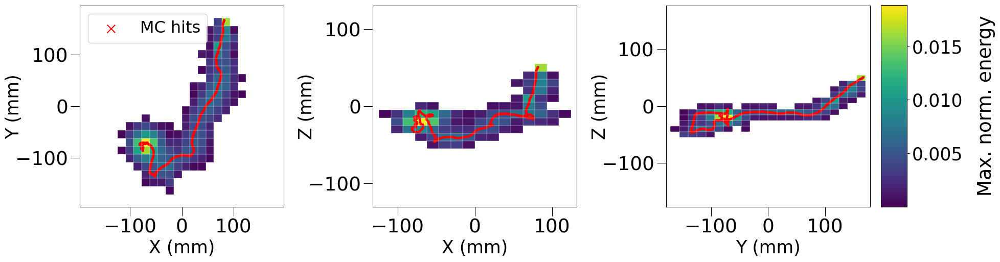

In [20]:
plot_2d_bins(event, nexus_event, bins_info, value_col = 'energy', statistic='sum', colorbar_label='Sum. norm. energy', center_plots = True)
plot_2d_bins(event, nexus_event, bins_info, value_col = 'energy', statistic='max', colorbar_label='Max. norm. energy', center_plots = True)


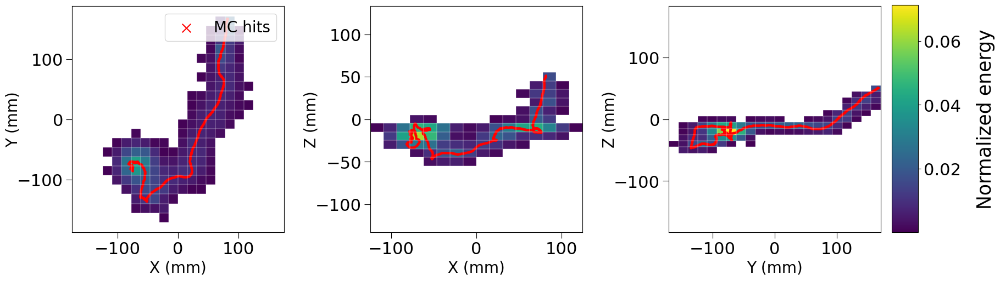

In [266]:
plot_2d_bins(event, nexus_event, bins_info, value_col = 'energy', statistic='sum', colorbar_label='Normalized energy')
plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/evt_{}_2D_energy.pdf'.format(dat_id), dpi=600, bbox_inches='tight', transparent = True) 

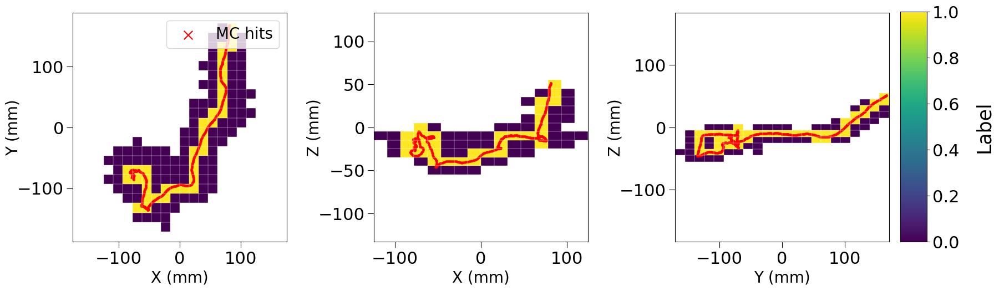

In [ ]:
plot_2d_bins(event, nexus_event, bins_info, value_col = 'label', statistic='max', colorbar_label='Label')
plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/evt_{}_2D_label.pdf'.format(dat_id), dpi=600, bbox_inches='tight', transparent = True) 

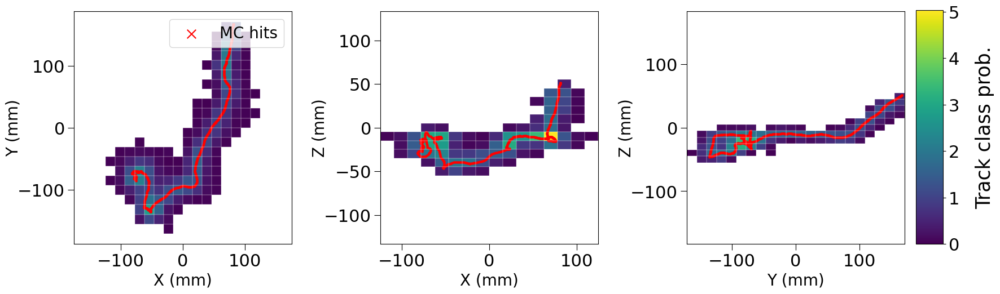

In [268]:
plot_2d_bins(event, nexus_event, bins_info, value_col = 'class_1', statistic='sum', colorbar_label='Track class prob.')
plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/evt_{}_2D_classprob.pdf'.format(dat_id), dpi=600, bbox_inches='tight', transparent = True) 


In [269]:
# thr, _, _ = optimal_threshold_all_components(event, 0, 1, precision = 6, min_vox_track = 10, extent_tol=0.85)
# # thr_i, _, _ = optimal_threshold_all_components(event_i, 0, 1, precision = 6, min_vox_track = 50, extent_tol=0.85)

# print(thr)

thr = thr_values[thr_values.dataset_id == dat_id].threshold.values[0]

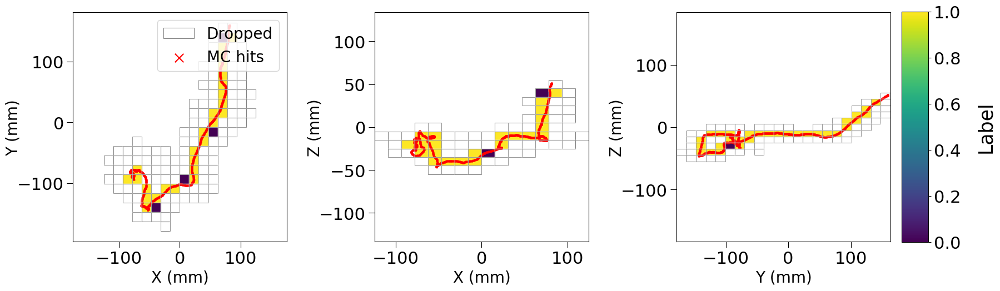

In [270]:
plot_2d_bins(event[event.class_1 > thr], nexus_event, bins_info, value_col = 'label', statistic='max', colorbar_label='Label', dropped_voxels = event[event.class_1 <= thr])
# plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/evt_{}_2D_thr.pdf'.format(dat_id), dpi=600, bbox_inches='tight', transparent = True) 


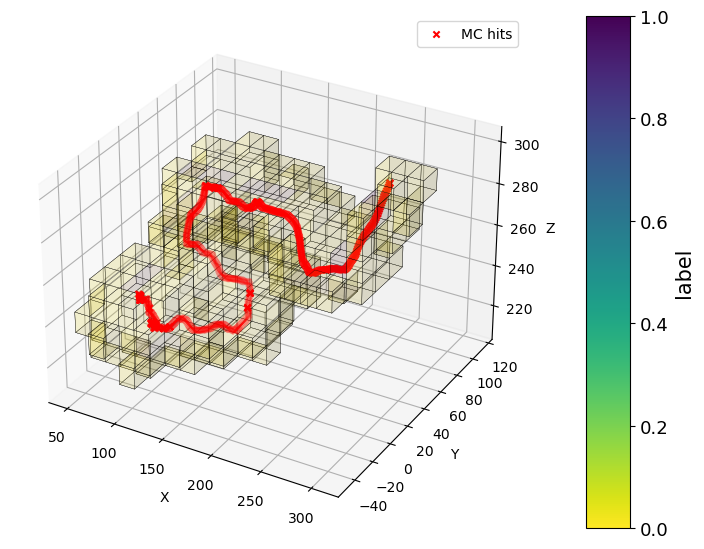

In [322]:
plot_3d_hits(event, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], buffer=10, mc_hits=nexus_event, voxel_info=bins_info, plot_mode = 'voxels', opacity=0.1)


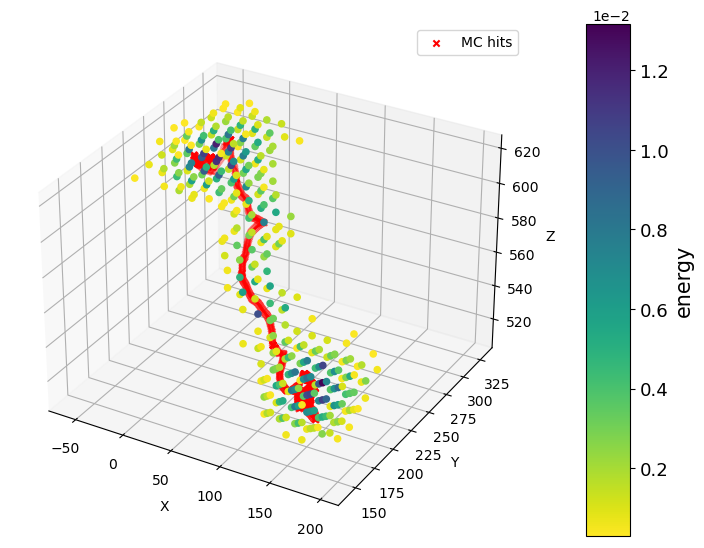

In [189]:
plot_3d_hits(event, cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], buffer=10, mc_hits=nexus_event, voxel_info=bins_info)


nexus


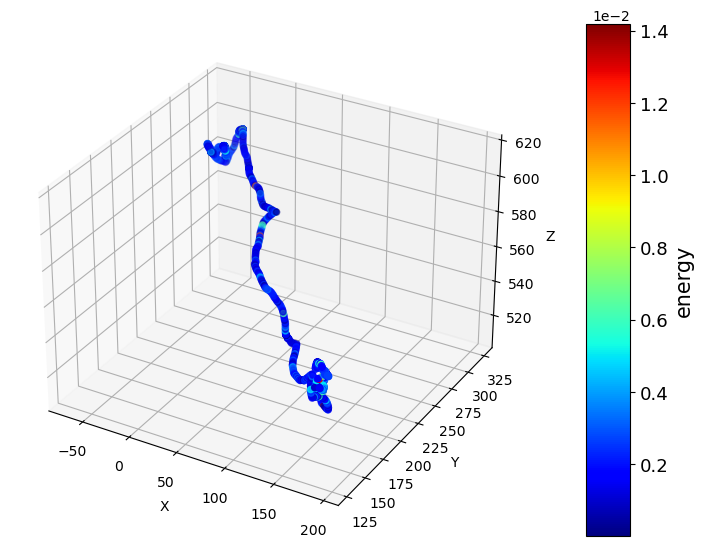

reco hits


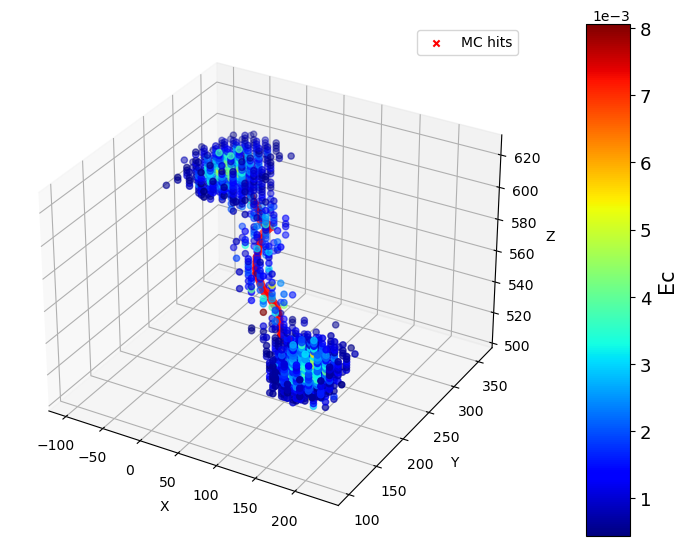

In [150]:
# SOURCE FILE
print('nexus')
plot_3d_hits(nexus_event, coords = ['x', 'y', 'z'], buffer = 50)
print('reco hits')
plot_3d_hits(reco_event, 'Ec', coords = ['X', 'Y', 'Z'], mc_hits=nexus_event, buffer = 50)

# PEQUEÑA PAUSA PARA MIRAR LA INTERPOLACION

In [13]:
from invisible_cities.reco.deconv_functions import deconvolution_input
from invisible_cities.types.symbols import InterpolationMethod


In [14]:
from utils.bin_utils          import bins_creator_sipm, bins_creator_regular, create_bins


In [48]:
def interpolate_reco_events(df, interp_function, interp_coords = ['X', 'Y'], interp_weight = 'Ec', interp_thr = 0.05):
    '''
    Function to interpolate the hits in each Z slice

    df: pd.DataFrame()
        Contains an event or a group of events to interpolate 
    interp_function: function
        Contains the interpolation function (same as used in Beersheba in principle)
    interp_coords: list
        Contains the name of the coordinates to interpolate
    interp_weight: str
        Contains the name of the variable to interpolate
    interp_thr: float
        Percentage of the max value in a slice to delete very small values of the interpolation
    '''
    interp_df = pd.DataFrame([])
    # All these variables are the same for the same slice of Z and event, so we just include them back again after interpolating
    for i, ((event, time, npeak, Xpeak, Ypeak, nsipm, Xrms, Yrms, Qc, track_id, Ep, Z), slice_df) in enumerate(df.groupby(['event', 'time', 'npeak', 'Xpeak', 'Ypeak', 'nsipm', 'Xrms', 'Yrms', 'Qc', 'track_id', 'Ep', 'Z'])):
        # If there is only one hit in the slice, we cannot interpolate
        if len(slice_df) <= 1:
            interp_df = interp_df.append(slice_df)
            continue
        # Perform interpolation
        Hs, inter_points = interp_function((slice_df[interp_coords[0]].values, slice_df[interp_coords[1]].values), slice_df[interp_weight].values)
        # Create the interpolated DF similar to the original
        slice_interp = pd.DataFrame({'event':event, 'time':time, 'npeak':npeak, 'Xpeak':Xpeak, 'Ypeak':Ypeak, 'nsipm':nsipm, 'Xrms':Xrms, 'Yrms':Yrms, 'Qc':Qc, 'track_id':track_id, 'Ep':Ep,
                                     'X': inter_points[0],
                                     'Y': inter_points[1],
                                     'Z': Z,
                                     'int_': Hs.flatten()
                                     })
        # Select only the interpolation values above a certain % given by interp_thr of the max of the slice
        slice_interp = slice_interp[slice_interp['int_'] > interp_thr * slice_interp['int_'].max()]
        # Normalize the interpolation values and redistribute Q, E and Ec in the interpolated slice
        slice_interp['int_norm'] = slice_interp['int_'] / sum(slice_interp['int_'])
        slice_interp['Q'] = slice_interp['int_norm'] * slice_df['Q'].sum()
        slice_interp['E'] = slice_interp['int_norm'] * slice_df['E'].sum()
        slice_interp['Ec'] = slice_interp['int_norm'] * slice_df['Ec'].sum()
        # Sort interpolated slice and append to the whole output dataframe
        slice_interp = slice_interp[slice_df.columns]
        interp_df = interp_df.append(slice_interp)
    return interp_df.reset_index(drop=True)

In [16]:
min_pos   = (-500, -500, 0)
max_pos  = (500, 500, 1300)
voxel_size  = (5, 5, 4)

In [17]:
bins, bin_info = create_bins((bins_creator_regular(min_pos, max_pos, voxel_size)))

In [18]:
interpol_params = {'interpolate':True, 'sample_width':[15.55, 15.55], 'interp_thr':0.2}

In [50]:
import invisible_cities.io.dst_io as dio
from labelling.MClabelling import labelling_MC
import tables as tb
from utils.labelling_utils import voxel_labelling_MC

In [ ]:
if interpol_params['interpolate']:
    interpolate = deconvolution_input(interpol_params['sample_width'], bins[:2], inter_method=InterpolationMethod.cubic)
    reco_interp_hits = interpolate_reco_events(reco_hits, interpolate, interp_thr=interpol_params['interp_thr'])

In [273]:
import matplotlib.pyplot as plt
import numpy as np
from typing  import Tuple
def plot_interpolated_slice(Hs: np.ndarray,
                             inter_points: Tuple[np.ndarray, np.ndarray],
                             original_points: Tuple[np.ndarray, np.ndarray],
                             title: str = "Interpolated Charge Map"):
    """
    Plots the interpolated Hs array as a 2D colormap,
    with original (x, y) points overlaid.

    Parameters
    ----------
    Hs              : 2D interpolated charge grid.
    inter_points    : Tuple of flattened X and Y meshgrid coordinates.
    original_points : Tuple of original X and Y points.
    """
    x_flat, y_flat = inter_points
    x_unique = np.unique(x_flat)
    y_unique = np.unique(y_flat)

    # Ensure shape match
    X_grid, Y_grid = np.meshgrid(x_unique, y_unique, indexing='ij')

    plt.figure(figsize=(8, 6))
    cmap = plt.get_cmap('viridis').copy()
    cmap.set_under(color='white') 

    # Plot interpolated colormap
    pcm = plt.pcolormesh(X_grid, Y_grid, Hs, shading='auto', cmap=cmap, vmin = 1e-10)
    plt.colorbar(pcm, label='Interpolated Charge')

    # Overlay original points
    x_orig, y_orig = original_points[:, 0], original_points[:, 1]
    plt.scatter(x_orig, y_orig, c='red', s=10, alpha=0.6, label='Original Points')

    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [283]:
# for i, ((event, time, npeak, Xpeak, Ypeak, nsipm, Xrms, Yrms, Qc, track_id, Ep, Z), df) in enumerate(reco_event.groupby(['event', 'time', 'npeak', 'Xpeak', 'Ypeak', 'nsipm', 'Xrms', 'Yrms', 'Qc', 'track_id', 'Ep', 'Z'])):
#     # If there is only one hit in the slice, we cannot interpolate
#     if len(df) <= 1:
#         continue
#     Hs, inter_points = interpolate((df['X'].values, df['Y'].values), df['Ec'].values)
#     df_interp = pd.DataFrame({'event':event, 'time':time, 'npeak':npeak, 'Xpeak':Xpeak, 'Ypeak':Ypeak, 'nsipm':nsipm, 'Xrms':Xrms, 'Yrms':Yrms, 'Qc':Qc, 'track_id':track_id, 'Ep':Ep,
#                             'X': inter_points[0],
#                             'Y': inter_points[1],
#                             'Z': Z,
#                             'int_': Hs.flatten()
#                             })
#     # Select only the interpolation values above a certain % given by interp_thr of the max of the slice
#     df_interp = df_interp[df_interp['int_'] > 0.2 * df_interp['int_'].max()]
#     df_interp['int_norm'] = df_interp['int_'] / sum(df_interp['int_'])
#     df_interp['Q'] = df_interp['int_norm'] * df['Q'].sum()
#     df_interp['E'] = df_interp['int_norm'] * df['E'].sum()
#     df_interp['Ec'] = df_interp['int_norm'] * df['Ec'].sum()

#     df_interp = df_interp[df.columns]
#     # plt.pcolormesh(coord[0], coord[1], Hs, cmap='viridis', shading='auto')
#     plot_interpolated_slice(Hs, inter_points, df[['X', 'Y']].values)
#     # plt.imshow(Hs, cmap='viridis', origin='lower', aspect='auto')
#     # plt.plot(df.X, df.Y, 'o', markersize = 10)
#     plt.show()
#     if i > 5:
#         break

In [317]:
ev = 81060073
nexus_ev = hits[hits.event_id == ev]
reco_ev = reco_hits[reco_hits.event == ev]
reco_interp_ev = reco_interp_hits[reco_interp_hits.event == ev]

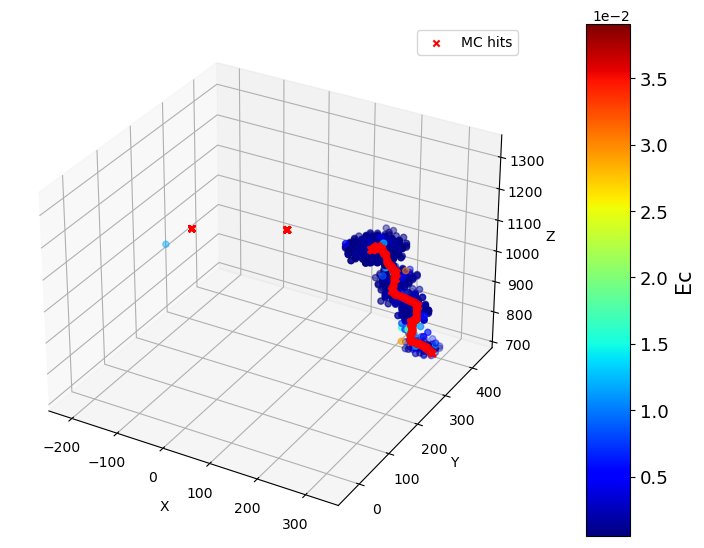

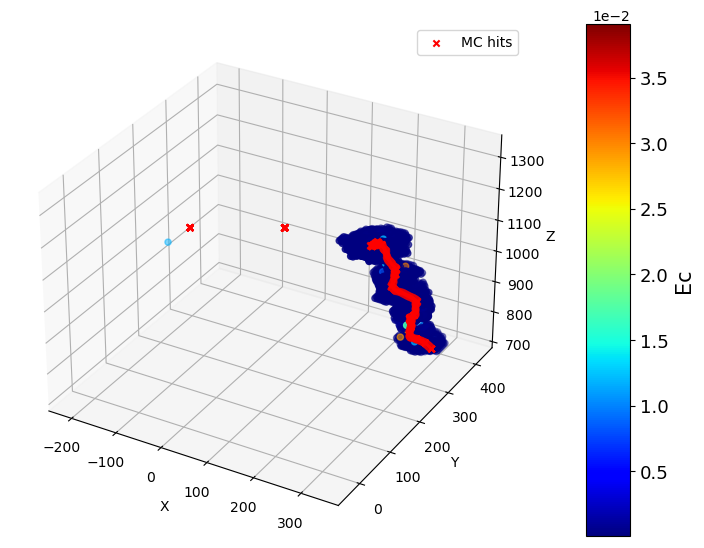

In [318]:
plot_3d_hits(reco_ev, 'Ec', coords = ['X', 'Y', 'Z'], mc_hits=nexus_ev, buffer = 50)
plot_3d_hits(reco_interp_ev, 'Ec', coords = ['X', 'Y', 'Z'], mc_hits=nexus_ev, buffer = 50)

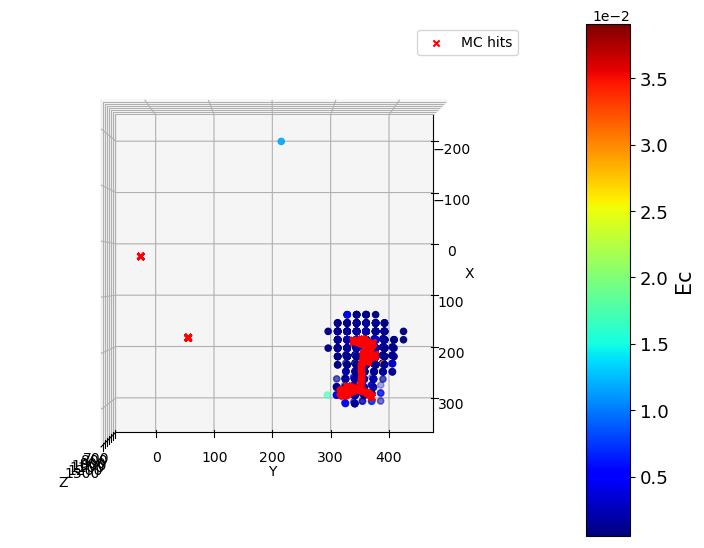

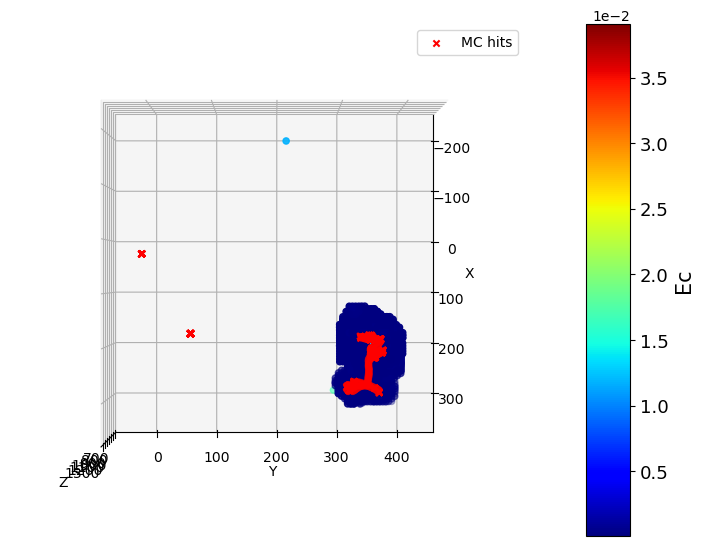

In [319]:
plot_3d_hits(reco_ev, 'Ec', coords = ['X', 'Y', 'Z'], mc_hits=nexus_ev, buffer = 50, init_view=(90, 0))
plot_3d_hits(reco_interp_ev, 'Ec', coords = ['X', 'Y', 'Z'], mc_hits=nexus_ev, buffer = 50, init_view=(90, 0))

In [147]:
event

,label,energy,dataset_id,xbin,ybin,zbin,class_0,class_1
55799,0,0.000351,160,27,45,60,0.942244,0.057756
55800,0,0.000493,160,27,47,61,0.963773,0.036227
55801,0,0.000845,160,27,48,60,0.974588,0.025412
55802,0,0.000324,160,27,49,60,0.972651,0.027349
55803,0,0.000286,160,27,49,61,0.967038,0.032962
...,...,...,...,...,...,...,...,...
56119,0,0.000474,160,43,43,54,0.945977,0.054023
56120,0,0.000637,160,43,44,52,0.952040,0.047960
56121,0,0.002706,160,43,44,53,0.943023,0.056977
56122,0,0.000502,160,43,45,53,0.945731,0.054269


In [151]:
plot_3d_hits?

Signature:
plot_3d_hits(
    hits,
    value='energy',
    coords=['xbin', 'ybin', 'zbin'],
    cmap=<matplotlib.colors.LinearSegmentedColormap object at 0x145fc7c97a00>,
    opacity=1,
    title='',
    buffer=10,
    mc_hits=None,
    mc_hits_label='MC hits',
    voxel_info=None,
    frame_lims=None,
    cmlims=None,
    frameon=True,
    save_plot=False,
    init_view=None,
    plot_mode='scatter',
)
Docstring: <no docstring>
File:      /scratch/455885/ipykernel_4114517/2108752576.py
Type:      function


reco voxels


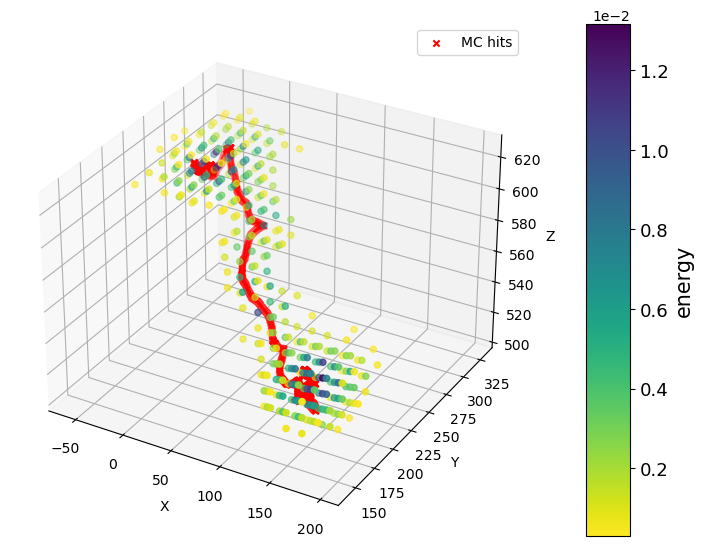

reco label


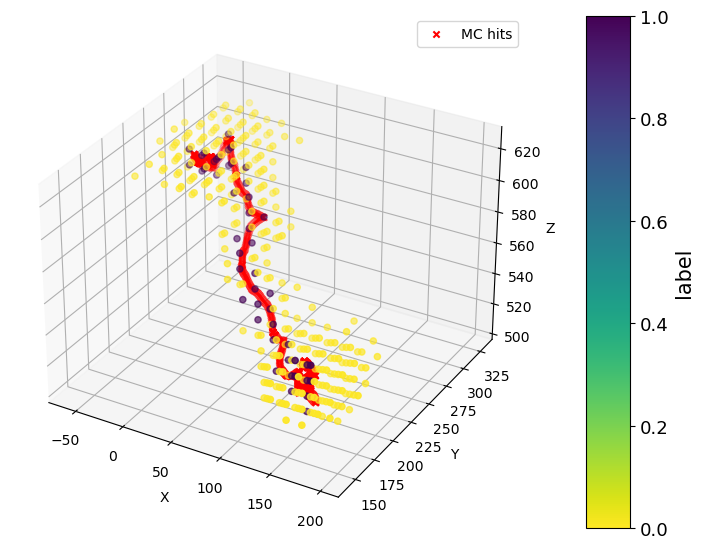

reco class 1 score


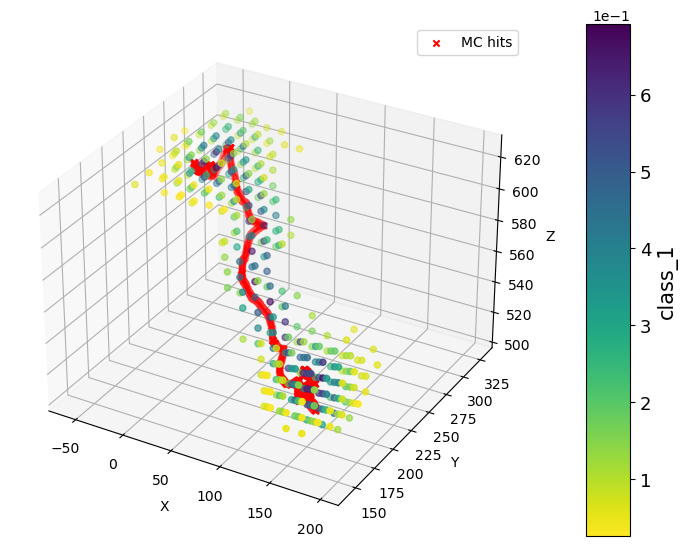

reco class 1 score > 0.5


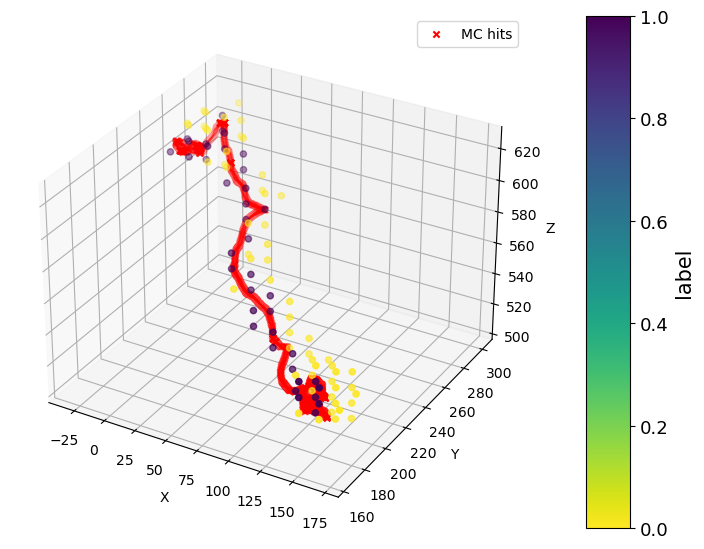

In [ ]:
# PREDICTION FILE
print('reco voxels')
plot_3d_hits(event, cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], buffer=10, mc_hits=nexus_event, voxel_info=bins_info, plot_mode = 'voxels')
print('reco label')
plot_3d_hits(event, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], buffer=10, mc_hits=nexus_event, voxel_info=bins_info)
print('reco class 1 score')
plot_3d_hits(event, 'class_1', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], buffer=10, mc_hits=nexus_event, voxel_info=bins_info)
print('reco class 1 score > 0.5')
plot_3d_hits(event[event.class_1 > thr], 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], buffer=10, mc_hits=nexus_event, voxel_info=bins_info)

0.0


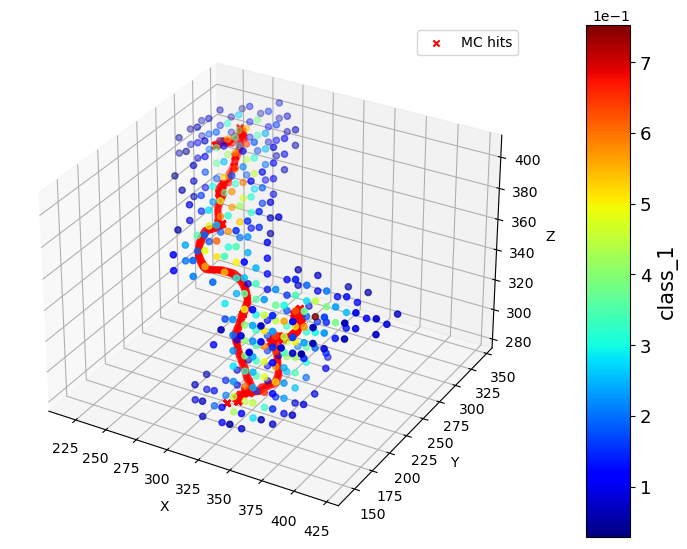

0.05


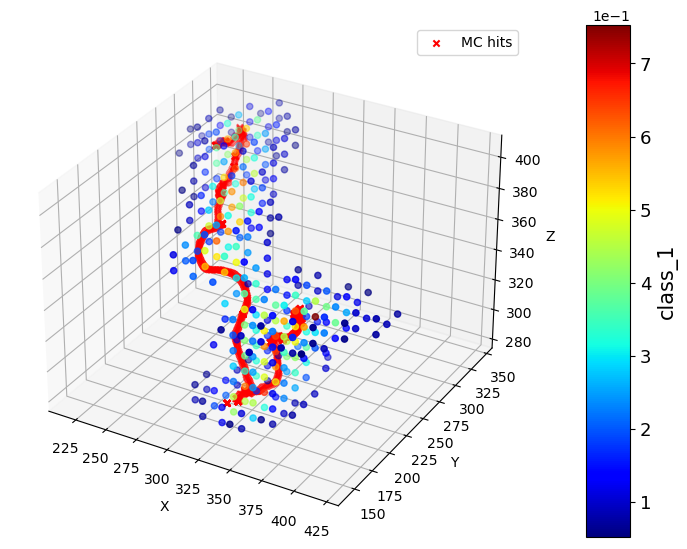

0.1


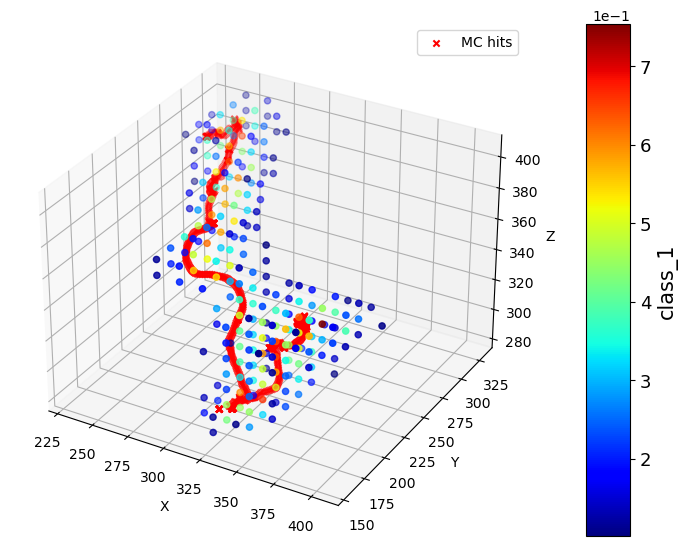

0.15000000000000002


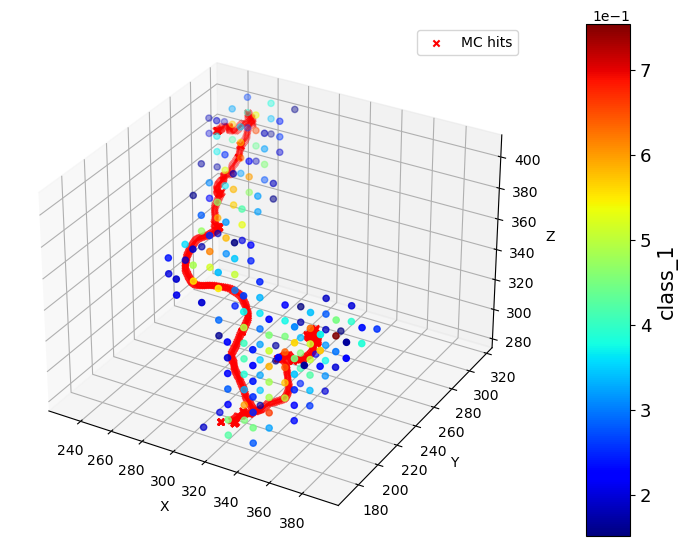

0.2


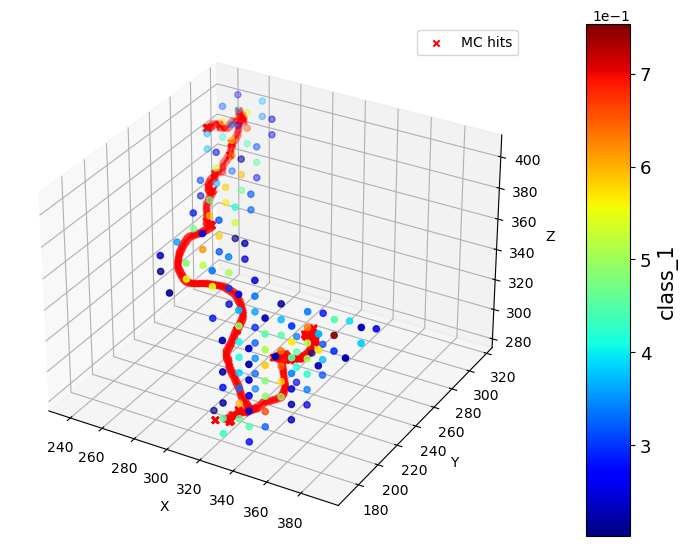

0.25


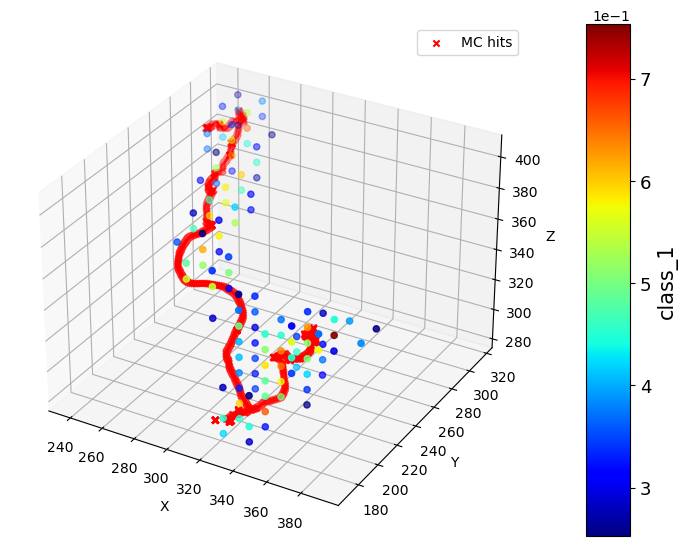

0.30000000000000004


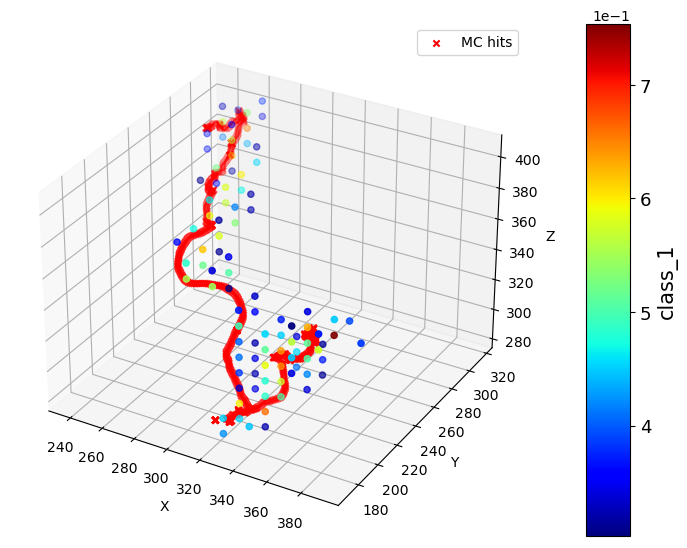

0.35000000000000003


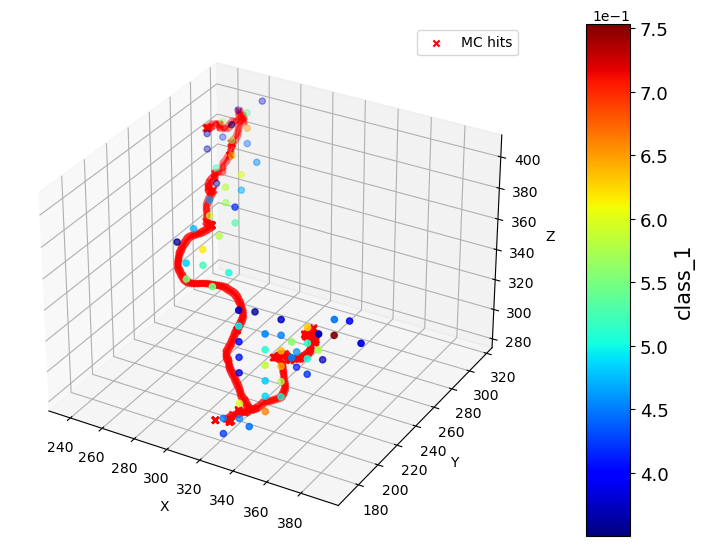

0.4


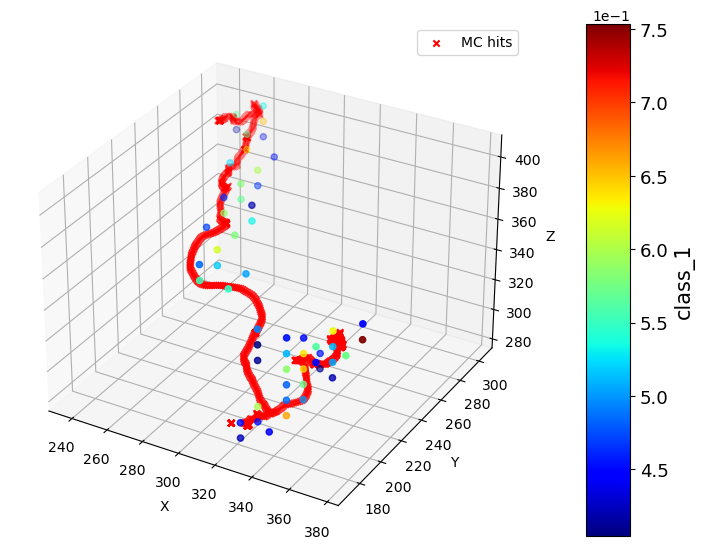

0.45


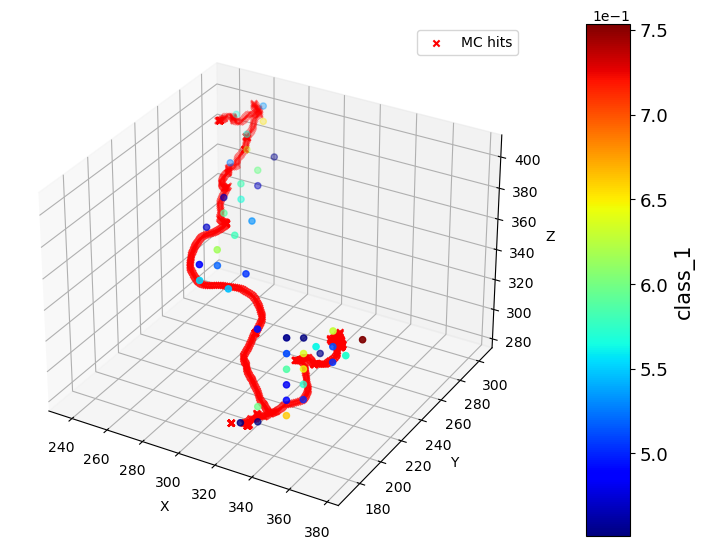

0.5


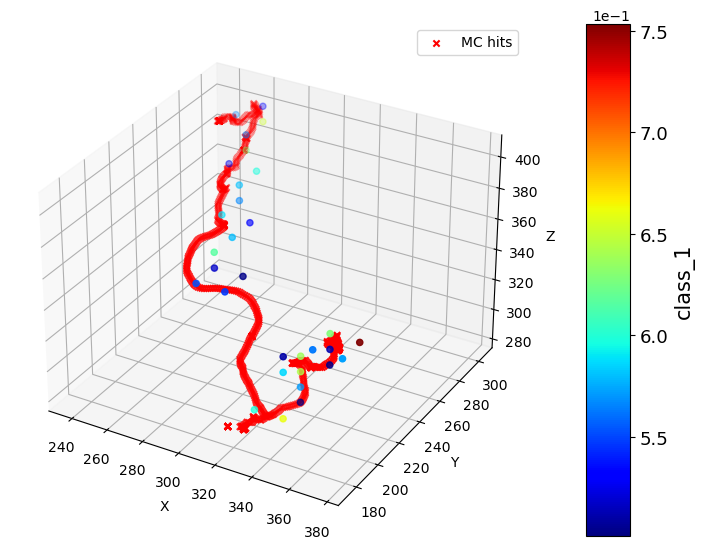

0.55


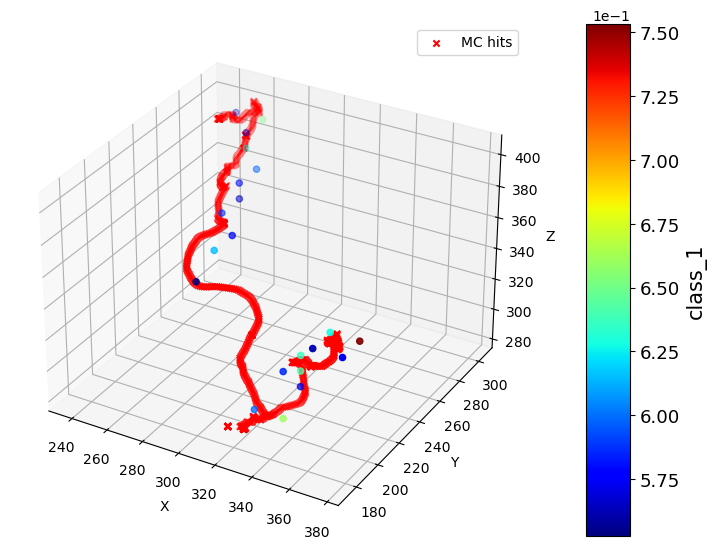

0.6000000000000001


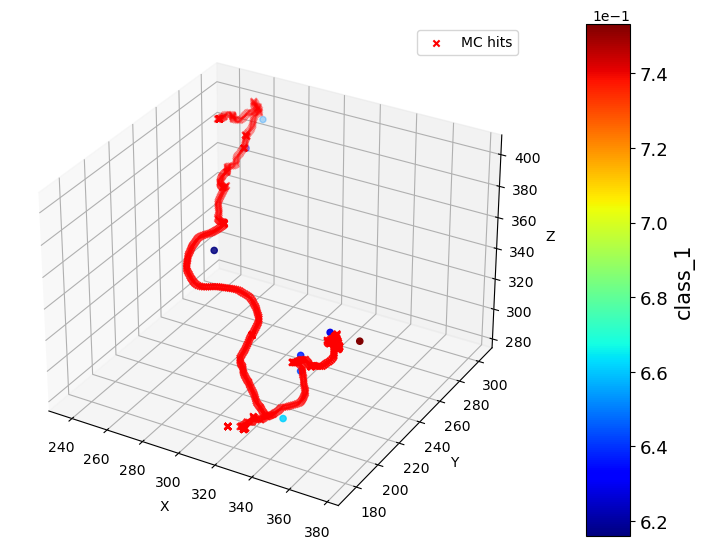

0.65


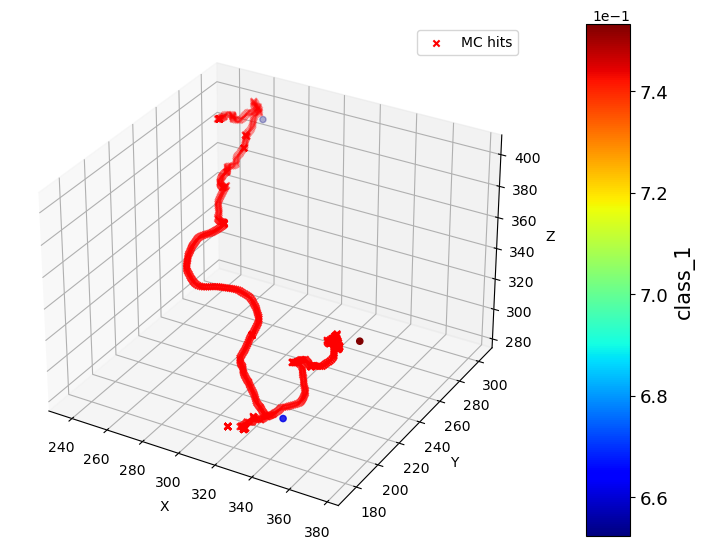

0.7000000000000001


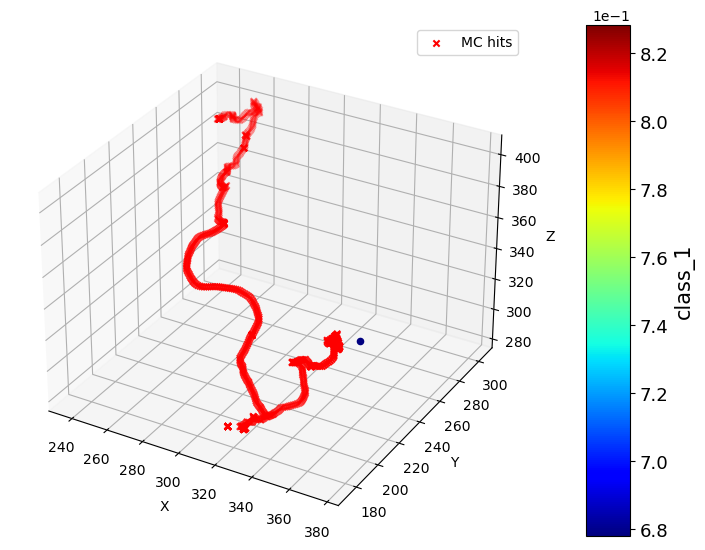

0.75


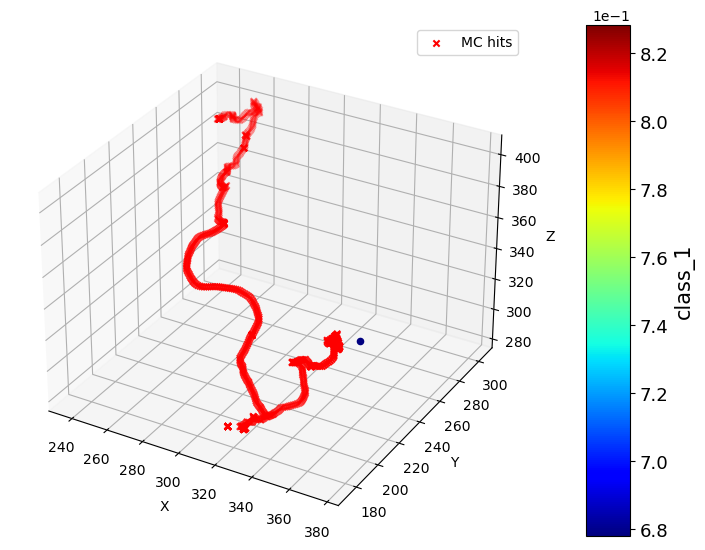

0.8
No more hits with enough track score
0.8500000000000001
No more hits with enough track score
0.9
No more hits with enough track score
0.9500000000000001
No more hits with enough track score


In [60]:
# loop to iteratively clean the track
frame_lims = event[['xbin', 'ybin', 'zbin']].min().values, event[['xbin', 'ybin', 'zbin']].max().values
for th in np.arange(0, 1, 0.05):
    print(th)
    clean_event = event[event.class_1 > th]
    if len(clean_event) > 0:
        plot_3d_hits(clean_event, 'class_1', coords=['xbin', 'ybin', 'zbin'], frame_lims=None, mc_hits = nexus_event, voxel_info=bins_info)
    else:
        print('No more hits with enough track score')

0.0


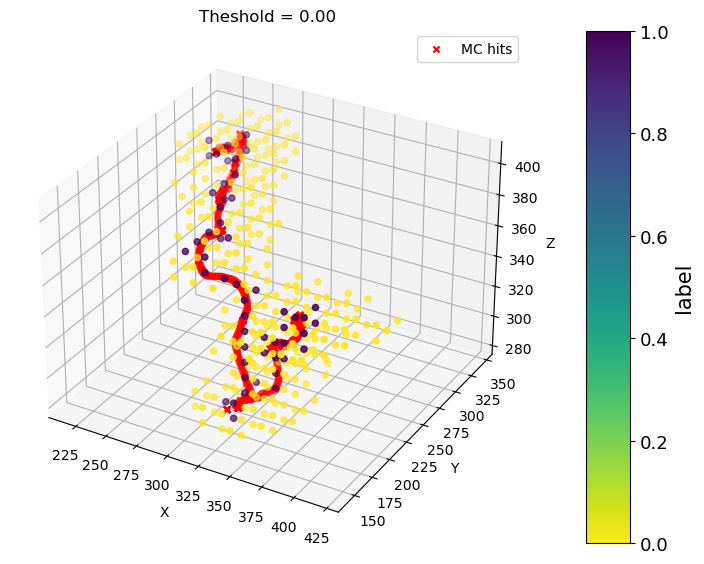

0.05


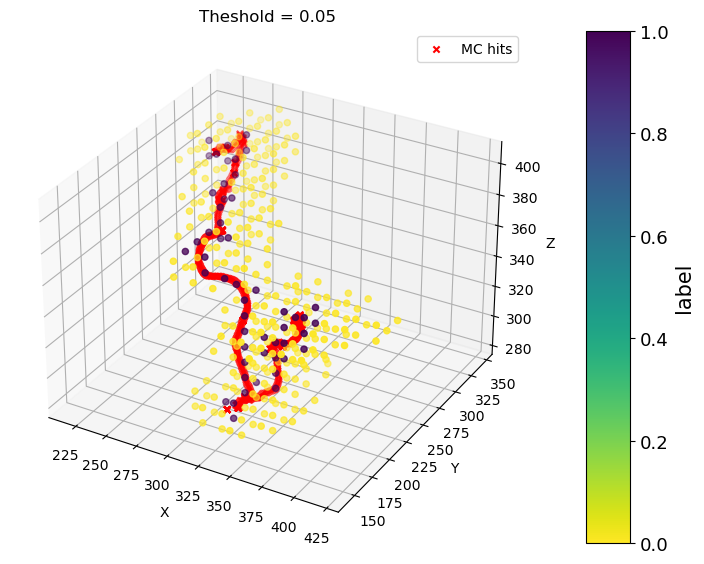

0.1


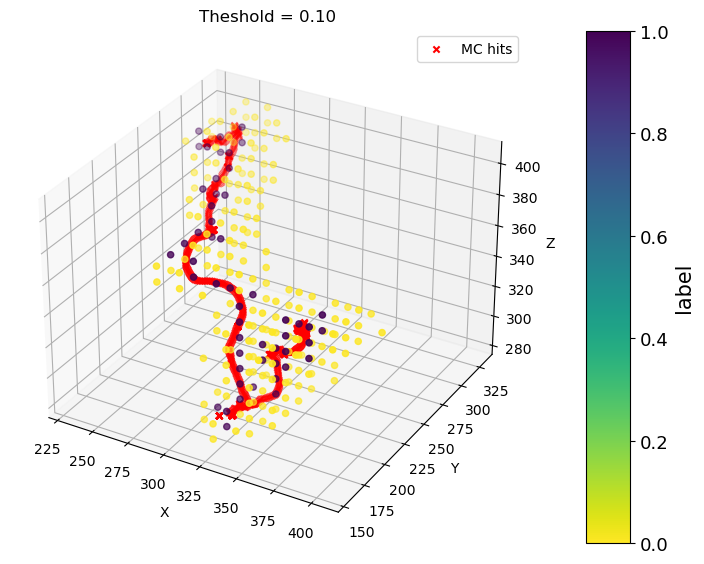

0.15000000000000002


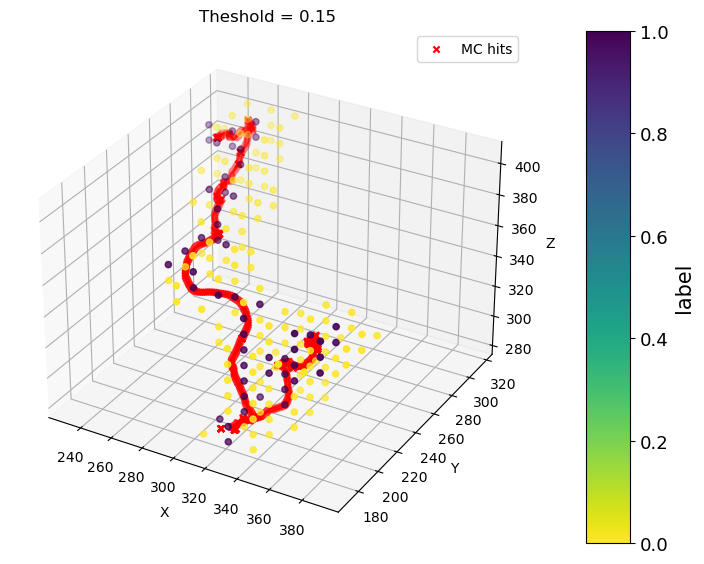

0.2


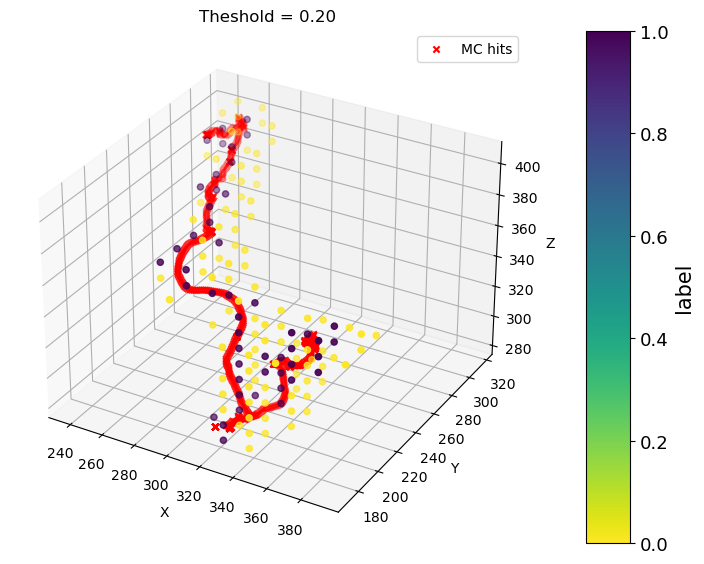

0.25


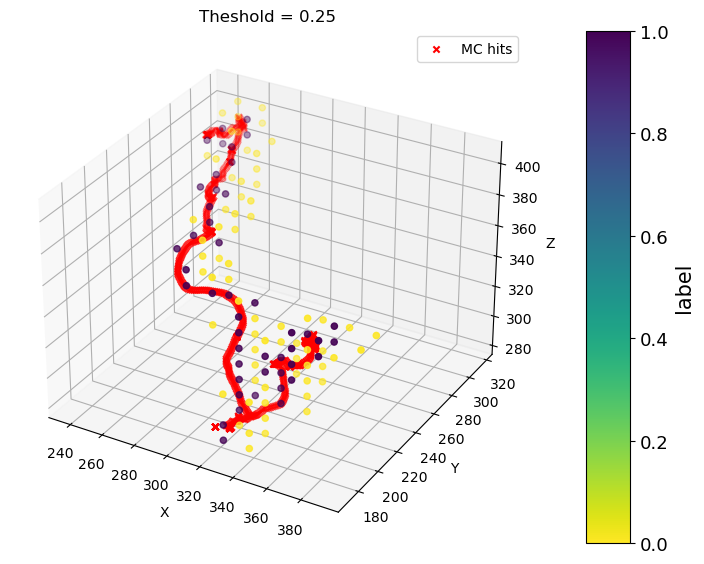

0.30000000000000004


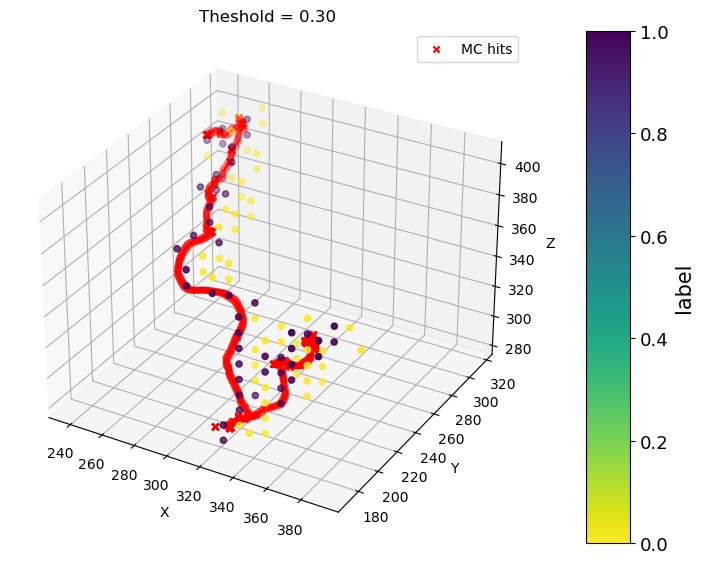

0.35000000000000003


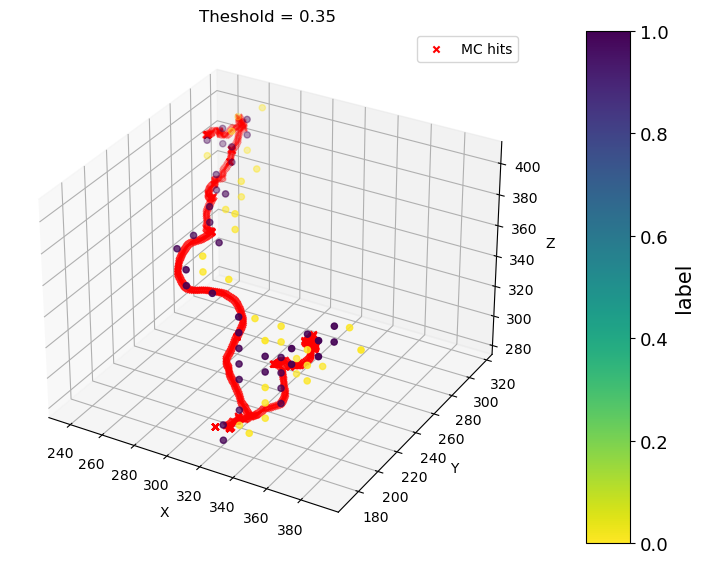

0.4


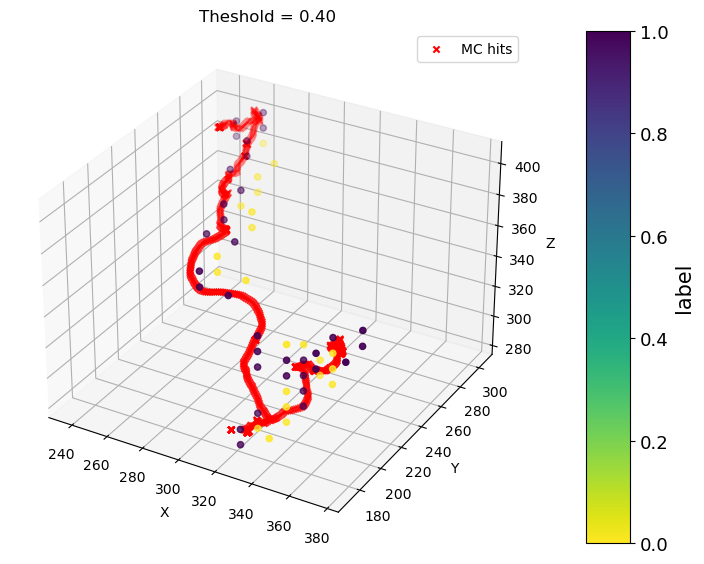

0.45


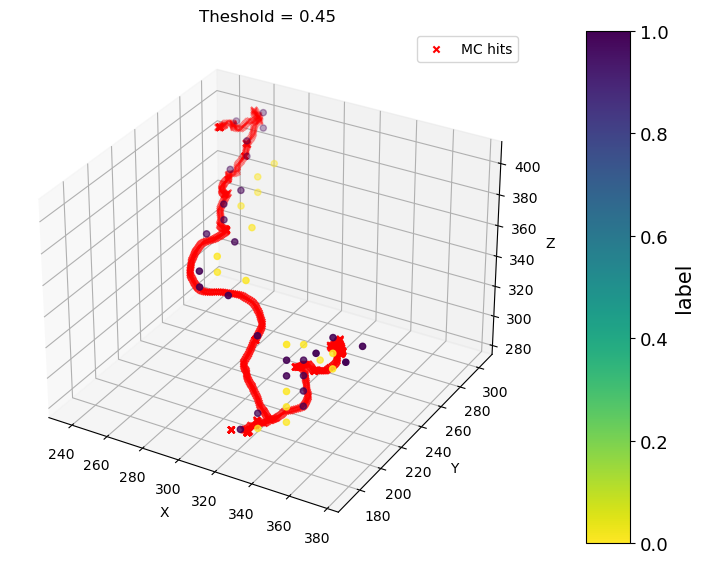

0.5


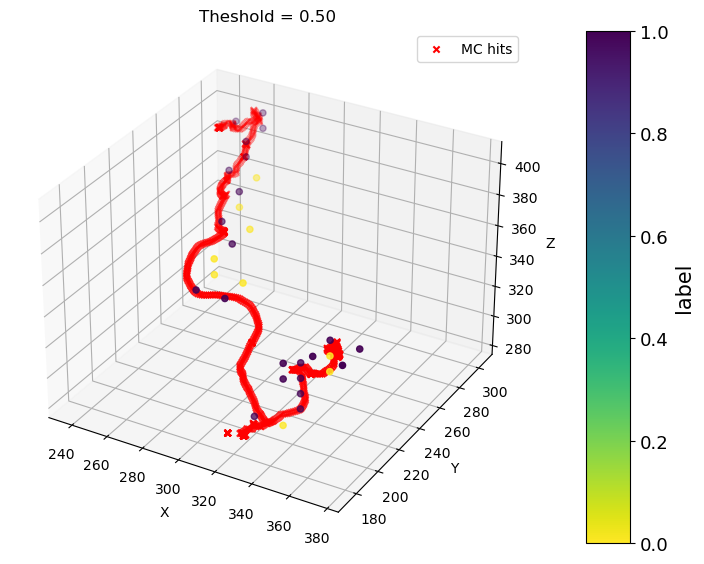

0.55


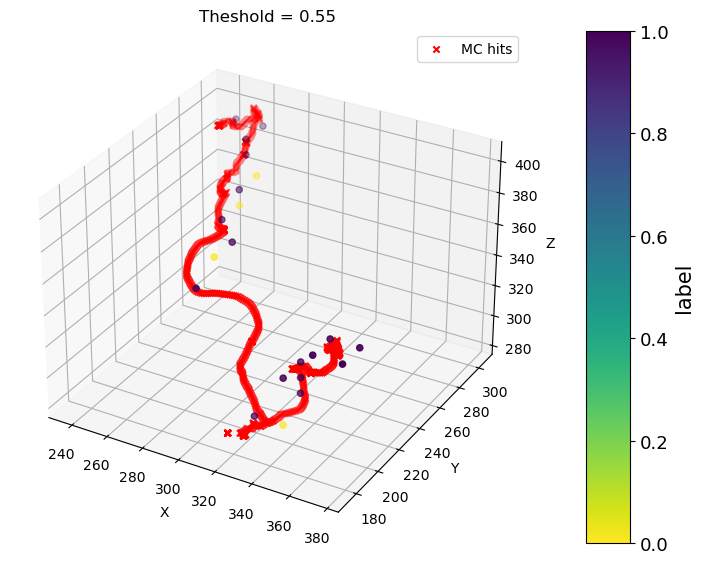

0.6000000000000001


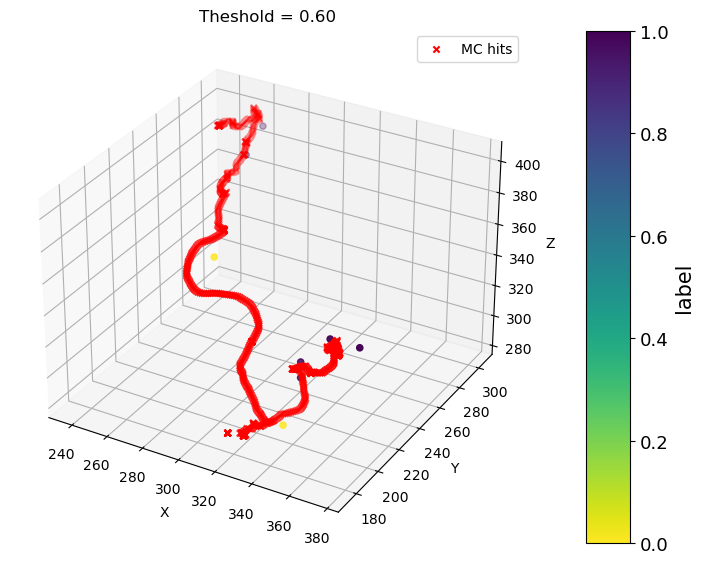

0.65


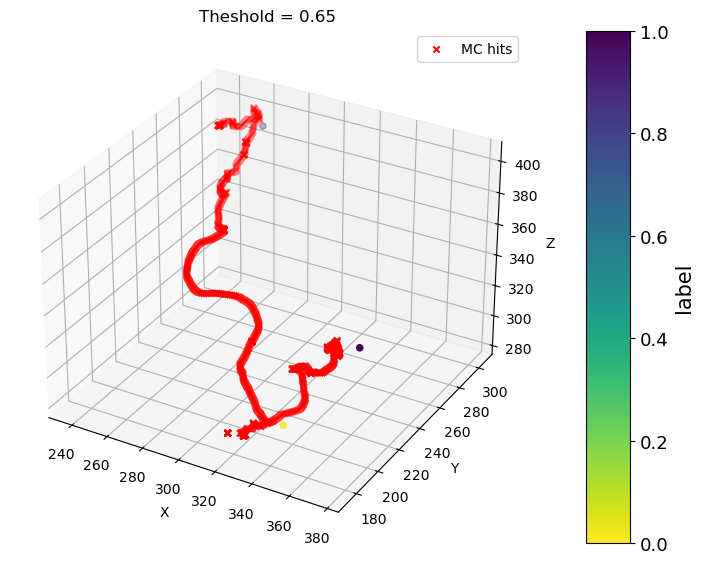

0.7000000000000001


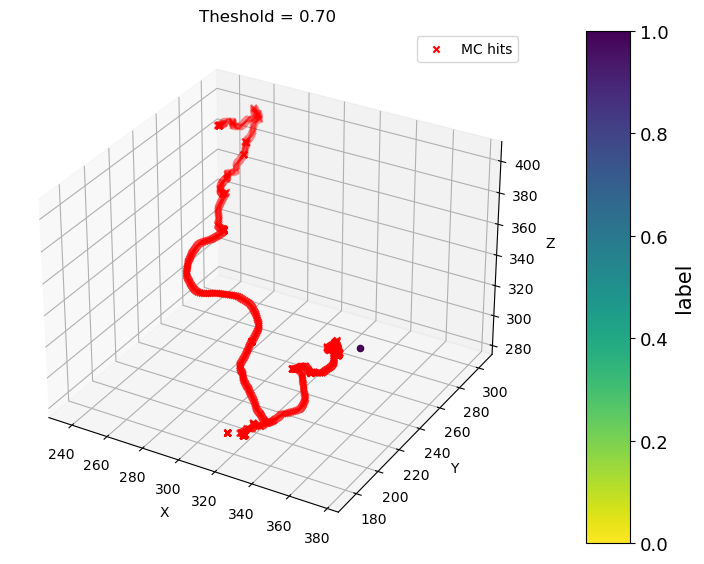

0.75


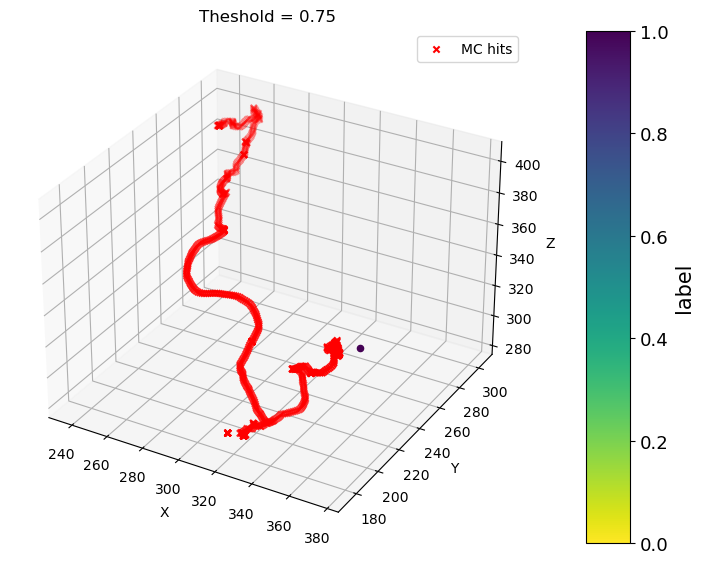

0.8
No more hits with enough track score
0.8500000000000001
No more hits with enough track score
0.9
No more hits with enough track score
0.9500000000000001
No more hits with enough track score


In [61]:
# loop to iteratively clean the track
image_paths = []
for idx, th in enumerate(np.arange(0, 1, 0.05)):
    print(th)
    clean_event = event[event.class_1 > th]
    if len(clean_event > 1):
        plot_3d_hits(clean_event, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, cmlims=[0, 1])
    else:
        print('No more hits with enough track score')

In [147]:
# ############# CREATE GIF ################
# # loop to iteratively clean the track
# frame_lims = event[['xbin', 'ybin', 'zbin']].min().values, event[['xbin', 'ybin', 'zbin']].max().values
# image_paths = []
# for idx, th in enumerate(np.arange(0, 1, 0.05)):
#     print(th)
#     clean_event = event[event.class_1 > th]
#     if len(clean_event > 1):
#         plot_3d_hits(clean_event, 'label', cmap=mpl.cm.cividis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=frame_lims, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, cmlims=[0, 1], save_plot=True)
#         frame_path = f"frames/frame_{idx:03d}.png"
#         plt.savefig(frame_path)
#         plt.close()
#         image_paths.append(frame_path)
#     else:
#         print('No more hits with enough track score')

# from PIL import Image

# frames = [Image.open(img) for img in image_paths]
# frames[0].save(
#     'track_evolution.gif', 
#     save_all=True, 
#     append_images=frames[1:], 
#     duration=500,  # Control speed (in ms)
#     loop=0          # Loop indefinitely
# )

### Metrics 

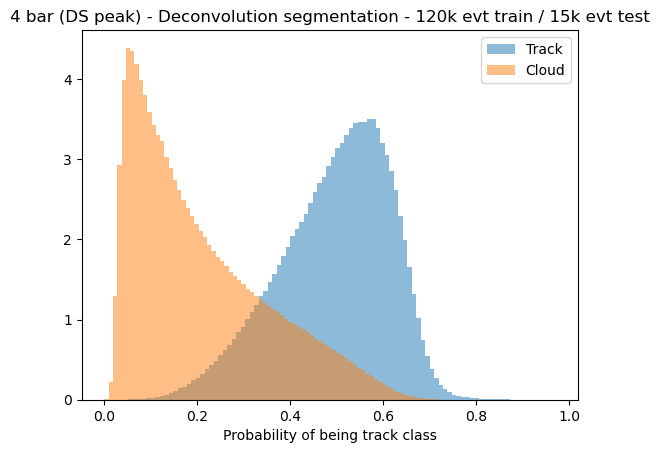

In [18]:
plt.hist(prediction[prediction.label == 1].class_1, 100, density=True, alpha = 0.5, label = 'Track')
plt.hist(prediction[prediction.label == 0].class_1, 100, density=True, alpha = 0.5, label = 'Cloud')
plt.xlabel('Probability of being track class')
plt.title('4 bar (DS peak) - Deconvolution segmentation - 120k evt train / 15k evt test')
plt.legend()
plt.show()

#### Intersection Over Union

- Metric for each of the classes, used when 2 classes are very unbalanced (in this case, class 0 has >90% of the voxels)
- We use the group of true voxels, and the group of predicted voxels
- The IoU is the intersection between the previous groups over the union of those
- This way we can check how class 1 performs, because it is the less common one.

In [12]:
import sys
from sklearn.metrics import confusion_matrix

def acc_and_IoU(true, pred, nclass = 2):
    """
        Intersection over union is a metric for semantic segmentation.
        It returns a IoU value for each class of our input tensors/arrays.
    """
    eps = sys.float_info.epsilon
    # conf_matrix = np.zeros((nclass, nclass))

    # for i in range(len(true)):
    #     conf_matrix[true[i]][pred[i]] += 1

    conf_matrix = confusion_matrix(true, pred)

    acc, IoU = [], []
    for i in range(nclass):
        acc.append((conf_matrix[i, i] + eps) / sum(conf_matrix[i, :]) + eps)
        IoU.append((conf_matrix[i, i] + eps) / (sum(conf_matrix[:, i]) + sum(conf_matrix[i, :]) - conf_matrix[i, i] + eps))
    total_acc = (sum(np.diagonal(conf_matrix)) + eps) / (sum(sum(conf_matrix)) + eps)
    return np.array(acc), total_acc, np.array(IoU)

In [24]:
acc_and_IoU(prediction.label.values, prediction.prediction.values)

(array([0.63948735, 0.8603585 ]),
 0.671248561430992,
 array([0.62483318, 0.2734305 ]))

In [13]:
thresholds = np.linspace(0, 1, 101)
acc, total_acc, iou = [], [], []
for th in thresholds:
    acc_, total_acc_, iou_ = acc_and_IoU(prediction.label.values, (prediction.class_1 > th).astype('int').values)
    acc.append(acc_)
    total_acc.append(total_acc_)
    iou.append(iou_)

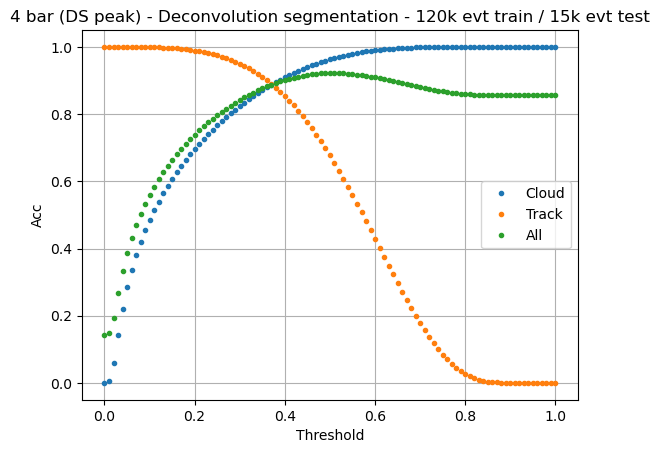

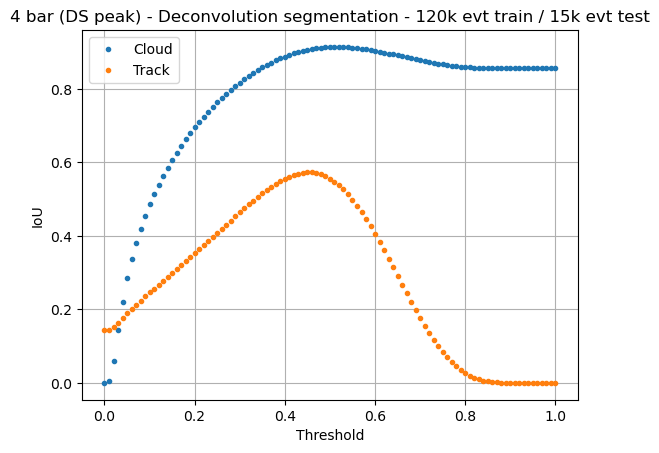

In [15]:
plt.plot(thresholds, np.array(acc)[:, 0], '.', label = 'Cloud')
plt.plot(thresholds, np.array(acc)[:, 1], '.', label = 'Track')
plt.plot(thresholds, np.array(total_acc), '.', label = 'All')
plt.legend()
plt.xlabel('Threshold')
plt.ylabel('Acc')
plt.title('4 bar (DS peak) - Deconvolution segmentation - 120k evt train / 15k evt test')
plt.grid()
plt.show()
plt.plot(thresholds, np.array(iou)[:, 0], '.', label = 'Cloud')
plt.plot(thresholds, np.array(iou)[:, 1], '.', label = 'Track')
plt.legend()
plt.xlabel('Threshold')
plt.ylabel('IoU')
plt.title('4 bar (DS peak) - Deconvolution segmentation - 120k evt train / 15k evt test')
plt.grid()
plt.show()

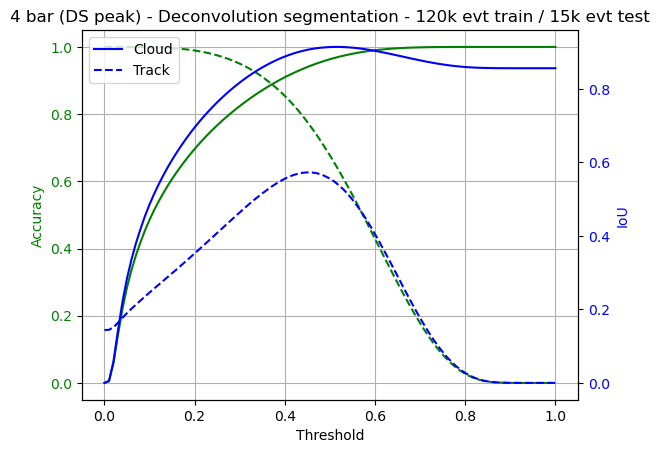

In [16]:
# Create the plot
fig, ax1 = plt.subplots()
plt.grid()
# Primary y-axis
ax1.plot(thresholds, np.array(acc)[:, 0], 'g-', label = 'Cloud')
ax1.plot(thresholds, np.array(acc)[:, 1], 'g--', label = 'Track')
ax1.set_xlabel('Threshold')
ax1.set_ylabel('Accuracy', color='g')
ax1.tick_params(axis='y', labelcolor='g')

# Secondary y-axis
ax2 = ax1.twinx()
ax2.plot(thresholds, np.array(iou)[:, 0], 'b-', label = 'Cloud')
ax2.plot(thresholds, np.array(iou)[:, 1], 'b--', label = 'Track')
ax2.set_ylabel('IoU', color='b')
ax2.tick_params(axis='y', labelcolor='b')

# # Adding legends
# ax2.legend(loc='upper right')
plt.legend()
plt.title('4 bar (DS peak) - Deconvolution segmentation - 120k evt train / 15k evt test')

plt.show()

For the th = 0, the IoU of the class 1 is the % of the voxels of class 1 in the whole dataset:

In [82]:
prediction.label.sum() /len(prediction), iou[0][1]

(0.14379970839446324, 0.14379970839446324)

For the th = 1, the IoU of the class 0 is the % of the voxels of class 0 in the whole dataset:

In [83]:
1-(prediction.label.sum() /len(prediction)), iou[-1][0]

(0.8562002916055368, 0.8562002916055368)

#### Chamfer Distance 

The Chamfer Distance between two point clouds T and P is defined as:

$$
d_{\text{Chamfer}}(T, P) = \frac{1}{2|T|} \sum_{t \in T} \min_{p \in P} \| t - p \|^2
+ \frac{1}{2|P|} \sum_{p \in P} \min_{t \in T} \| p - t \|^2
$$

Where:
- T = Set of true voxels (label = 1)  
- P = Set of predicted voxels (score ≥ threshold)  
- |T| and |P| = Number of points in each set  
- Factor 1/2 to do the mean between the two directions


#### Hausdorff distance

The Hausdorff distance $d_H(T, P)$ between two sets T and P is defined as:

$$
d_H(T, P) = \max \left( \sup_{t \in T} \inf_{p \in P} \|t - p\|, \sup_{p \in P} \inf_{t \in T} \|p - t\| \right)
$$

Where:
- T and P are two non-empty subsets of a metric space.
- \|t - p\| is the distance between the points t and p (typically Euclidean distance).
- The supremum (\( \sup \)) is the least upper bound (maximum) of the infimum (\( \inf \)) distances from each point in one set to the nearest point in the other set. (It searchs for the smallest distance between every point (from T to P and back again) and selects the maximum of all those)
- Sometimes instead of choosing the maximum of both directions, a mean is done
- PENALIZES OUTLIERS / FALSE POSITIVE VOXELS FAR FROM THE TRUE TRACK


In [59]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree

def compute_chamfer_and_hausdorff_distance(df, score_threshold=0.5, elevate = 2):
    """
    """
    chamfer_results, hausdorff_results = [], []

    for dataset_id, group in df.groupby('dataset_id'):
        true_voxels = group[group['label'] == 1][['xbin', 'ybin', 'zbin']].values
        if score_threshold:
            predicted_voxels = group[group['class_1'] >= score_threshold][['xbin', 'ybin', 'zbin']].values
        else: 
            predicted_voxels = group[group['prediction'] == 1][['xbin', 'ybin', 'zbin']].values

        if len(true_voxels) == 0 or len(predicted_voxels) == 0:
            chamfer_distance, hausdorff_distance = np.inf, np.inf  # Handle edge case where one set is empty
        else:
            # KDTree for nearest neighbor queries
            true_tree = cKDTree(true_voxels)
            pred_tree = cKDTree(predicted_voxels)

            # True -> Predicted distances
            pred_to_true_distances, _ = pred_tree.query(true_voxels, k=1)
            mean_pred_to_true = np.mean(pred_to_true_distances**elevate)

            # Predicted -> True distances
            true_to_pred_distances, _ = true_tree.query(predicted_voxels, k=1)
            mean_true_to_pred = np.mean(true_to_pred_distances**elevate)

            # Average Chamfer Distance
            chamfer_distance = (mean_pred_to_true + mean_true_to_pred) / 2

            # Hausdorff Distance is the max of both directional distances
            hausdorff_distance = max(np.max(true_to_pred_distances), np.max(pred_to_true_distances))

        chamfer_results.append(chamfer_distance)
        hausdorff_results.append(hausdorff_distance)

    return chamfer_results, hausdorff_results

def compute_chamfer_and_hausdorff_distance_evnt_info(df, events_info, elevate = 2):
    """
    """
    chamfer_results, hausdorff_results = [], []

    for dataset_id, group in df.groupby('dataset_id'):
        true_voxels = group[group['label'] == 1][['xbin', 'ybin', 'zbin']].values
        th = events_info[events_info.dataset_id == dataset_id].threshold.values[0]
        predicted_voxels = group[group['class_1'] >= th][['xbin', 'ybin', 'zbin']].values

        if len(true_voxels) == 0 or len(predicted_voxels) == 0:
            chamfer_distance, hausdorff_distance = np.inf, np.inf  # Handle edge case where one set is empty
        else:
            # KDTree for nearest neighbor queries
            true_tree = cKDTree(true_voxels)
            pred_tree = cKDTree(predicted_voxels)

            # True -> Predicted distances
            pred_to_true_distances, _ = pred_tree.query(true_voxels, k=1)
            mean_pred_to_true = np.mean(pred_to_true_distances**elevate)

            # Predicted -> True distances
            true_to_pred_distances, _ = true_tree.query(predicted_voxels, k=1)
            mean_true_to_pred = np.mean(true_to_pred_distances**elevate)

            # Average Chamfer Distance
            chamfer_distance = (mean_pred_to_true + mean_true_to_pred) / 2

            # Hausdorff Distance is the max of both directional distances
            hausdorff_distance = max(np.max(true_to_pred_distances), np.max(pred_to_true_distances))

        chamfer_results.append(chamfer_distance)
        hausdorff_results.append(hausdorff_distance)

    return chamfer_results, hausdorff_results

In [5]:
thresholds = np.linspace(0, 1, 101)
chamfer, hausdorff = [], []
mean_chamfer, mean_hausdorff = [], []
for th in thresholds:
    ch, ha = compute_chamfer_and_hausdorff_distance(prediction, score_threshold=th)
    chamfer.append(ch)
    hausdorff.append(ha)
    mean_chamfer.append(np.mean(ch))
    mean_hausdorff.append(np.mean(ha))

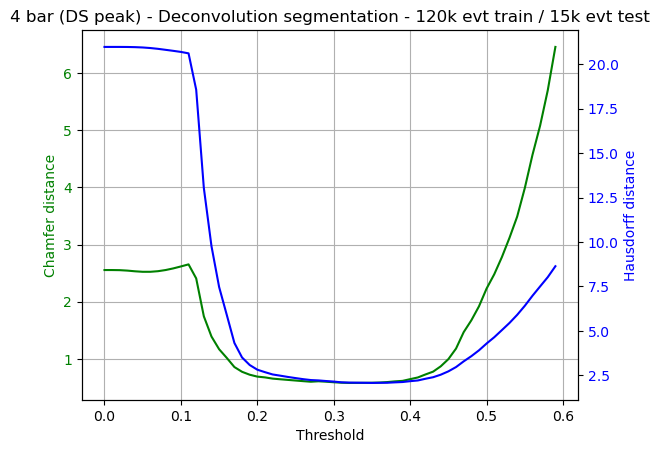

In [6]:
# Create the plot
fig, ax1 = plt.subplots()
plt.grid()
# Primary y-axis
ax1.plot(thresholds, np.array(mean_chamfer), 'g-')
ax1.set_xlabel('Threshold')
ax1.set_ylabel('Chamfer distance', color='g')
ax1.tick_params(axis='y', labelcolor='g')

# Secondary y-axis
ax2 = ax1.twinx()
ax2.plot(thresholds, np.array(mean_hausdorff), 'b-')
ax2.set_ylabel('Hausdorff distance', color='b')
ax2.tick_params(axis='y', labelcolor='b')

# # Adding legends
# ax2.legend(loc='upper right')

plt.title('4 bar (DS peak) - Deconvolution segmentation - 120k evt train / 15k evt test')

plt.show()

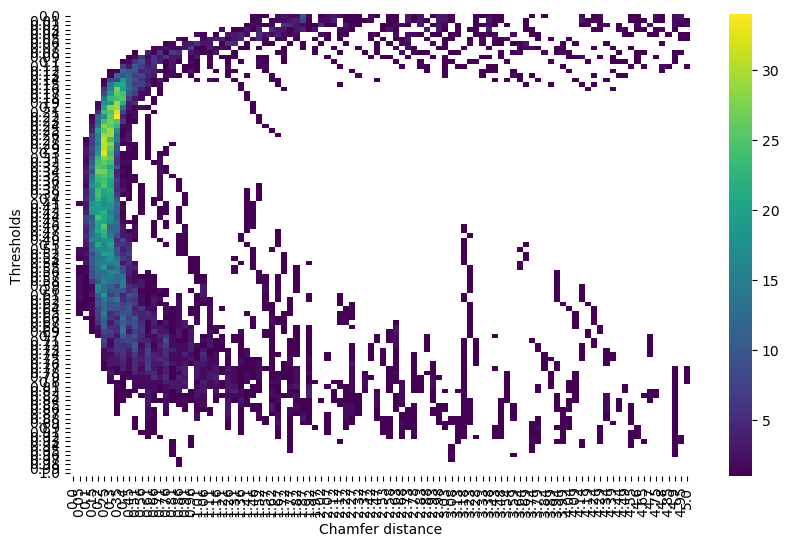

In [63]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


max_val = 5 #max(np.array(chamfer)[np.isfinite(np.array(chamfer))])
# Binning data
num_bins = 100
binned_data = [np.histogram(d, bins=num_bins, range=(0, max_val))[0] for d in chamfer]

# Convert to heatmap array
heatmap_data = np.array(binned_data)  # Transpose to match axes
mask = (heatmap_data == 0)
# Plotting
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, cmap='viridis', mask = mask, yticklabels=np.round(thresholds, 2), 
            xticklabels=np.round(np.linspace(0, max_val, num_bins), 2))
plt.ylabel('Thresholds')
plt.xlabel('Chamfer distance')
plt.title('')
plt.show()


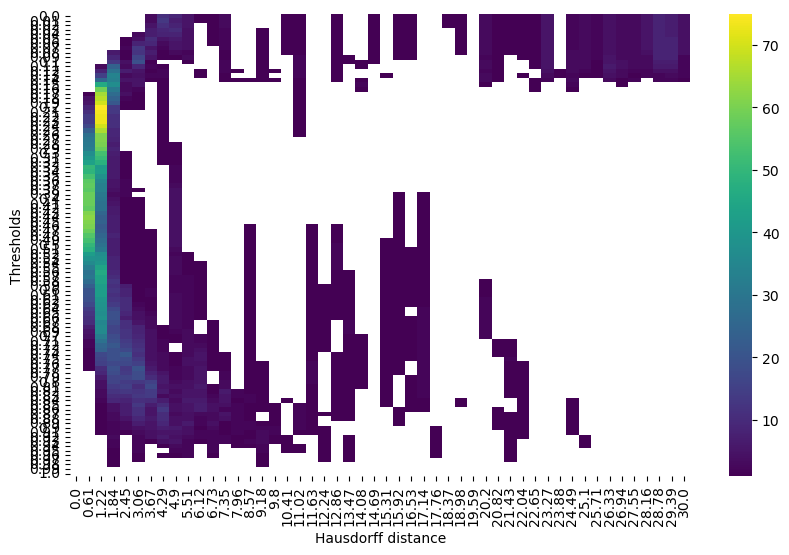

In [142]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


max_val = 30 #max(np.array(chamfer)[np.isfinite(np.array(chamfer))])
# Binning data
num_bins = 50
binned_data = [np.histogram(d, bins=num_bins, range=(0, max_val))[0] for d in hausdorff]

# Convert to heatmap array
heatmap_data = np.array(binned_data)  # Transpose to match axes
mask = (heatmap_data == 0)
# Plotting
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, cmap='viridis', mask = mask, yticklabels=np.round(thresholds, 2), 
            xticklabels=np.round(np.linspace(0, max_val, num_bins), 2))
plt.ylabel('Thresholds')
plt.xlabel('Hausdorff distance')
plt.title('')
plt.show()

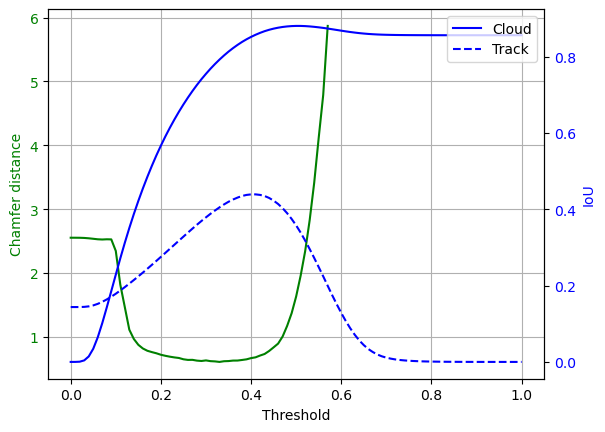

In [105]:
# Create the plot
fig, ax1 = plt.subplots()
plt.grid()
# Primary y-axis
ax1.plot(thresholds, np.array(mean_chamfer), 'g-')
ax1.set_xlabel('Threshold')
ax1.set_ylabel('Chamfer distance', color='g')
ax1.tick_params(axis='y', labelcolor='g')

# Secondary y-axis
ax2 = ax1.twinx()
ax2.plot(thresholds, np.array(iou)[:, 0], 'b-', label='Cloud')
ax2.plot(thresholds, np.array(iou)[:, 1], 'b--', label='Track')
ax2.set_ylabel('IoU', color='b')
ax2.tick_params(axis='y', labelcolor='b')

# Adding legends
ax2.legend(loc='upper right')

plt.title('')

plt.show()


### Recover the energy

Once the prediction is set, we got left with some voxels for each event that don't add up to one anymore. The way of proceeding would be re-normalizing them, so we could then just multiply by the total energy we had originally. This might be computationally slow because we have to reaccess all the data. I should maybe in the summary save the total energy of each event, so we don't need to come back for every event...

In [16]:
th = 0.4

final_pred = prediction[prediction.class_1 > th].copy()
final_pred['norm_energy'] = final_pred.groupby('dataset_id')['energy'].transform(lambda x: x / x.sum())

In [17]:
# pred_ev_info = events_info[np.isin(events_info.dataset_id, final_pred.dataset_id.unique())].copy()
# pred_sns_df = pd.read_hdf(pred_ev_info.pathname.unique()[0] + '/' + pred_ev_info.basename.unique()[0], 'Sensim/sns_vox_df')
# pred_ev_info = pred_ev_info.merge(pred_sns_df.groupby('event').ebin.sum(), on = 'event')

In [18]:
# final_pred['final_energy'] = final_pred['norm_energy'] * final_pred['dataset_id'].map(pred_ev_info.set_index('dataset_id')['ebin'])

final_pred['final_energy'] = final_pred['norm_energy'] * final_pred['dataset_id'].map(events_info.set_index('dataset_id')['total_energy'])

In [19]:
final_ev = final_pred[final_pred.dataset_id == dat_id]

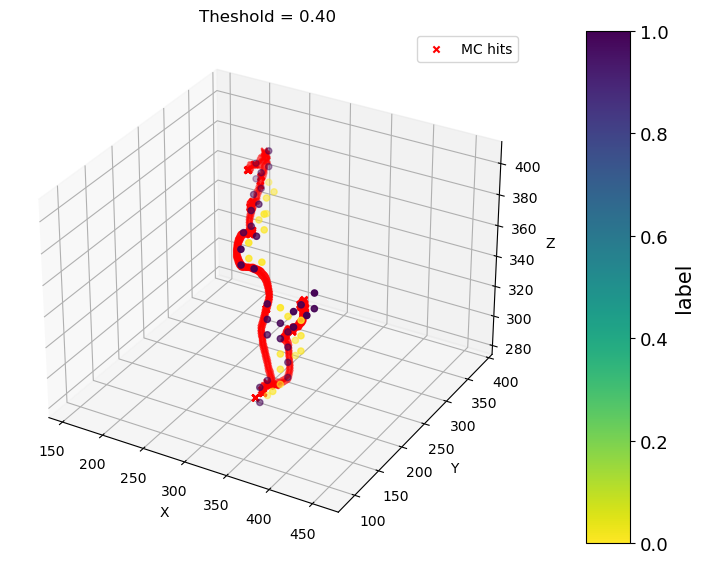

In [104]:
plot_3d_hits(final_ev, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, cmlims=[0, 1], buffer=100)
# plot_3d_hits(final_ev, 'class_1', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, cmlims=[0, 1], buffer=100)
# plot_3d_hits(final_ev, 'energy', cmap=mpl.cm.jet, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, buffer=100)
# plot_3d_hits(final_ev, 'norm_energy', cmap=mpl.cm.jet, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, buffer=100)
# plot_3d_hits(final_ev, 'final_energy', cmap=mpl.cm.jet, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, buffer=100)

#### Skeletonize ??

In [79]:
import numpy as np
import pandas as pd
from skimage.morphology import skeletonize_3d
from scipy.ndimage import binary_dilation

def voxelize_data(df, grid_shape):
    """Converts a dataframe of points into a 3D binary voxel grid."""
    voxel_grid = np.zeros(grid_shape, dtype=bool)
    for _, row in df.iterrows():
        voxel_grid[int(row['xbin']), int(row['ybin']), int(row['zbin'])] = True
    return voxel_grid

def skeletonize_track(df, grid_shape):
    """Skeletonizes the 3D voxelized data."""
    voxel_grid = voxelize_data(df, grid_shape)
    skeleton = skeletonize_3d(voxel_grid)
    
    # Extract skeleton points as DataFrame
    skeleton_points = np.argwhere(skeleton)
    skeleton_df = pd.DataFrame(skeleton_points, columns=['x', 'y', 'z'])
    
    return skeleton_df

# Example DataFrame
df = final_ev.copy()

# Define voxel grid size (adjust to your dataset size)
grid_shape = (np.max(df['xbin']) + 1, 
               np.max(df['ybin']) + 1, 
               np.max(df['zbin']) + 1)

# Skeletonization
skeleton_df = skeletonize_track(df, grid_shape)

print(skeleton_df)


    x   y   z
0  16  36  97
1  17  37  98
2  17  38  99


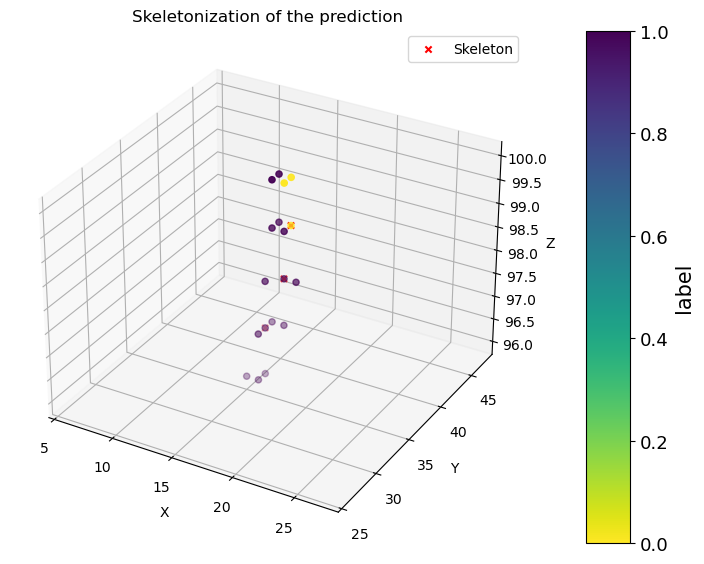

In [80]:
plot_3d_hits(final_ev, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Skeletonization of the prediction',mc_hits = skeleton_df, mc_hits_label = 'Skeleton', buffer=10)

In [82]:
def voxelize_data_(df):
    """Converts a dataframe of points into a 3D binary voxel grid."""
    grid_shape = (np.max(df['xbin']) + 1, np.max(df['ybin']) + 1, np.max(df['zbin']) + 1)
    voxel_grid = np.zeros(grid_shape)
    for _, row in df.iterrows():
        voxel_grid[int(row['xbin']), int(row['ybin']), int(row['zbin'])] = row['final_energy']
    return voxel_grid

In [115]:
from scipy import ndimage

scale = (3, 3, 1)

interp = ndimage.zoom(voxelize_data_(final_ev), scale, order=1)
# interp[np.isclose(interp, 0, atol=1e-2)] = 0
# interp[interp < 0] = 0

### Quizás interpolar solo en (x, y) para que no se acorte el extremo?? --> Visualmente parece que es mejor pero el skeleton como que no...

In [123]:
coords = np.array(np.nonzero(interp)).T #np.array([coord / scale[i] for i, coord in enumerate(np.nonzero(interp))]).T #divide by the scale to obtain the "voxel" position
df_interp = pd.DataFrame(coords, columns=['xbin', 'ybin', 'zbin'])
df_interp['ebin'] = interp[np.nonzero(interp)]

In [124]:
# Skeletonization
# Define voxel grid size (adjust to your dataset size)
grid_shape_int = (int(np.max(df_interp['xbin'])) + 1, 
               int(np.max(df_interp['ybin'])) + 1, 
               int(np.max(df_interp['zbin'])) + 1)
skeleton_interp_df = skeletonize_track(df_interp, grid_shape_int)
skeleton_interp_df = skeleton_interp_df.merge(df_interp.rename(columns = {'xbin':'x', 'ybin':'y', 'zbin':'z'}), on = ['x', 'y', 'z'])

In [126]:
for i, col in enumerate(skeleton_interp_df[['x', 'y', 'z']]):
    skeleton_interp_df[col] = skeleton_interp_df[col] / scale[i]

for i, col in enumerate(df_interp[['xbin', 'ybin', 'zbin']]):
    df_interp[col] = df_interp[col] / scale[i]

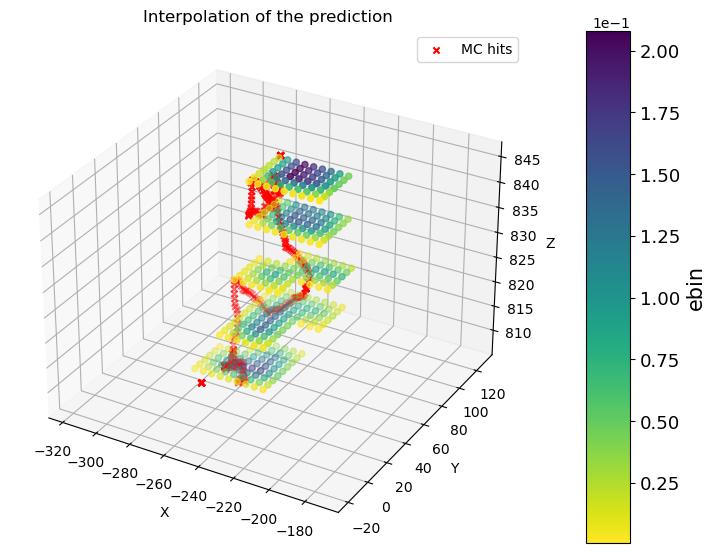

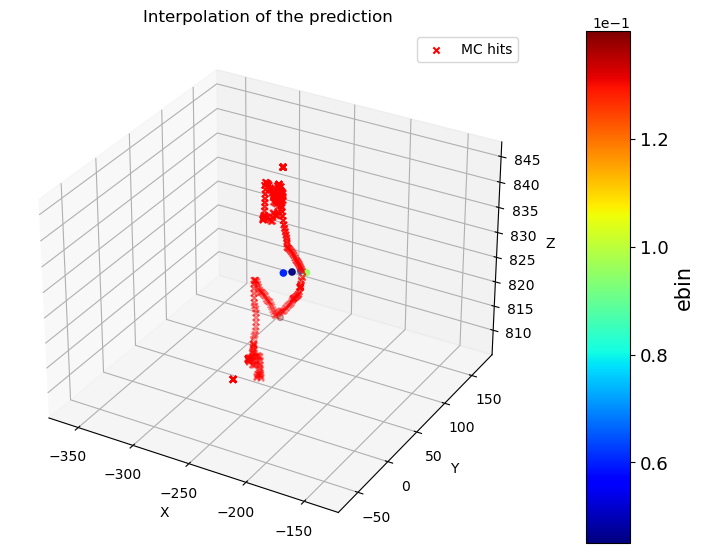

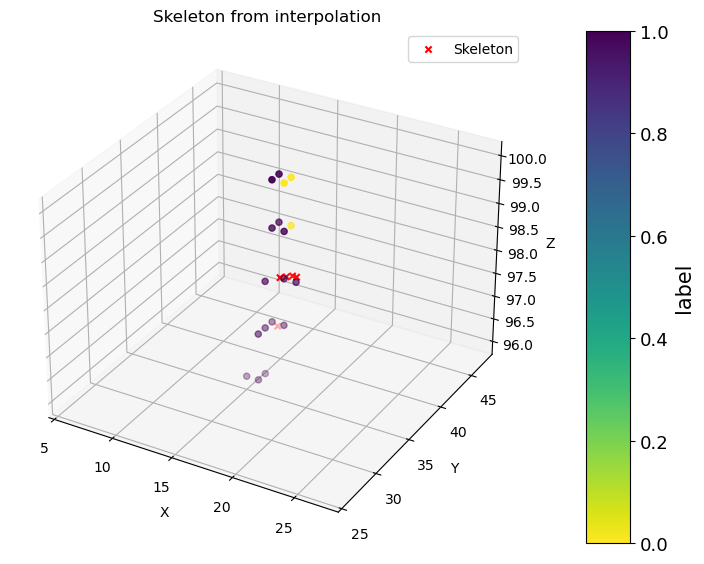

In [129]:
plot_3d_hits(df_interp, 'ebin', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Interpolation of the prediction',mc_hits=nexus_event, voxel_info=bins_info, buffer = 50)
plot_3d_hits(skeleton_interp_df, 'ebin', cmap=mpl.cm.jet, coords=['x', 'y', 'z'], frame_lims=None, title = f'Interpolation of the prediction',mc_hits=nexus_event, voxel_info=bins_info, buffer = 100)
plot_3d_hits(final_ev, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Skeleton from interpolation',mc_hits = skeleton_interp_df, mc_hits_label='Skeleton', buffer=10)

In [20]:
event

,label,energy,dataset_id,xbin,ybin,zbin,class_0,class_1,pred
0,0,0.000143,0,12,35,96,0.972973,0.027027,0
1,0,0.000143,0,12,35,100,0.953918,0.046082,0
2,0,0.000179,0,12,36,99,0.978996,0.021004,0
3,0,0.000143,0,12,38,99,0.987636,0.012364,0
4,0,0.000143,0,13,33,96,0.966807,0.033193,0
...,...,...,...,...,...,...,...,...,...
274,0,0.000322,0,20,37,99,0.981233,0.018767,0
275,0,0.000179,0,20,38,99,0.985597,0.014403,0
276,0,0.000179,0,20,39,98,0.972112,0.027888,0
277,0,0.000143,0,21,36,100,0.993915,0.006085,0


In [5]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd
from ipywidgets import interact, FloatSlider, fixed

# Sample Data
np.random.seed(42)
data = pd.DataFrame({
    'x': np.random.rand(100) * 10,
    'y': np.random.rand(100) * 10,
    'z': np.random.rand(100) * 10,
    'A': np.random.rand(100) * 100
})

# Function to plot with additional arguments
def plot_3d(threshold, df, variable='label', threshold_variable = 'class_1'):
    filtered_data = df[df[threshold_variable] > threshold]

    fig = go.Figure(data=go.Scatter3d(
        x=filtered_data['xbin'],
        y=filtered_data['ybin'],
        z=filtered_data['zbin'],
        mode='markers',
        marker=dict(
            size=3,
            color=filtered_data[variable],
            colorscale='Viridis',
            colorbar=dict(title='variable')
        )
    ))

    fig.update_layout(
        margin=dict(l=0, r=0, b=0, t=40),
        title=f'3D Scatter Plot with Threshold > {threshold}'
    )

    fig.show()

# Slider and Interaction
interact(
    plot_3d, 
    threshold=FloatSlider(min=0, max=1, step=0.1, value=0),
    df=fixed(event),          # Pass the DataFrame as a fixed variable
    variable=['label', 'energy', 'class_1'],  # Dropdown for variable shown
    threshold_variable = 'class_1'
)




interactive(children=(FloatSlider(value=0.0, description='threshold', max=1.0), Dropdown(description='variable…

<function __main__.plot_3d(threshold, df, variable='label', threshold_variable='class_1')>

In [3]:
! jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


### Selecting voxels

The idea behind this is to try to get rid of the most part of outer voxels, even though we delete some of the true inner voxels, but always without compromising the continuity of the track. What I thought is to create a graph, recognize what would be the main track, and rise the threshold until we get a splitting, where we should select the threshold

In [137]:
import networkx as nx

from scipy.spatial import KDTree

def create_graph(df, max_distance, coords):
    '''
    Creates a graph using a KDTree for efficient distance computations.
    '''
    nodes = [tuple(x) for x in df[coords].to_numpy()]

    graph = nx.Graph()
    graph.add_nodes_from(nodes)
    
    # Use KDTree for fast neighbor search
    kdtree = KDTree(nodes)
    pairs = kdtree.query_pairs(r=max_distance + sys.float_info.epsilon) # add epsilon to include the max_distance value itself
    
    # Add edges for nodes within max_distance
    for i, j in pairs:
        graph.add_edge(nodes[i], nodes[j])
    return graph

In [138]:
import matplotlib as mpl

In [139]:
def optimal_threshold(event, lowth, highth, precision = 6):
    # selects the initial main track voxels for reference
    initial_nvox = len(event)
    initial_G = create_graph(event, np.sqrt(3), ['xbin', 'ybin', 'zbin'])
    initial_main_track_voxels = max(list(nx.connected_components(initial_G)), key = len)

    # does a binary search loop, way faster than a range of thresholds
    while highth - lowth > 10**(-precision):
        mid = (highth + lowth) / 2
        ev = event[event.class_1 > mid]

        # if we don't have voxels, we reduce the high threshold and jump the other steps with the continue
        if len(ev) <= 1:
            highth = mid
            continue
        # I have checked that the typical ratio 0.144 approx, so if with a certain threshold we get lower than that, I don't want
        # that value to be the selected one, because would mean that we have less voxels than expexted. I'd rather stick with some
        # more voxels than the needed AND connected than lacking on voxels and losing the extremes/blobs for example
        # we try with one a little bit lower, just to 
        # if len(ev) / initial_nvox < 0.144:
        #     highth = mid
        #     continue
        #creates the graph for the thresholded event
        graph = create_graph(ev, np.sqrt(3), ['xbin', 'ybin', 'zbin'])
        #checks that the initial main track voxels are still in one component (the latest graph computed)
        subgraph = graph.subgraph(initial_main_track_voxels)
        # control that the subgraph is inside the main track, otherwise we have gone out of what we wanted
        if len(subgraph) == 0:
            highth = mid
            continue
        sub_is_conn = nx.is_connected(subgraph)
        if sub_is_conn:
            lowth = mid
        else:
            highth = mid
    return round(lowth, precision), graph

def optimal_threshold_plot(event, lowth, highth, precision = 6, nexus_event = pd.DataFrame([]), bins_info = pd.DataFrame([])):
    # selects the initial main track voxels for reference
    initial_nvox = len(event)
    initial_G = create_graph(event, np.sqrt(3), ['xbin', 'ybin', 'zbin'])
    initial_main_track_voxels = max(list(nx.connected_components(initial_G)), key = len)
    plot_3d_hits(event, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Original event',mc_hits = nexus_event, voxel_info=bins_info, cmlims=[0, 1])

    # does a binary search loop, way faster than a range of thresholds
    while highth - lowth > 10**(-precision):
        mid = (highth + lowth) / 2
        ev = event[event.class_1 > mid]

        # if we don't have voxels, we reduce the high threshold and jump the other steps with the continue
        if len(ev) <= 1:
            highth = mid
            continue
        # I have checked that the typical ratio 0.144 approx, so if with a certain threshold we get lower than that, I don't want
        # that value to be the selected one, because would mean that we have less voxels than expexted. I'd rather stick with some
        # more voxels than the needed AND connected than lacking on voxels and losing the extremes/blobs for example
        # we try with one a little bit lower, just to 
        # if len(ev) / initial_nvox < 0.144:
        #     highth = mid
        #     continue
        #creates the graph for the thresholded event
        graph = create_graph(ev, np.sqrt(3), ['xbin', 'ybin', 'zbin'])
        #checks that the initial main track voxels are still in one component (the latest graph computed)
        subgraph = graph.subgraph(initial_main_track_voxels)
        # control that the subgraph is inside the main track, otherwise we have gone out of what we wanted
        if len(subgraph) == 0:
            highth = mid
            continue
        sub_is_conn = nx.is_connected(subgraph)
        if sub_is_conn:
            lowth = mid
            print('Connected subgraph')
        else:
            highth = mid
            print('Broken subgraph')
        plot_3d_hits(ev, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Theshold = {mid:.5f}',mc_hits = nexus_event, voxel_info=bins_info, cmlims=[0, 1])
    return round(lowth, precision), graph

In [24]:
dat_id = 243 #160 # 4 (2 track event)
# evento 7 ejemplo muy bueno de  la mejora del código: antes "eliminaba" todos los satelites por asi decirlo, ahora se ve como elimina
# el espureo, pero el no espureo como es un grupo de mas de N (en este caso usé 10) voxeles, también lo tiene en cuenta y evita que desaparezca
event = prediction[prediction.dataset_id == dat_id].copy()

evt_info = events_info[events_info.dataset_id == dat_id]
reco_path = evt_info.pathname.values[0] + '/' + evt_info.basename.values[0]

hits = pd.read_hdf(reco_path, 'MC/hits')
reco_hits = pd.read_hdf(reco_path, 'RECO/Events')
nexus_event = hits[hits.event_id == evt_info.event_id.values[0]]
reco_event = reco_hits[reco_hits.event == evt_info.event_id.values[0]]

evt_voxel = events_voxel[events_voxel.dataset_id == dat_id] #from test file

In [11]:
from sklearn.decomposition import PCA

def get_track_extent(voxels):
    # Apply PCA to find principal axis and projections
    pca = PCA(n_components=1)
    proj = pca.fit_transform(voxels)
    return proj.max() - proj.min()

def get_track_projection(voxels):
    # Apply PCA to find principal axis and projections
    pca = PCA(n_components=1)
    proj = pca.fit_transform(voxels)
    return proj

In [12]:
nexus_G = create_graph(nexus_event, np.sqrt(3), ['x', 'y', 'z'])
initial_G = create_graph(event, np.sqrt(3), ['xbin', 'ybin', 'zbin'])
initial_components = list(nx.connected_components(initial_G))

In [15]:
th, deco_G = optimal_threshold_all_components(event, 0, 1, precision = 6, min_vox_track = 10)

In [16]:
get_track_extent(pd.DataFrame(list(deco_G)))/get_track_extent(pd.DataFrame(list(initial_G)))

0.8632667366114667

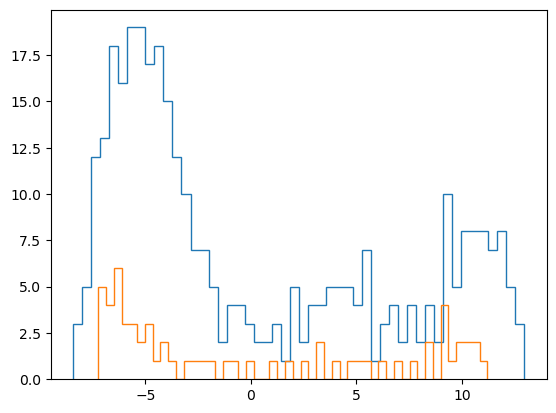

In [17]:
plt.hist(get_track_projection(pd.DataFrame(list(initial_G))), 50, histtype='step')
plt.hist(get_track_projection(pd.DataFrame(list(deco_G))), 50, histtype='step')
# plt.hist(get_track_extent(pd.DataFrame(list(nexus_G))), 50, histtype='step')

plt.show()

In [135]:
import networkx as nx
import numpy as np

def optimal_threshold_all_components(event, lowth, highth, precision = 6, min_vox_track = 5, extent_tol = 0.8):
    '''
    min_vox_track is the min number of voxels that a group of voxels has to have in an event to be taken into account
    with this, we make sure all the small "important" glumps get better results, and the spurious (which are typically 1 voxel) get deleted   
    '''

    # Step 1: Get the initial connected components (as lists of node identifiers)
    initial_G = create_graph(event, np.sqrt(3), ['xbin', 'ybin', 'zbin'])
    initial_components = [group for group in list(nx.connected_components(initial_G)) if len(group) > min_vox_track]  # List of sets, where tracks must have a minimum of voxels to be taken into account as an "important" track

    final_graph = None

    while highth - lowth > 10**(-precision):
        mid = (highth + lowth) / 2
        ev = event[event.class_1 > mid]

        if len(ev) <= 1:
            highth = mid
            continue

        graph = create_graph(ev, np.sqrt(3), ['xbin', 'ybin', 'zbin'])

        all_connected = True

        for comp in initial_components:
            # this makes sure one by one that all of them are "connected"
            subgraph = graph.subgraph(comp)
            if len(subgraph) == 0:
                all_connected = False
                break

            if not nx.is_connected(subgraph):
                all_connected = False
                break
            
        
        init_extent = get_track_extent(list(initial_G))
        deco_extent = get_track_extent(list(graph))
        extent_ok = (deco_extent / init_extent) >= extent_tol

        if all_connected & extent_ok:
            lowth = mid
            final_graph = graph  # save last valid graph
        else:
            highth = mid

    return round(lowth, precision), final_graph, round(deco_extent / init_extent, precision)

def optimal_threshold_all_components_plot(event, lowth, highth, precision = 6, min_vox_track = 5, nexus_event=pd.DataFrame([]), bins_info=pd.DataFrame([])):
    '''
    min_vox_track is the min number of voxels that a group of voxels has to have in an event to be taken into account
    with this, we make sure all the small "important" glumps get better results, and the spurious (which are typically 1 voxel) get deleted
    '''

    # Step 1: Get the initial connected components (as lists of node identifiers)
    initial_G = create_graph(event, np.sqrt(3), ['xbin', 'ybin', 'zbin'])
    initial_components = [group for group in list(nx.connected_components(initial_G)) if len(group) > min_vox_track]  # List of sets, where tracks must have a minimum of voxels to be taken into account as an "important" track

    plot_3d_hits(
        event, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'],
        frame_lims=None, title='Original event', mc_hits=nexus_event,
        voxel_info=bins_info, cmlims=[0, 1]
    )

    final_graph = None

    while highth - lowth > 10**(-precision):
        mid = (highth + lowth) / 2
        ev = event[event.class_1 > mid]

        if len(ev) <= 1:
            highth = mid
            continue

        graph = create_graph(ev, np.sqrt(3), ['xbin', 'ybin', 'zbin'])

        all_connected = True

        for i, comp in enumerate(initial_components):
            # this makes sure one by one that all of them are "connected"
            print(i)
            subgraph = graph.subgraph(comp)
            if len(subgraph) == 0:
                all_connected = False
                break

            if not nx.is_connected(subgraph):
                all_connected = False
                break

        if all_connected:
            lowth = mid
            final_graph = graph  # save last valid graph
            print('Connected')
        else:
            highth = mid
            print('Broken')

        plot_3d_hits(
            ev, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'],
            frame_lims=None, title=f'Threshold = {mid:.5f}', mc_hits=nexus_event,
            voxel_info=bins_info, cmlims=[0, 1]
        )

    return round(lowth, precision), final_graph


In [117]:
prediction

,label,energy,dataset_id,xbin,ybin,zbin,class_0,class_1
0,0,0.000402,0,37,51,52,0.956055,0.043945
1,0,0.000832,0,38,43,52,0.943413,0.056587
2,0,0.000463,0,38,44,52,0.953737,0.046263
3,0,0.000436,0,38,47,52,0.969048,0.030952
4,0,0.000938,0,38,47,53,0.966981,0.033019
...,...,...,...,...,...,...,...,...
5280416,0,0.000395,15037,30,30,60,0.925221,0.074779
5280417,0,0.000821,15037,30,31,60,0.955604,0.044396
5280418,0,0.000355,15037,30,33,61,0.976714,0.023286
5280419,0,0.000409,15037,30,34,61,0.971418,0.028582


In [148]:
thr

0.413452

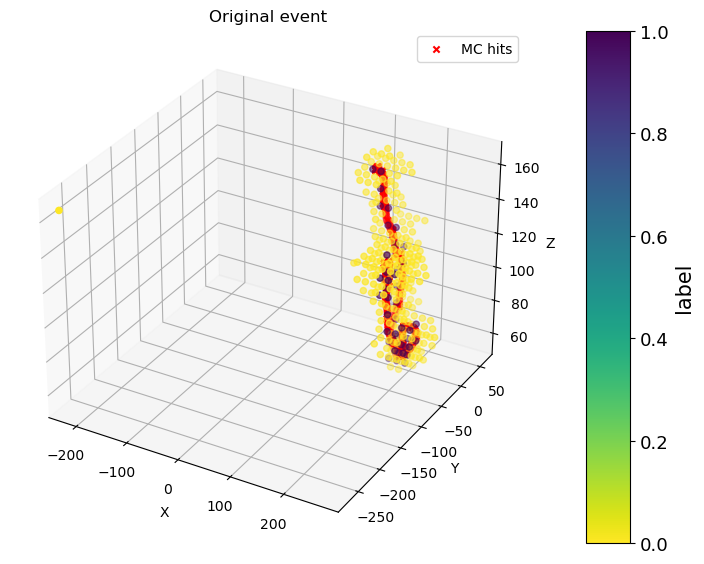

0
Connected


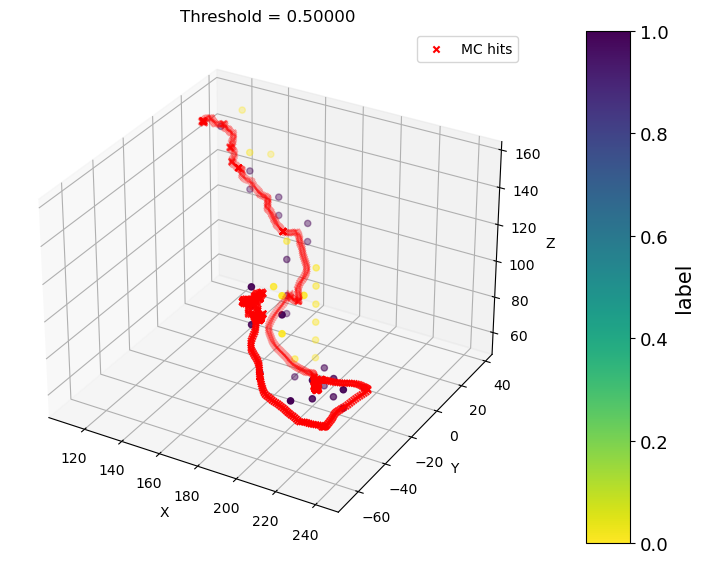

0
Connected


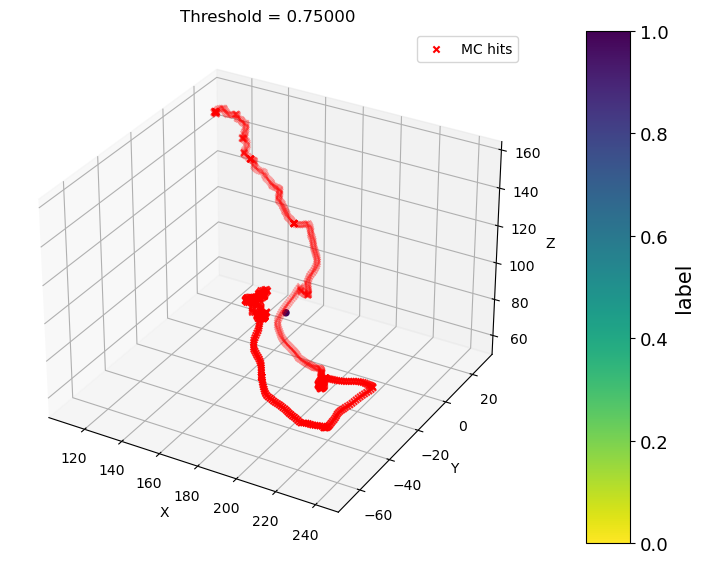

0
Connected


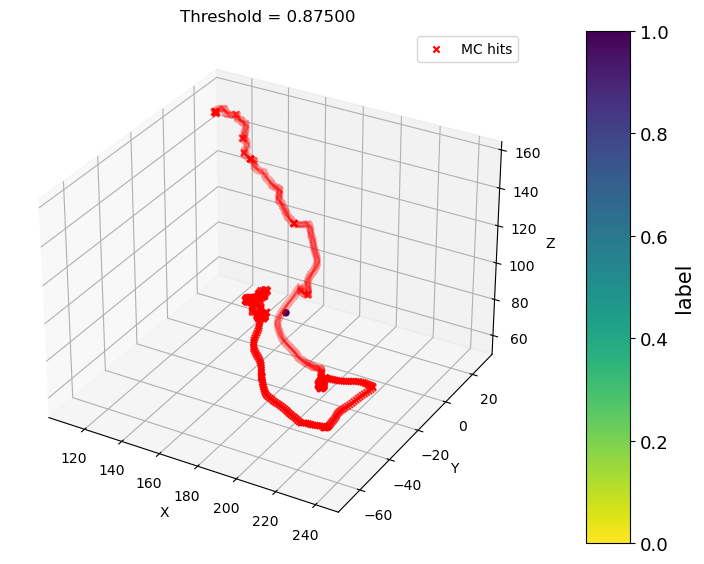

0
Connected


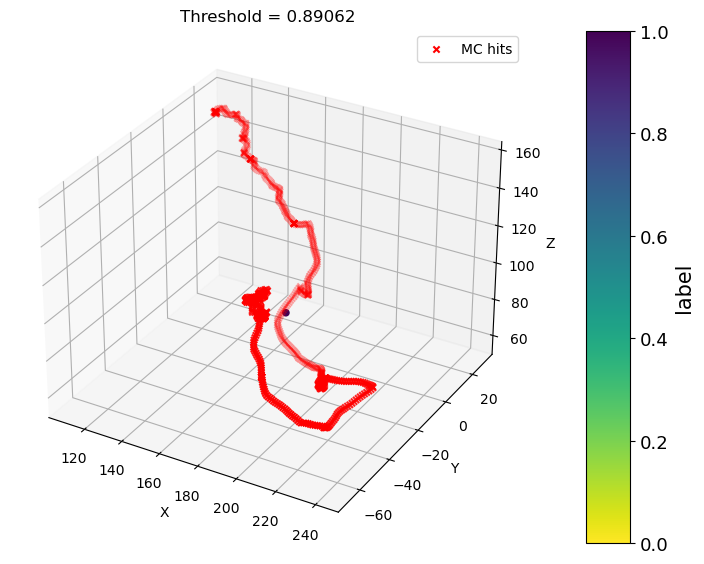

0
Connected


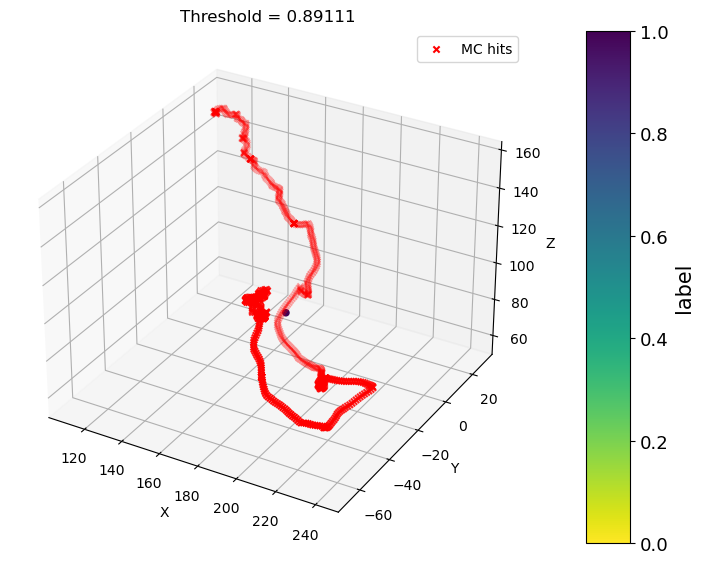

0
Connected


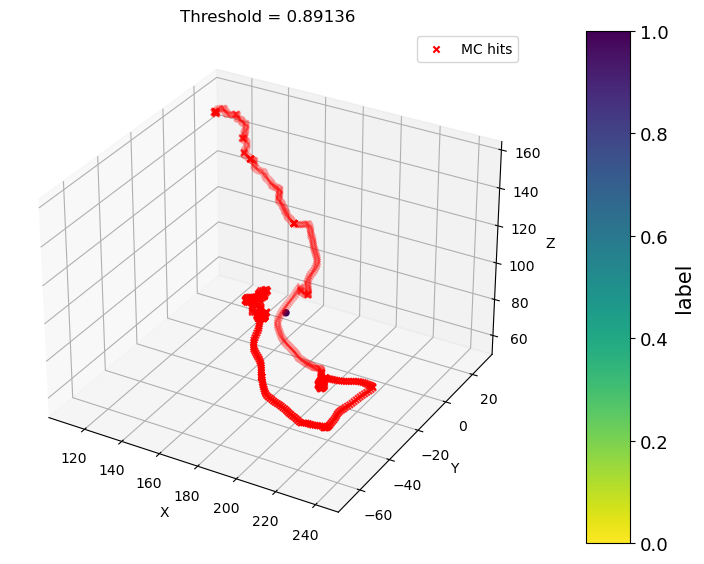

0
Connected


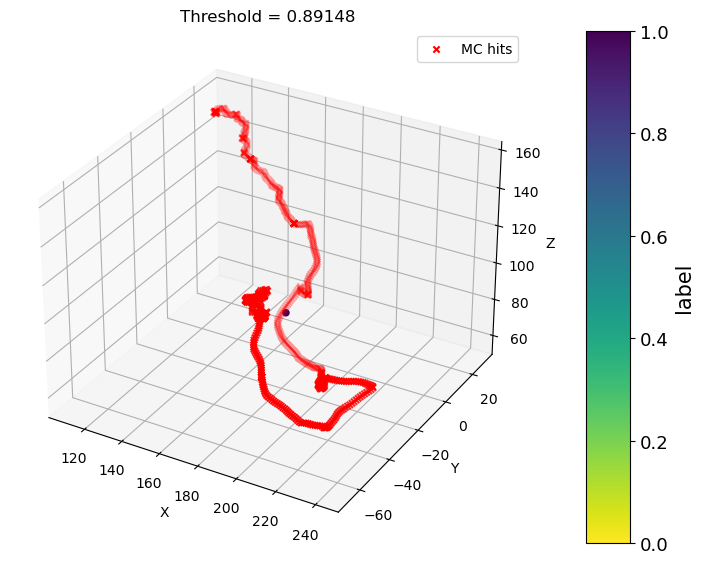

0
Connected


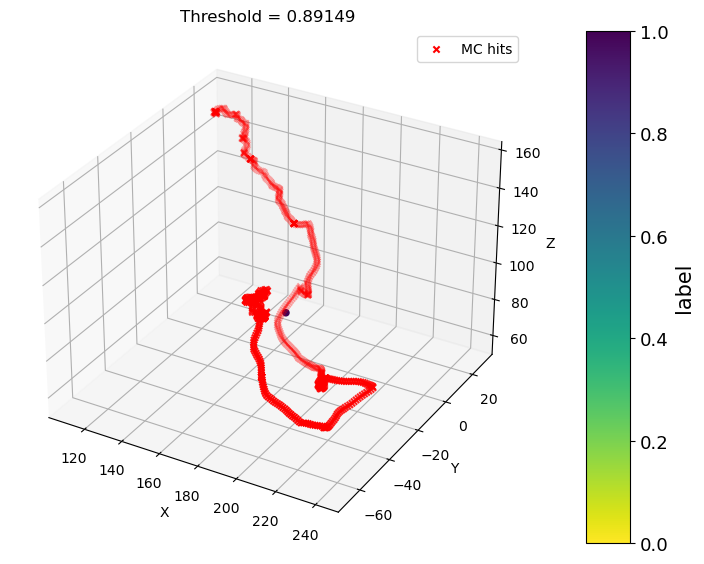

0
Connected


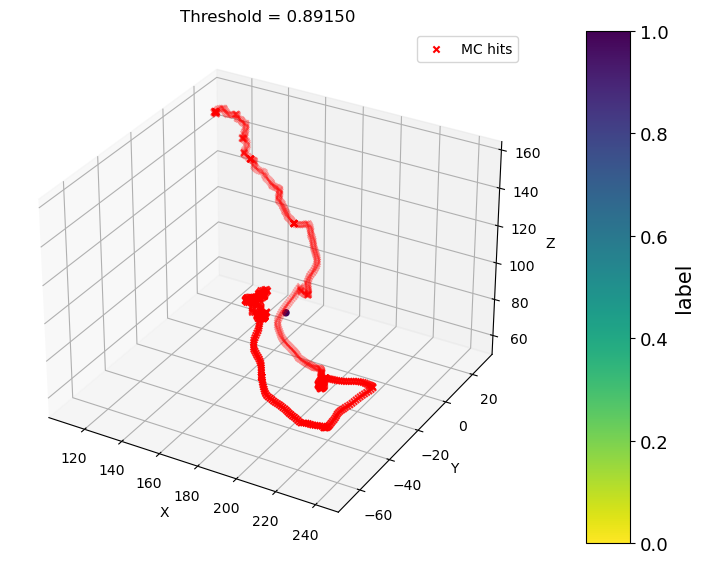

In [40]:
dat_id = 371 # 160 # 4 (2 track event)
# evento 7 ejemplo muy bueno de  la mejora del código: antes "eliminaba" todos los satelites por asi decirlo, ahora se ve como elimina
# el espureo, pero el no espureo como es un grupo de mas de N (en este caso usé 10) voxeles, también lo tiene en cuenta y evita que desaparezca
event = prediction[prediction.dataset_id == dat_id].copy()

evt_info = events_info[events_info.dataset_id == dat_id]
reco_path = evt_info.pathname.values[0] + '/' + evt_info.basename.values[0]

hits = pd.read_hdf(reco_path, 'MC/hits')
reco_hits = pd.read_hdf(reco_path, 'RECO/Events')
nexus_event = hits[hits.event_id == evt_info.event_id.values[0]]
reco_event = reco_hits[reco_hits.event == evt_info.event_id.values[0]]

evt_voxel = events_voxel[events_voxel.dataset_id == dat_id] #from test file


thr, graph = optimal_threshold_all_components_plot(event, 0, 1, precision = 6, min_vox_track = 10, nexus_event=nexus_event, bins_info=bins_info)


In [39]:
thr, graph = optimal_threshold_all_components(event, 0, 1, precision = 6, min_vox_track = 10, nexus_event=nexus_event, bins_info=bins_info)

In [381]:
test_file

'/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/HE_calib/4bar/trains/soph_deco/dataset_4bar_PORT_1a_label_scn_test.h5'

### FINAL THRESHOLDING FUNCTION

In [49]:
import glob
import pandas as pd
import tables as tb
import numpy as np
from invisible_cities.io.dst_io import df_writer

import networkx as nx
from scipy.spatial import KDTree
from sklearn.decomposition import PCA

def create_graph(df, max_distance, coords):
    '''
    Creates a graph using a KDTree for efficient distance computations.
    '''
    nodes = [tuple(x) for x in df[coords].to_numpy()]

    graph = nx.Graph()
    graph.add_nodes_from(nodes)
    
    # Use KDTree for fast neighbor search
    kdtree = KDTree(nodes)
    pairs = kdtree.query_pairs(r=max_distance + sys.float_info.epsilon) # add epsilon to include the max_distance value itself
    
    # Add edges for nodes within max_distance
    for i, j in pairs:
        graph.add_edge(nodes[i], nodes[j])
    return graph

def get_track_extent(voxels):
    # Apply PCA to find principal axis and projections
    pca = PCA(n_components=1)
    proj = pca.fit_transform(voxels)
    return proj.max() - proj.min()

def optimal_threshold_all_components(event, lowth, highth, precision = 6, min_vox_track = 5, extent_tol = 0.8):
    '''
    min_vox_track is the min number of voxels that a group of voxels has to have in an event to be taken into account
    with this, we make sure all the small "important" glumps get better results, and the spurious (which are typically 1 voxel) get deleted   
    '''

    # Step 1: Get the initial connected components (as lists of node identifiers)
    initial_G = create_graph(event, np.sqrt(3), ['xbin', 'ybin', 'zbin'])
    initial_components = [group for group in list(nx.connected_components(initial_G)) if len(group) > min_vox_track]  # List of sets, where tracks must have a minimum of voxels to be taken into account as an "important" track

    final_graph = None

    while highth - lowth > 10**(-precision):
        mid = (highth + lowth) / 2
        ev = event[event.class_1 > mid]

        if len(ev) <= 1:
            highth = mid
            continue

        graph = create_graph(ev, np.sqrt(3), ['xbin', 'ybin', 'zbin'])

        all_connected = True

        for comp in initial_components:
            # this makes sure one by one that all of them are "connected"
            subgraph = graph.subgraph(comp)
            if len(subgraph) == 0:
                all_connected = False
                break

            if not nx.is_connected(subgraph):
                all_connected = False
                break
            
        
        init_extent = get_track_extent(list(initial_G))
        deco_extent = get_track_extent(list(graph))
        extent_ok = (deco_extent / init_extent) >= extent_tol

        if all_connected & extent_ok:
            lowth = mid
            final_graph = graph  # save last valid graph
        else:
            highth = mid

    return round(lowth, precision), final_graph, round(deco_extent / init_extent, precision)

In [50]:
prec = 6
min_vox_track = 10
extent_tol = 0.85

min_thr = 0
max_thr = 1

In [51]:
original_file = test_file # file with no prediction performed
predict_file = pred_file #file with the prediction performed
out_file = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/HE_calib/4bar/trains/soph_deco/train_D/pred_file_thr.h5' # thr file (with saved thr) to save

In [52]:
len(events_info)

15038

In [ ]:
# evinf_df = pd.DataFrame([])
# events_info = pd.read_hdf(test_file, 'DATASET/EventsInfo')
# bins_info = pd.read_hdf(test_file, 'DATASET/BinsInfo')

# pred = pd.read_hdf(pred_file, 'DATASET/VoxelsPred')
# for dat_id, event in pred.groupby('dataset_id'):
#     if dat_id % 100 == 0:
#         print(dat_id)
#     thr, _, red = optimal_threshold_all_components(event, min_thr, max_thr, precision = prec, min_vox_track = min_vox_track, extent_tol=extent_tol)
#     evinf_df = evinf_df.append(pd.DataFrame({'dataset_id':[dat_id], 'threshold': [thr], 'reduction':[red]}))
#     thr_event = event[event.class_1 > thr]
#     thr_event = thr_event.assign(energy=lambda df: df['energy'] / df['energy'].sum())
#     thr_event['binclass'] = events_info[events_info.dataset_id == dat_id].binclass.values[0]
#     thr_event = thr_event.rename(columns={'label':'decolabel'})
#     thr_event = thr_event[['dataset_id', 'binclass', 'xbin', 'ybin', 'zbin', 'energy', 'decolabel', 'class_0', 'class_1']]
#     with tb.open_file(out_file, 'a') as h5out:
#         df_writer(h5out, thr_event, 'DATASET', 'Voxels', columns_to_index = ['dataset_id'])
        
# #mergear con events info
# assert len(events_info) == len(evinf_df)
# events_info = events_info.merge(evinf_df, on = 'dataset_id')
# #guardar events info con esta nueva info y bins info tal cual
# with tb.open_file(out_file, 'a') as h5out:
#     df_writer(h5out, bins_info, 'DATASET', 'BinsInfo')
#     df_writer(h5out, events_info, 'DATASET', 'EventsInfo', columns_to_index=['dataset_id'], str_col_length=128)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000


Añadir protección:
* Una traza no puede acabar con menos de X voxeles, por ejemplo
* Una traza no puede acabar con menos de un % de voxeles, por ejemplo (esto ya lo probé, pero va a depender de tener un MC entonces no me cunde)
* Una traza no puede acabar con una distancia PCA mucho inferior a la que tenía originalmente (pero cuanto inferior sería el caso?)

# aqui una vez tenemos esos thresholds calculados evento a evento, vemos que cositas pasan

In [56]:
# FILE WITH ALREADY THRESHOLDED EVENTS
pred_thr_file = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/HE_calib/4bar/trains/soph_deco/train_D/pred_file_thr.h5'
thr_values = pd.read_hdf(pred_thr_file, 'DATASET/EventsInfo') 


pred_thr = prediction[prediction['class_1'] > prediction['dataset_id'].map(thr_values.set_index('dataset_id')['threshold'])]
pred_thr['prediction'] = 1
prediction = prediction.merge(pred_thr[['dataset_id', 'xbin', 'ybin', 'zbin', 'label', 'prediction']], on = ['dataset_id', 'xbin', 'ybin', 'zbin', 'label'], how = 'outer').fillna(0)
prediction.prediction = prediction.prediction.astype('int')

print(thr_values.threshold.mean())

/scratch/718985/ipykernel_3029213/251652866.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_thr['prediction'] = 1


0.26595690031919295


In [57]:
#vamos a poner como que todos los voxeles son 1 para contabilizar la predicción si no se aplicara ningún tipo de deconvolución
prediction_no_net = prediction.copy()
prediction_no_net['prediction'] = 1

In [60]:
chamfer, hausdorff = compute_chamfer_and_hausdorff_distance(prediction, score_threshold=None, elevate = 1)
chamfer_no_net, hausdorff_no_net = compute_chamfer_and_hausdorff_distance(prediction_no_net, score_threshold=None, elevate = 1)

In [61]:
sqchamfer, sqhausdorff = compute_chamfer_and_hausdorff_distance(prediction, score_threshold=None, elevate = 2)
sqchamfer_no_net, sqhausdorff_no_net = compute_chamfer_and_hausdorff_distance(prediction_no_net, score_threshold=None, elevate = 2)

In [62]:
np.mean(chamfer), np.mean(chamfer_no_net)

(0.41688310367892367, 0.6929966479566159)

In [63]:
np.mean(sqchamfer), np.mean(sqchamfer_no_net)

(1.8437022268369, 2.553513773971396)

In [64]:
cmap = plt.cm.viridis.copy()

### Por lo que veo, con la distancia sin square hay 2 picos, uno que sería el normal (que tambien veo en sq chamfer), y otro como agalopado a el. Luce que son todos los eventos que en el squared se ven muy castigados (por una de las partes entiendo, o quizas no), que aqui se agalopan antez por alguna razón
### el caso es que en el squared veo una mejora muy sharp, pero no en tantos eventos, y en la no squared veo que todos mejoran, aunque no tan sharp (yo personalmente me quedaría con esta ultima porque manda el mensaje de que todos mejoran, pero weno, y además tiene más sentido como "distancia")

In [65]:
print('CHAMFER NO SQUARE SAYS:')
print('Mean improve: {:.2f}%'.format((1 - (np.mean(chamfer) / np.mean(chamfer_no_net))) * 100))
print('Improved tracks: {:.2f}%'.format(100 * sum(np.array(chamfer) < np.array(chamfer_no_net)) / len(chamfer)))

CHAMFER NO SQUARE SAYS:
Mean improve: 39.84%
Improved tracks: 99.51%


In [66]:
print('CHAMFER SQUARE SAYS:')
print('Mean improve: {:.2f}%'.format((1 - (np.mean(sqchamfer) / np.mean(sqchamfer_no_net))) * 100))
print('Improved tracks: {:.2f}%'.format(100 * sum(np.array(sqchamfer) < np.array(sqchamfer_no_net)) / len(sqchamfer)))

CHAMFER SQUARE SAYS:
Mean improve: 27.80%
Improved tracks: 80.44%


In [82]:
np.mean(chamfer) 

0.41688310367892367

In [83]:
np.mean(chamfer_no_net) 

0.6929966479566159

0.6929966479566159

In [41]:
np.linspace(0, 256, 6)

array([  0. ,  51.2, 102.4, 153.6, 204.8, 256. ])

In [35]:
cmap(300000)

(0.993248, 0.906157, 0.143936, 1.0)

In [62]:
3.5*0.75

2.625

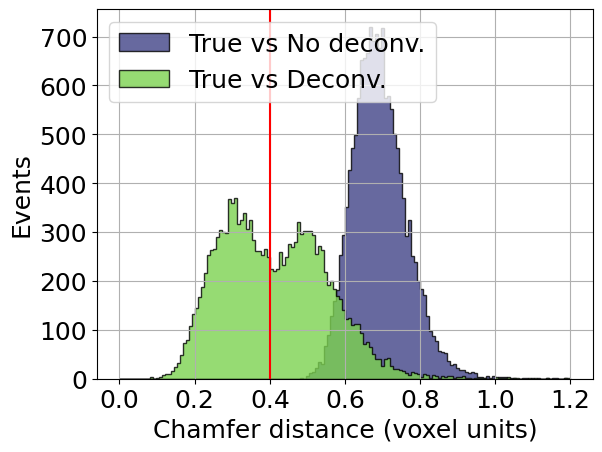

In [69]:
plt.hist(chamfer_no_net, 150, (0, 1.2), label = 'True vs No deconv.', color = cmap(51), histtype='stepfilled', alpha = 0.8, edgecolor = 'black')
plt.hist(chamfer, 150, (0, 1.2), label = 'True vs Deconv.', color = cmap(205), histtype='stepfilled', alpha = 0.8, edgecolor = 'black')
# plt.yscale('log')
plt.axvline(0.4, c='r')
plt.legend(fontsize = 18, loc = 'upper left')
plt.xlabel('Chamfer distance (voxel units)', size = 18)
plt.ylabel('Events', size = 18)
plt.xticks(size = 18)
plt.yticks(size = 18)
plt.grid()

# plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/chamfer_distance.pdf', dpi=600, bbox_inches='tight', transparent = True) 

In [71]:
len(chamfer)

15038

In [72]:
prediction

,label,energy,dataset_id,xbin,ybin,zbin,class_0,class_1,prediction
0,0,0.000402,0,37,51,52,0.990994,0.009006,0
1,0,0.000832,0,38,43,52,0.982120,0.017880,0
2,0,0.000463,0,38,44,52,0.986068,0.013932,0
3,0,0.000436,0,38,47,52,0.990501,0.009499,0
4,0,0.000938,0,38,47,53,0.988597,0.011403,0
...,...,...,...,...,...,...,...,...,...
5280416,0,0.000395,15037,30,30,60,0.918964,0.081036,0
5280417,0,0.000821,15037,30,31,60,0.954059,0.045941,0
5280418,0,0.000355,15037,30,33,61,0.980561,0.019439,0
5280419,0,0.000409,15037,30,34,61,0.977672,0.022328,0


In [74]:
events_info['chamfer'] = chamfer

In [83]:
events_info[events_info.chamfer < 0.4].sum().binclass / 7524

0.37440191387559807

In [80]:
events_info[events_info.chamfer >= 0.4].sum().binclass / 7514

0.5286132552568539

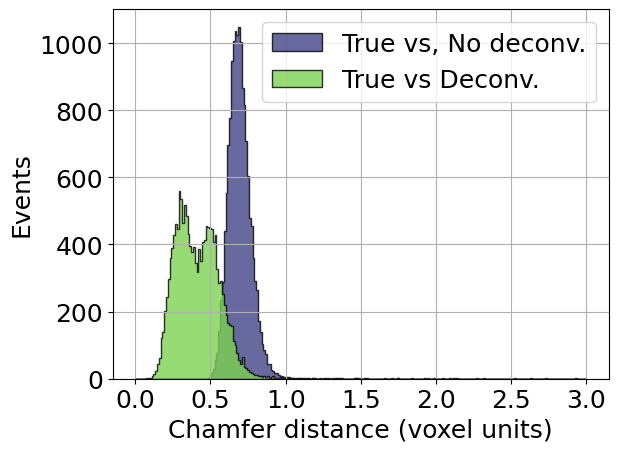

In [ ]:
plt.hist(chamfer_no_net, 250, (0, 3), label = 'True vs No deconv.', color = cmap(51), histtype='stepfilled', alpha = 0.8, edgecolor = 'black')
plt.hist(chamfer, 250, (0, 3), label = 'True vs Deconv.', color = cmap(205), histtype='stepfilled', alpha = 0.8, edgecolor = 'black')
# plt.yscale('log')
plt.legend(fontsize = 18, loc = 'upper right')
plt.xlabel('Chamfer distance (voxel units)', size = 18)
plt.ylabel('Events', size = 18)
plt.xticks(size = 18)
plt.yticks(size = 18)
plt.grid()

# plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/chamfer_distance_scaled.pdf', dpi=600, bbox_inches='tight', transparent = True) 

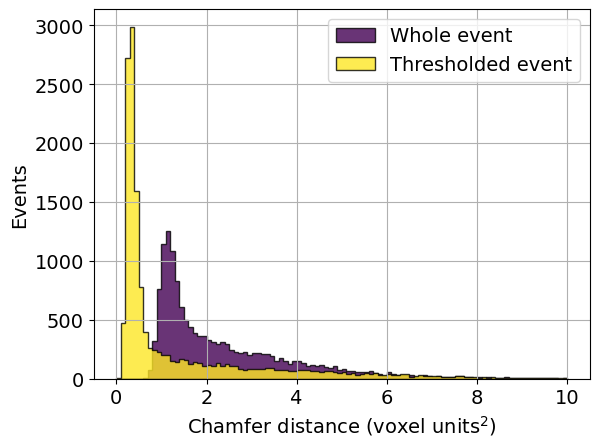

In [33]:
plt.hist(sqchamfer_no_net, 100, (0, 10), label = 'Whole event', color = cmap(0), histtype='stepfilled', alpha = 0.8, edgecolor = 'black')
plt.hist(sqchamfer, 100, (0, 10), label = 'Thresholded event', color = cmap(cmap.N -1), histtype='stepfilled', alpha = 0.8, edgecolor = 'black')
# plt.yscale('log')
plt.legend(fontsize = 14)
plt.xlabel('Chamfer distance (voxel units$^2$)', size = 14)
plt.ylabel('Events', size = 14)
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.grid()

plt.savefig('/home/usc/ie/mpm/deconv_poster_plots/chamfer_distance_sq.pdf', dpi=600, bbox_inches='tight', transparent = True) 

In [ ]:
# ESTO ES LA OPCION QUE TE LO HACE DIRECTAMENTE SIN HACER EL ROLLO DEL DATAFRAME DE ARRIBA DE LA PREDICTION
# fichero con los eventos predichos ya preparaditos (es donde tengo la info del threshold por cada evento en events info)
test_file_pred = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/HE_calib/4bar/trains/soph_deco/train_B/dataset_4bar_PORT_1a_label_scn_DECO_test.h5'
evs_info_pred = pd.read_hdf(test_file_pred, 'DATASET/EventsInfo')

# fichero output directo de la red (es donde los eventos aun no tienen el threshold aplicado)
test_file_pred_original = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/HE_calib/4bar/trains/soph_deco/train_B/pred_file_test_0.h5'
voxels_pred = pd.read_hdf(test_file_pred_original, 'DATASET/VoxelsPred')

ch_dis, haus_dis = compute_chamfer_and_hausdorff_distance_evnt_info(prediction, evs_info_pred)

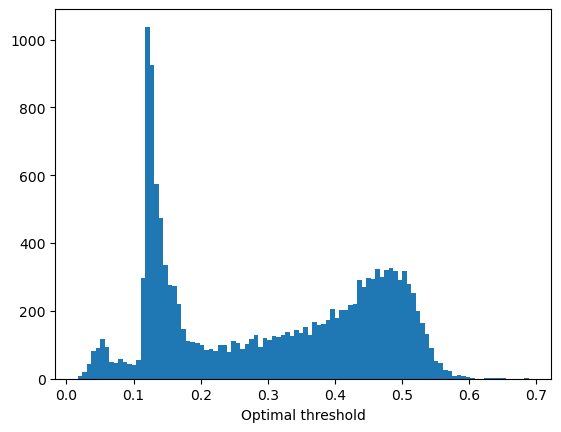

In [127]:
plt.hist(thresholds, 100)
plt.xlabel('Optimal threshold')
plt.show()

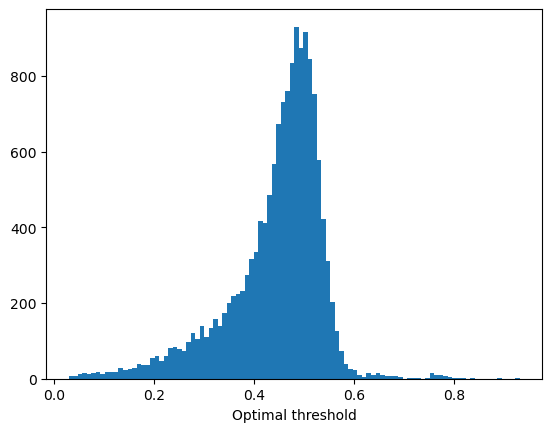

In [16]:
plt.hist(thresholds, 100)
plt.xlabel('Optimal threshold')
plt.show()

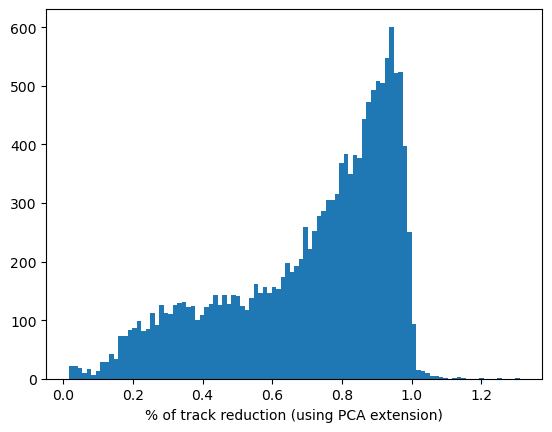

In [23]:
plt.hist(reduction, 100)
plt.xlabel('% of track reduction (using PCA extension)')
plt.show()

los mayores a 1????

In [29]:
threshold_pred = prediction[prediction['class_1'] > np.array(thresholds)[prediction['dataset_id'].values]]

In [30]:
threshold_pred['norm_energy'] = threshold_pred.groupby('dataset_id')['energy'].transform(lambda x: x / x.sum())

/scratch/13609104/ipykernel_3250411/877336183.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  threshold_pred['norm_energy'] = threshold_pred.groupby('dataset_id')['energy'].transform(lambda x: x / x.sum())


In [31]:
events_info['seg_thr'] = thresholds

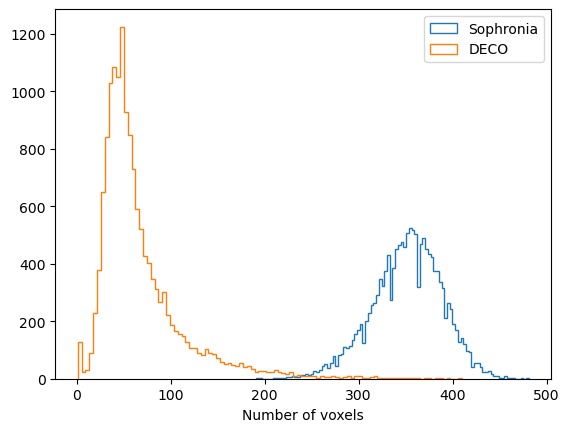

In [32]:
plt.hist(prediction.groupby('dataset_id').count().label, 100, label = 'Sophronia', histtype='step')
plt.hist(threshold_pred.groupby('dataset_id').count().label, 100, label = 'DECO', histtype='step')
plt.xlabel('Number of voxels')
plt.legend()
plt.show()


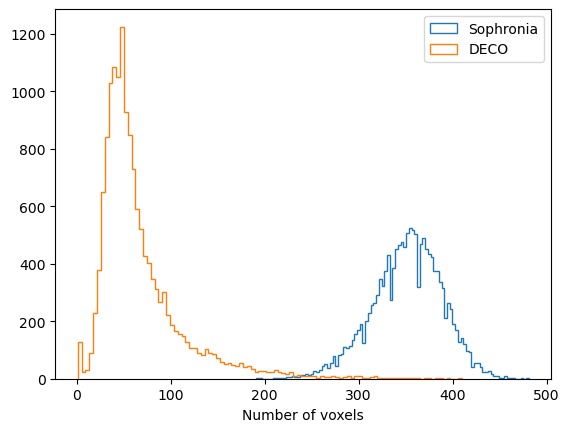

In [33]:
plt.hist(prediction.groupby('dataset_id').count().label, 100, label = 'Sophronia', histtype='step')
plt.hist(threshold_pred.groupby('dataset_id').count().label, 100, label = 'DECO', histtype='step')
plt.xlabel('Number of voxels')
plt.legend()
plt.show()


In [45]:
threshold_pred.groupby('dataset_id').count()[threshold_pred.groupby('dataset_id').count().label == 1]

,label,energy,xbin,ybin,zbin,class_0,class_1
dataset_id,,,,,,,
371,1,1,1,1,1,1,1
748,1,1,1,1,1,1,1
2992,1,1,1,1,1,1,1
6311,1,1,1,1,1,1,1
6331,1,1,1,1,1,1,1
6671,1,1,1,1,1,1,1
8204,1,1,1,1,1,1,1
8475,1,1,1,1,1,1,1
10480,1,1,1,1,1,1,1


In [34]:
events_info[[r > 1 for r in reduction]]

,event_id,binclass,dataset_id,pathname,basename,label_pathname,label_basename,total_energy,seg_thr
11,81000011,0,11,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1351_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1351_208Tl.h5,1.654440,0.256648
83,81000087,0,83,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1351_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1351_208Tl.h5,1.622788,0.237226
121,81060022,0,121,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1352_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1352_208Tl.h5,1.691449,0.187840
216,81120019,0,216,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1353_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1353_208Tl.h5,1.702831,0.201571
311,81180000,1,311,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1354_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1354_208Tl.h5,1.685681,0.325075
...,...,...,...,...,...,...,...,...,...
14577,89700015,1,14577,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1496_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1496_208Tl.h5,1.630645,0.036525
14821,89820061,1,14821,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1498_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1498_208Tl.h5,1.604240,0.198870
14896,89880062,1,14896,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1499_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1499_208Tl.h5,1.648689,0.272270
14910,89880076,0,14910,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1499_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1499_208Tl.h5,1.709084,0.038982


In [35]:
threshold_pred[threshold_pred.dataset_id == 11]

,label,energy,dataset_id,xbin,ybin,zbin,class_0,class_1,norm_energy
3859,0,0.002617,11,24,27,114,0.738839,0.261161,0.003869
3860,0,0.001800,11,24,27,115,0.719843,0.280157,0.002661
3861,0,0.002734,11,24,28,113,0.732775,0.267225,0.004042
3862,0,0.002292,11,24,28,114,0.738656,0.261344,0.003388
3873,0,0.000609,11,25,24,117,0.742606,0.257394,0.000901
...,...,...,...,...,...,...,...,...,...
4216,1,0.002058,11,37,36,98,0.504191,0.495809,0.003042
4217,0,0.009041,11,37,37,97,0.484883,0.515116,0.013364
4218,0,0.001019,11,37,38,97,0.711237,0.288763,0.001506
4221,0,0.003222,11,38,37,98,0.740832,0.259168,0.004762


In [43]:
evt_info

,event_id,binclass,dataset_id,pathname,basename,label_pathname,label_basename,total_energy,seg_thr
11,81000011,0,11,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1351_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1351_208Tl.h5,1.65444,0.256648


In [44]:
dat_id = 311 
event = prediction[prediction.dataset_id == dat_id].copy()
event_th = threshold_pred[threshold_pred.dataset_id == dat_id].copy()

evt_info = events_info[events_info.dataset_id == dat_id]
reco_path = evt_info.pathname.values[0] + '/' + evt_info.basename.values[0]

hits = pd.read_hdf(reco_path, 'MC/hits')
reco_hits = pd.read_hdf(reco_path, 'RECO/Events')
nexus_event = hits[hits.event_id == evt_info.event_id.values[0]]
reco_event = reco_hits[reco_hits.event == evt_info.event_id.values[0]]

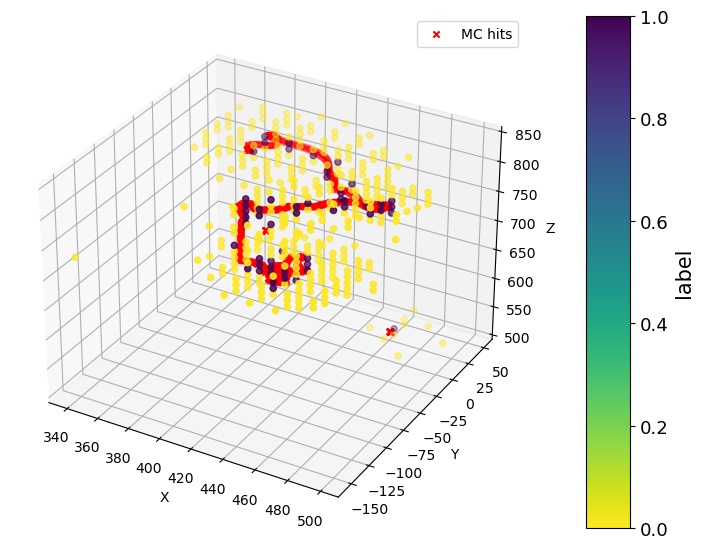

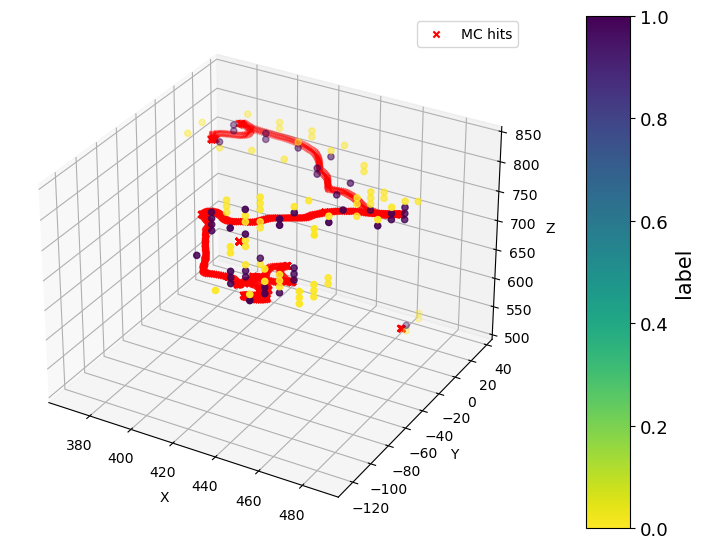

In [45]:
plot_3d_hits(event, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'],
            frame_lims=None, mc_hits=nexus_event,
            voxel_info=bins_info, cmlims=[0, 1]
        )
plot_3d_hits(event_th, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'],
            frame_lims=None, mc_hits=nexus_event,
            voxel_info=bins_info, cmlims=[0, 1]
        )

ATENCION A LOS EVENTOS CON NUMERO DE VOXELS MUY BAJO, LUCE QUE ESTÁN FALLANDO (PROBABLEMENTE POR LO Q YO PIENSO DE LOS EXTREMOS)

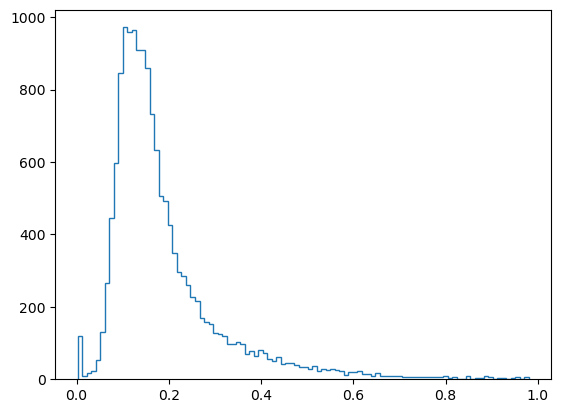

In [64]:
plt.hist(threshold_pred.groupby('dataset_id').count().label / prediction.groupby('dataset_id').count().label, 100, label = 'Sophronia', histtype='step')
plt.show()

### En principio para feedear la energía a la red no necesito el valor real, siendo consistente ya me llega con la nueva energía distribuida... Entonces lo mejor sería sustituir la vieja energía por la nueva y punto...

In [73]:
events_info

,event_id,binclass,dataset_id,pathname,basename,label_pathname,label_basename,total_energy,seg_thr
0,81000000,0,0,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1351_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1351_208Tl.h5,1.542916,0.468160
1,81000001,0,1,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1351_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1351_208Tl.h5,1.724690,0.124484
2,81000002,1,2,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1351_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1351_208Tl.h5,1.516794,0.526344
3,81000003,1,3,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1351_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1351_208Tl.h5,1.655073,0.417774
4,81000004,0,4,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1351_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1351_208Tl.h5,1.505256,0.455048
...,...,...,...,...,...,...,...,...,...
15033,89940108,0,15033,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1500_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1500_208Tl.h5,1.657503,0.276811
15034,89940109,0,15034,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1500_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1500_208Tl.h5,1.656534,0.442805
15035,89940110,0,15035,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1500_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1500_208Tl.h5,1.578318,0.506996
15036,89940111,1,15036,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_1500_208Tl.h5,/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT...,sophronia_label_1500_208Tl.h5,1.594299,0.382254


In [74]:
bins_info

,min_x,total_x,size_x,max_x,nbins_x,min_y,total_y,size_y,max_y,nbins_y,...,total_z,size_z,max_z,nbins_z,detector_db,binning,Rmax,loss_th,ener_th,max_dis
0,-490.4,972.65,15.55,497.8,64,-487.7,972.65,15.55,500.5,64,...,1300,10,1300,130,next100,sipm,500,0.25,None,1.732051


Y sería guardar de nuevo este fichero, ahora con esta info e punch non?

Tendría q repensar:

1. Como mejorar el thresholding (lo de principal components analysis por ej)
2. distribuir energía, tengo que hacer algo mejor que lo que hago?

28         0.012996
30         0.014260
31         0.004913
33         0.006698
34         0.005321
             ...   
5280334    0.037945
5280335    0.026979
5280342    0.031265
5280343    0.038513
5280382    0.025146
Name: energy, Length: 1011531, dtype: float32

In [33]:
thr

0.201662

0.14415904643546895


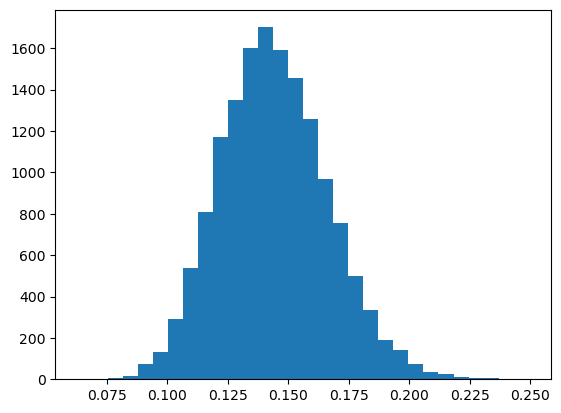

In [207]:
nvox_mc = prediction[prediction.label == 1].groupby('dataset_id').sum().label
nvox_reco = prediction.groupby('dataset_id').count().label
print(np.mean(nvox_mc / nvox_reco))
plt.hist(nvox_mc / nvox_reco, 30)
plt.show()


Puede pasar que todos los voxeles que se van quitando sigan siendo conexos; en ese caso, podríamos vernos reduciendo una traza a 2 voxeles centrales, obviando las colas de la traza, lo cual no tendría sentido. Esto se podría controlar de varias formas, por ejemplo si vemos que el número de voxeles promedio de MC por evento es V, pedir que no disminuya de eso; o quizás el RATIO entre voxeles de MC y sus trazas reco, quizás se mantiene más...

Quizás esto es ser demasiado exquisitos, y lo que debería hacer es escoger un threshold (juzgando por las métricas usadas) y si ROMPE la traza, bajarlo para evitarlo. Realmente no requiere ningún cambio, requiere que highth sea el threshold máximo que estoy dispuesto a subir (juzgando por las métricas) y dejar al bicho que funcione. En muchos casos, evidentemente, el algoritmo decidirá que el threshold es el mismo que el highthreshold (en los casos en los que con ese threshold no se rompa la traza), y en los casos en los que sí que se rompa la traza, simplemente lo bajará para recuperar la conectividad. Este proceso no funciona para los casos que no tenemos el true, ya que no podríamos estimar previamente un threshold ni nada por el estilo; tendríamos más bien que afinar este algoritmo para que ni se rompan las trazas, ni nos pasemos quitando voxeles aunque se mantenga la conectividad.

Voy a probar a poner highth 1 sin ningún tipo de restricción, a ver si las métricas se desbocan o si dan cosas con xeito... 

Luego probaré poniéndole la restricción del ratio de voxeles por si acaso, aunque es un approach que no me encanta la verdad

In [53]:
optimal_threshold_all_components?

Signature:
optimal_threshold_all_components(
    event,
    lowth,
    highth,
    precision=6,
    min_vox_track=5,
    nexus_event=Empty DataFrame
Columns: []
Index: [],
    bins_info=Empty DataFrame
Columns: []
Index: [],
)
Docstring: min_vox_track is the min number of voxels that a group of voxels has to have in an event to be taken into account
File:      /scratch/13584408/ipykernel_3121076/569668674.py
Type:      function


In [ ]:
opt_th = []
ch_dis, ha_dis = [], []
accur, intovun = [], []
tot_acc = []
lowth, highth = 0, 1
for did, df in prediction.groupby('dataset_id'):
    print(did)
    thresh, G = optimal_threshold_all_components(df, lowth, highth, precision = 6, min_vox_track=10)
    opt_th.append(thresh)

    dists = compute_chamfer_and_hausdorff_distance(df, score_threshold=thresh)
    ch_dis.append(dists[0][0])
    ha_dis.append(dists[1][0])

    metrs = acc_and_IoU(df.label.values, (df.class_1 > thresh).astype('int').values, nclass = 2)
    accur.append(metrs[0])
    tot_acc.append(metrs[1])
    intovun.append(metrs[2])
    


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [37]:
[ch for ch in ch_dis if ch != np.inf]

[0.3754524886877828,
 1.0433265236636022,
 0.375,
 0.49752192146397256,
 0.30353535353535355,
 0.2619736419157827,
 0.3058668424522083,
 3.6100000000000003,
 0.41692307692307695,
 1.1025991792065661,
 0.42868589743589747,
 0.5134836427939876,
 0.28509132795787395,
 0.46287279367011563,
 0.3568215892053973,
 7.9603174603174605,
 0.5523079049198453,
 0.4173913043478261,
 0.3859236002093145,
 0.5074404761904762,
 0.42966751918158563,
 0.482843137254902,
 0.3663768115942029,
 0.28703703703703703,
 0.24772727272727274,
 0.44235526966848093,
 0.490180978051598,
 1.9247491638795986,
 0.5049418604651162,
 0.4491963260619977,
 0.4738636363636364,
 0.499266862170088,
 0.44047619047619047,
 0.5166666666666666,
 0.35212765957446807,
 0.6453634085213034,
 0.37649769585253456,
 0.339572192513369,
 0.3788265306122449,
 13.638461538461538,
 0.40442427680090753,
 0.478844169246646,
 0.2836879432624113,
 0.5128205128205128,
 0.5229978354978355,
 0.4276755852842809,
 1.075716845878136,
 1.263095238095238

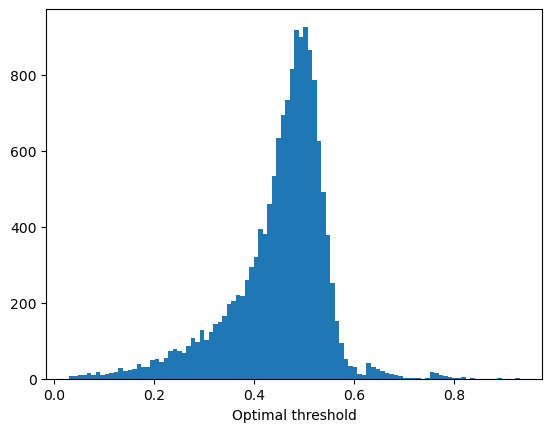

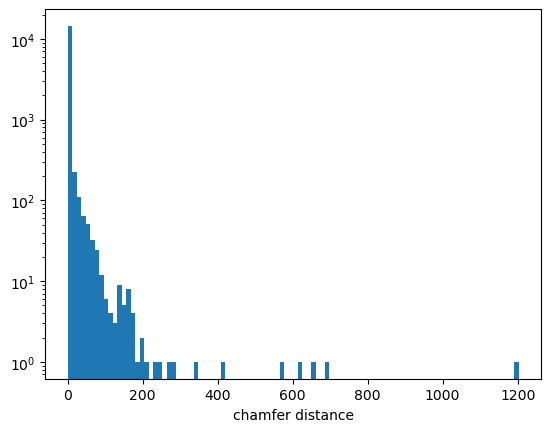

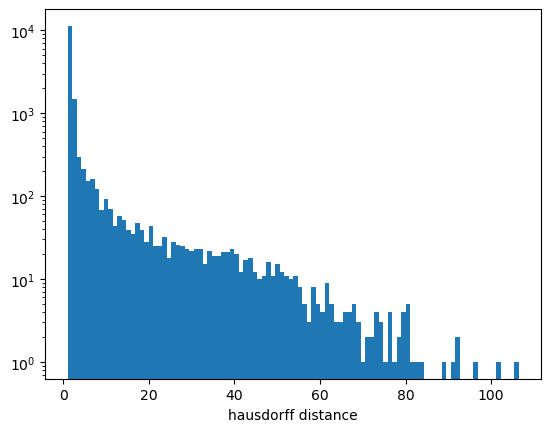

In [40]:
plt.hist(opt_th, 100)
# plt.yscale('log')
plt.xlabel('Optimal threshold')
plt.show()

plt.hist([ch for ch in ch_dis if ch != np.inf], 100)
plt.yscale('log')
plt.xlabel('chamfer distance')
plt.show()

plt.hist([ha for ha in ha_dis if ha != np.inf], 100)
plt.yscale('log')
plt.xlabel('hausdorff distance')
plt.show()


Text(0.5, 0, 'Total accuracy')

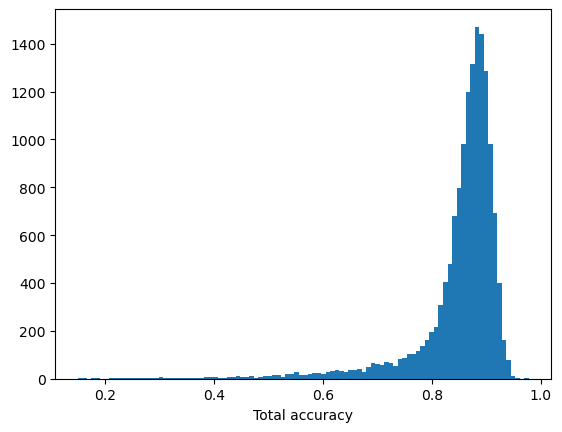

In [259]:
plt.hist(tot_acc, 100)
plt.xlabel('Total accuracy')

Text(0.5, 0, 'Accuracy')

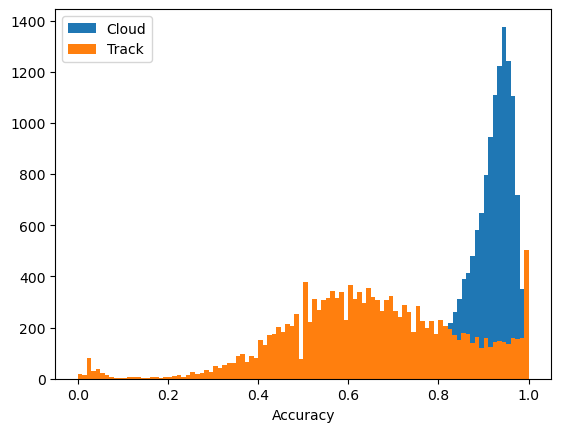

In [257]:
plt.hist(np.array(accur)[:, 0], 100, label = 'Cloud')
plt.hist(np.array(accur)[:, 1], 100, label = 'Track')
plt.legend()
plt.xlabel('Accuracy')

Text(0.5, 0, 'IoU')

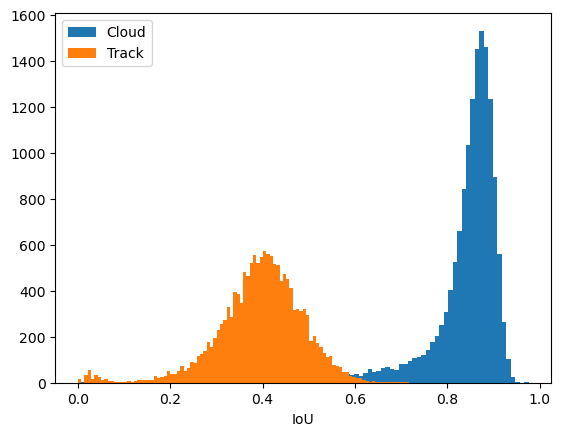

In [258]:
plt.hist(np.array(intovun)[:, 0], 100, label = 'Cloud')
plt.hist(np.array(intovun)[:, 1], 100, label = 'Track')
plt.legend()
plt.xlabel('IoU')